In [1]:
import os
import sys

from copy import deepcopy
from collections import Counter
from nltk.tag import CRFTagger

from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import classification_report

from matplotlib import pyplot as plt
import numpy as np

import re
import unicodedata

import pandas as pd

seed = 5

In [2]:
# Function definitions

# Get data
def get_raw_data_from_bio_file(fpath):
    f = open(fpath)
    data = []  # the data, a list of lists of (word, tag) tuples
    current_sent = []  # data for current sentence/example
    for line in f:
        if line == "\n":  # each instance has a blank line separating it from next one
            # solution
            data.append(current_sent)
            current_sent = []
            continue
        line_data = line.strip("\n").split("\t")
        current_sent.append((line_data[1], line_data[0]))
    f.close()
    return data


# Preprocess
def preProcess(example):
    preprocessed_example = example  # trivial- no preprocessing
    return preprocessed_example


# Get features
def get_features(tokens, idx):
    """
    Extract basic features about this word including
         - Current Word
         - Is Capitalized ?
         - Has Punctuation ?
         - Has Number ?
         - Suffixes up to length 3
    Note that : we might include feature over previous word, next word ect.

    :return : a list which contains the features
    :rtype : list(str)

    """
    token = tokens[idx]
    feature_list = []

    if not token:
        return feature_list
    
    # Capitalization
    if token[0].isupper():
        feature_list.append("CAPITALIZATION")

    # Number
    if re.search(_pattern, token) is not None:
        feature_list.append("HAS_NUM")

    # Punctuation
    punc_cat = set(["Pc", "Pd", "Ps", "Pe", "Pi", "Pf", "Po"])
    if all(unicodedata.category(x) in punc_cat for x in token):
        feature_list.append("PUNCTUATION")

    # Suffix up to length 3
    if len(token) > 1:
        feature_list.append("SUF_" + token[-1:])
    if len(token) > 2:
        feature_list.append("SUF_" + token[-2:])
    if len(token) > 3:
        feature_list.append("SUF_" + token[-3:])
        
    feature_list.append("WORD_" + token)
    #print(feature_list)
    return feature_list


# Build confusion matrix
def confusion_matrix_heatmap(y_test, preds):
    """Function to plot a confusion matrix"""
    labels = list(set(y_test))   # get the labels in the y_test
    # print(labels)
    cm = confusion_matrix(y_test, preds, labels)
    fig = plt.figure(figsize=(20,20))
    ax = fig.add_subplot(111)
    cax = ax.matshow(cm)
    plt.title('Confusion matrix of the classifier')
    fig.colorbar(cax)
    ax.set_xticks(np.arange(len(labels)))
    ax.set_yticks(np.arange(len(labels)))
    ax.set_xticklabels( labels, rotation=45)
    ax.set_yticklabels( labels)

    for i in range(len(cm)):
        for j in range(len(cm)):
            text = ax.text(j, i, cm[i, j],
                           ha="center", va="center", color="w")

    plt.xlabel('Predicted')
    plt.ylabel('True')
    #fig.tight_layout()
    # fix for mpl bug that cuts off top/bottom of seaborn viz:
    b, t = plt.ylim() # discover the values for bottom and top
    b += 0.5 # Add 0.5 to the bottom
    t -= 0.5 # Subtract 0.5 from the top
    plt.ylim(b, t) # update the ylim(bottom, top) values
    plt.show() # ta-da!
    
    
# Testing function
def print_tags(sentence):
    # a method to print out the sequence with its tags
    tokens = sentence.split()
    tags = [p[1] for p in ct.tag(tokens)]
    for token, tag in zip(tokens, tags):
        print(f'{token:12s}{tag}')
        

# Feature selection
def print_most_predictive_state_features(state_features,
                                         excluded_classes=["O"],
                                         top_k=None):
    """Takes in the dict of state_features from a python crf-suite tagger,
    orders them in terms of how predictive they are of different classes.
    We assume we are not interested in O labels."""
    if not top_k:
        top_k = len(state_features)  # assume we want to print all of them
    ranked_state_features = [x for x in sorted(state_features, key=lambda x:x[1], reverse=True) \
         if x[0][1] not in excluded_classes][:top_k]
    for (attr, label), weight in ranked_state_features:
        print("%0.6f %-8s %s" % (weight, label, attr))

# 1. Split the training data into 80% training, 20% development set (5 marks)

Split the training data (`training_data`) into two lists: one split of the first 80% of the instances of `training_data`, which you will use for training your CRF, and the remaining 20% for testing. Once you've done this re-run the above code such that the tagger is trained on the 80% split and tested on the 20% split, and you obtain the classification report output and confusion heatmap output for the results of testing. Do not use the test data as it is above for testing/viewing results for now. Record the results by saving the classification report output as a string somewhere in the notebook for future reference as you go through.


In [3]:
raw_training_data = get_raw_data_from_bio_file("trivia10k13train.bio.txt") 

# have a look at the first example
print(raw_training_data[0])

# Instances are the number of word-tag pairs in each list item
# Words are the count of sentence words + tags

print(len(raw_training_data[0]), "instances")
print(sum([len(sent) for sent in raw_training_data[0]]), "words")

[('steve', 'B-Actor'), ('mcqueen', 'I-Actor'), ('provided', 'O'), ('a', 'O'), ('thrilling', 'B-Plot'), ('motorcycle', 'I-Plot'), ('chase', 'I-Plot'), ('in', 'I-Plot'), ('this', 'I-Plot'), ('greatest', 'B-Opinion'), ('of', 'I-Opinion'), ('all', 'I-Opinion'), ('ww', 'B-Plot'), ('2', 'I-Plot'), ('prison', 'I-Plot'), ('escape', 'I-Plot'), ('movies', 'I-Plot')]
17 instances
34 words


In [4]:
preprocessed_data = [preProcess(example) for example in raw_training_data]

print (preprocessed_data[1])

[('liza', 'B-Actor'), ('minnelli', 'I-Actor'), ('and', 'O'), ('joel', 'B-Actor'), ('gray', 'I-Actor'), ('won', 'B-Award'), ('oscars', 'I-Award'), ('for', 'O'), ('their', 'O'), ('roles', 'O'), ('in', 'O'), ('this', 'O'), ('1972', 'B-Year'), ('movie', 'O'), ('that', 'B-Plot'), ('follows', 'I-Plot'), ('nightclub', 'I-Plot'), ('entertainers', 'I-Plot'), ('in', 'I-Plot'), ('berlin', 'I-Plot'), ('as', 'I-Plot'), ('the', 'I-Plot'), ('nazis', 'I-Plot'), ('come', 'I-Plot'), ('to', 'I-Plot'), ('power', 'I-Plot')]


In [5]:
import random
random.seed(seed)


training_data = []
test_data = []

training_index = random.sample(range(0,len(preprocessed_data)-1), k = round(len(preprocessed_data)*0.8))
len (training_index)

for i in training_index:
    training_data.append(preprocessed_data[i])

    
test_index = [x for x in range(0,len(preprocessed_data)) if x not in training_index]

for i in test_index:
    test_data.append(preprocessed_data[i])

In [6]:
_pattern = re.compile(r"\d")  # to recognize numbers/digits

In [7]:
# Train the CRF BIO-tag tagger
TAGGER_PATH = "crf_nlu.tagger"  # path to the tagger- it will save/access the model from here
ct = CRFTagger(feature_func=get_features)  # initialize tagger with get_features function

print("training tagger...")
ct.train(training_data, TAGGER_PATH)
print("done")

training tagger...
done


In [8]:
# load tagger from saved file
ct = CRFTagger(feature_func=get_features)  # initialize tagger
ct.set_model_file(TAGGER_PATH)  # load model from file

# Looking at the 20% test data:
print(len(test_data), "instances")
print(sum([len(sent) for sent in test_data]), "words")

1563 instances
31982 words


In [9]:
print("testing tagger...")

preds = []
y_test = []

for sent in test_data:
    sent_preds = [x[1] for x in ct.tag([s[0] for s in sent])]
    sent_true = [s[1] for s in sent]
    preds.extend(sent_preds)
    y_test.extend(sent_true)

print("done")

testing tagger...
done


In [10]:
# Output the classification report (which you should save each time for comparing your models)

model_report_q1 = classification_report(y_test, preds)
print(model_report_q1)


print(precision_recall_fscore_support(y_test, preds, average='macro'))  # print out accurate macro score

C:\Users\Usman\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                  precision    recall  f1-score   support

         B-Actor       0.87      0.88      0.87      1048
         B-Award       0.80      0.54      0.64        69
B-Character_Name       0.69      0.14      0.23       222
      B-Director       0.82      0.68      0.75       361
         B-Genre       0.85      0.78      0.81       674
       B-Opinion       0.50      0.32      0.39       149
        B-Origin       0.54      0.40      0.46       151
          B-Plot       0.50      0.47      0.48      1296
         B-Quote       0.33      0.17      0.22        24
  B-Relationship       0.83      0.52      0.64       102
    B-Soundtrack       0.00      0.00      0.00         9
          B-Year       0.95      0.98      0.97       558
         I-Actor       0.87      0.86      0.86      1279
         I-Award       0.79      0.80      0.79       148
I-Character_Name       0.66      0.20      0.31       134
      I-Director       0.87      0.68      0.77       334
         I-Ge

C:\Users\Usman\anaconda3\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass labels=['B-Genre', 'B-Director', 'B-Actor', 'I-Quote', 'I-Award', 'I-Character_Name', 'I-Opinion', 'I-Origin', 'I-Relationship', 'I-Actor', 'I-Genre', 'I-Plot', 'O', 'B-Quote', 'I-Director', 'B-Opinion', 'I-Year', 'B-Relationship', 'B-Character_Name', 'B-Origin', 'B-Soundtrack', 'B-Year', 'I-Soundtrack', 'B-Plot', 'B-Award'] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


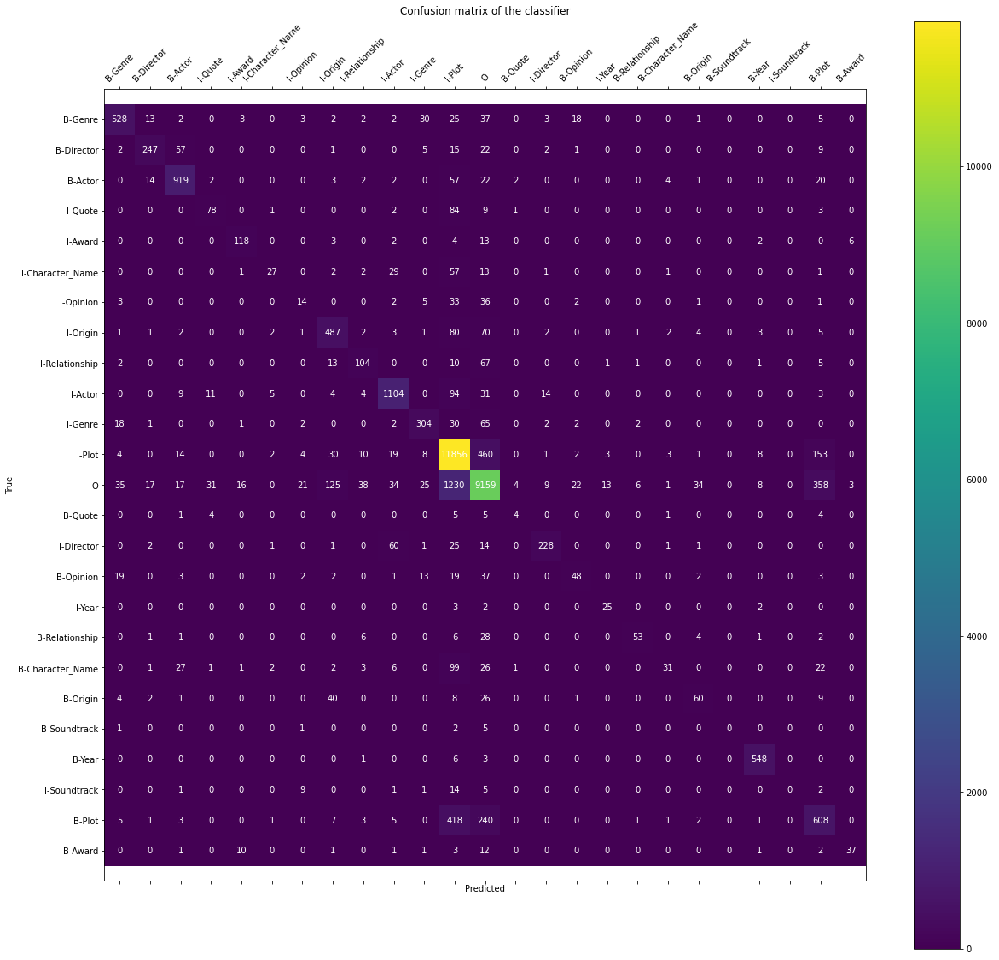

In [11]:
confusion_matrix_heatmap(y_test, preds)

# 2. Error analysis 1: False positives (5 marks)

Performing error analyses is a key part of improving your NLP applications. For the 5 classes which have the lowest precision, according to the results table from your 20% development data, print out all the sentences where there is a false positive for that class (i.e. the label is predicted in the predicted label for a given word by the tagger, but this is not present in the corresponding ground truth label for that word). HINT: This may most easily be achieved by editing the code above beginning `print("testing tagger...")` and ending `print("done")`. Have a look at these errors closely, and think about which features could be added to reduce the number of these errors.


In [12]:
cm = confusion_matrix (y_test, preds)

FP = cm.sum(axis=0) - np.diag(cm)  
FN = cm.sum(axis=1) - np.diag(cm)

labels = list(set(y_test))

metrics = pd.DataFrame ({'Class': labels, 'False Positive': FP, 'False Negatives': FN})
metrics.head(25)

,Class,False Positive,False Negatives
0,B-Genre,139,129
1,B-Director,9,32
2,B-Actor,14,191
3,I-Quote,53,114
4,I-Award,94,146
5,I-Character_Name,48,101
6,I-Opinion,51,91
7,I-Origin,607,688
8,I-Relationship,8,20
9,I-Actor,11,49


In [13]:
print("Understanding False Positives")

report = classification_report(y_test, preds, output_dict=True)
report = pd.DataFrame (report).T

lowest_precision = report['precision'].sort_values()[0:5]

for sent in test_data:
    sent_preds = [x[1] for x in ct.tag([s[0] for s in sent])]
    sent_true = [s[1] for s in sent]
   
    for i in range (len(sent_preds)):
        if sent_preds[i] in lowest_precision:
            if sent_preds[i] != sent_true[i]:
                print('**** FALSE POSITIVE for {0} (ground truth = {1}):****\n'.format(sent_preds[i], sent_true[i]))

print("done")

Understanding False Positives


C:\Users\Usman\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


**** FALSE POSITIVE for B-Opinion (ground truth = B-Director):****

**** FALSE POSITIVE for B-Opinion (ground truth = O):****

**** FALSE POSITIVE for B-Opinion (ground truth = O):****

**** FALSE POSITIVE for B-Opinion (ground truth = B-Origin):****

**** FALSE POSITIVE for I-Opinion (ground truth = I-Origin):****

**** FALSE POSITIVE for B-Opinion (ground truth = B-Genre):****

**** FALSE POSITIVE for B-Opinion (ground truth = O):****

**** FALSE POSITIVE for B-Opinion (ground truth = B-Genre):****

**** FALSE POSITIVE for B-Opinion (ground truth = B-Genre):****

**** FALSE POSITIVE for B-Opinion (ground truth = I-Opinion):****

**** FALSE POSITIVE for B-Opinion (ground truth = O):****

**** FALSE POSITIVE for B-Opinion (ground truth = B-Genre):****

**** FALSE POSITIVE for B-Opinion (ground truth = O):****

**** FALSE POSITIVE for B-Opinion (ground truth = B-Genre):****

**** FALSE POSITIVE for I-Opinion (ground truth = O):****

**** FALSE POSITIVE for B-Opinion (ground truth = B-Ge

# 3. Error analysis 2: False negatives (5 marks)

For the 5 classes which have the lowest recall, according to the results table from your 20% development data,, print out all the sentences where there is a false negative for that label (i.e. the label is present in the ground truth label for a given word, but that label is not predicted for that word by the tagger). HINT: This may most easily be achieved by editing the code above beginning `print("testing tagger...")` and ending `print("done")`. Have a look at these errors closely, and think about which features could be added to reduce the number of these errors.


In [14]:
print("Understanding False Negatives")

report = classification_report(y_test, preds, output_dict=True)
report = pd.DataFrame (report).T

lowest_recall = report['recall'].sort_values()[0:5]

for sent in test_data:
    sent_preds = [x[1] for x in ct.tag([s[0] for s in sent])]
    sent_true = [s[1] for s in sent]
   
    for i in range (len(sent_preds)):
        if sent_true[i] in lowest_recall:
            if sent_preds[i] != sent_true[i]:
                print('**** FALSE NEGATIVE for {0} (ground truth = {1}):****\n'.format(sent_preds[i], sent_true[i]))

print("done")

Understanding False Negatives
**** FALSE NEGATIVE for B-Plot (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for I-Plot (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for I-Character_Name (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for I-Plot (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for I-Plot (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for I-Plot (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for I-Plot (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for I-Plot (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for I-Plot (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for O (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for O (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for O (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for O (ground truth = B-Soundtrack):****

**** FALSE NEGATIVE for B-Plot (ground truth = B-Character_Na


**** FALSE NEGATIVE for I-Plot (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for I-Plot (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for I-Plot (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for I-Plot (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for I-Plot (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for B-Actor (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for I-Plot (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for I-Plot (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for I-Plot (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for I-Plot (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for I-Plot (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for I-Plot (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for O (ground truth = B-Character_Name):****

**** FALSE NEGATIVE for O (ground truth = B-Character_Name):****

**** FALSE NEG

# 4. Incorporating POS tags as features (15 marks)
Use the CRF part-of-speech (POS) tagger as shown below to add POS tags to the words in the training data. Do this by altering the `preProcess` function above. Note the CRF tagger only takes strings as input so you will have to concatenate the word and POS tag together (with a special symbol, e.g. @), and you will also have to then split on this special symbol in the feature extraction function `get_features` to get the word and POS tag - modify that function so it uses the POS tag in addition to the word (currently using the word only is achieved by `feature_list.append("WORD_" + token)`. Re-run the training and testing code on your 80%/20% training/dev split from question 1 and record the results from the classification report as text in this file for comparison of the accuracy metrics against not using POS tags- try to see any improvemements across the classes.

In [15]:
# Function definitions

# Preprocessing 
def preProcess(example):

    posttagger = CRFTagger()
    posttagger.set_model_file("crf_pos.tagger")
        
    words = []
    for i in range(len(example)):
        words.append(example[i][0])
    
    for i in range(len(example)):
        example[i] = list(example[i])
        example[i][0] = str(example[i][0])+"@"+str(posttagger.tag(words)[i][1])
        example[i] = tuple(example[i])

    preprocessed_example = example
    return preprocessed_example



# Get features
def get_features(tokens, idx):
    """
    Extract basic features about this word including
         - Current Word
         - Is Capitalized ?
         - Has Punctuation ?
         - Has Number ?
         - Suffixes up to length 3
    Note that : we might include feature over previous word, next word ect.

    :return : a list which contains the features
    :rtype : list(str)

    """
    token = tokens[idx]
    feature_list = []

    token_tag = token.split('@')
    tag = token_tag[1]
    token = token_tag[0]
    
    
    if not token:
        return feature_list
    
    # Capitalization
    if token[0].isupper():
        feature_list.append("CAPITALIZATION")

    # Number
    if re.search(_pattern, token) is not None:
        feature_list.append("HAS_NUM")

    # Punctuation
    punc_cat = set(["Pc", "Pd", "Ps", "Pe", "Pi", "Pf", "Po"])
    if all(unicodedata.category(x) in punc_cat for x in token):
        feature_list.append("PUNCTUATION")

    # Suffix up to length 3
    if len(token) > 1:
        feature_list.append("SUF_" + token[-1:])
    if len(token) > 2:
        feature_list.append("SUF_" + token[-2:])
    if len(token) > 3:
        feature_list.append("SUF_" + token[-3:])
        
    feature_list.append("WORD_" + token)
    
    feature_list.append("POSTAG_" + tag)
    
    
    #print(feature_list)
    return feature_list


In [16]:
preprocessed_data = [preProcess(example) for example in raw_training_data]

print (preprocessed_data[1])

[('liza@NNP', 'B-Actor'), ('minnelli@NNP', 'I-Actor'), ('and@CC', 'O'), ('joel@NNP', 'B-Actor'), ('gray@NNP', 'I-Actor'), ('won@NNP', 'B-Award'), ('oscars@NNS', 'I-Award'), ('for@IN', 'O'), ('their@PRP$', 'O'), ('roles@NNS', 'O'), ('in@IN', 'O'), ('this@DT', 'O'), ('1972@NN', 'B-Year'), ('movie@NN', 'O'), ('that@WDT', 'B-Plot'), ('follows@VBZ', 'I-Plot'), ('nightclub@NN', 'I-Plot'), ('entertainers@NNS', 'I-Plot'), ('in@IN', 'I-Plot'), ('berlin@NNP', 'I-Plot'), ('as@IN', 'I-Plot'), ('the@DT', 'I-Plot'), ('nazis@NNS', 'I-Plot'), ('come@VBP', 'I-Plot'), ('to@TO', 'I-Plot'), ('power@VB', 'I-Plot')]


In [17]:
random.seed(seed)


training_data = []
test_data = []

training_index = random.sample(range(0,len(preprocessed_data)-1), k = round(len(preprocessed_data)*0.8))
len (training_index)

for i in training_index:
    training_data.append(preprocessed_data[i])

    
test_index = [x for x in range(0,len(preprocessed_data)) if x not in training_index]

for i in test_index:
    test_data.append(preprocessed_data[i])

In [18]:
_pattern = re.compile(r"\d")  # to recognize numbers/digits

In [19]:
# Train the CRF BIO-tag tagger
TAGGER_PATH = "crf_nlu_postags.tagger"  # path to the tagger- it will save/access the model from here
ct = CRFTagger(feature_func=get_features)  # initialize tagger with get_features function

print("training tagger...")
ct.train(training_data, TAGGER_PATH)
print("done")

training tagger...
done


In [20]:
# load tagger from saved file
ct = CRFTagger(feature_func=get_features)  # initialize tagger
ct.set_model_file(TAGGER_PATH)  # load model from file

# Looking at the 20% test data:
print(len(test_data), "instances")
print(sum([len(sent) for sent in test_data]), "words")

1563 instances
31982 words


In [21]:
print("testing tagger...")

preds = []
y_test = []

for sent in test_data:
    sent_preds = [x[1] for x in ct.tag([s[0] for s in sent])]
    sent_true = [s[1] for s in sent]
    preds.extend(sent_preds)
    y_test.extend(sent_true)

print("done")

testing tagger...
done


In [22]:
# Output the classification report (which you should save each time for comparing your models)

model_report_q4 = classification_report(y_test, preds)
print(model_report_q4)


print(precision_recall_fscore_support(y_test, preds, average='macro'))  # print out accurate macro score

                  precision    recall  f1-score   support

         B-Actor       0.86      0.89      0.87      1048
         B-Award       0.78      0.51      0.61        69
B-Character_Name       0.71      0.15      0.25       222
      B-Director       0.83      0.71      0.77       361
         B-Genre       0.86      0.78      0.82       674
       B-Opinion       0.51      0.36      0.42       149
        B-Origin       0.54      0.39      0.45       151
          B-Plot       0.50      0.47      0.48      1296
         B-Quote       0.60      0.25      0.35        24
  B-Relationship       0.81      0.51      0.63       102
    B-Soundtrack       0.00      0.00      0.00         9
          B-Year       0.95      0.98      0.97       558
         I-Actor       0.85      0.89      0.87      1279
         I-Award       0.78      0.76      0.77       148
I-Character_Name       0.64      0.22      0.32       134
      I-Director       0.87      0.72      0.79       334
         I-Ge

C:\Users\Usman\anaconda3\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass labels=['B-Genre', 'B-Director', 'B-Actor', 'I-Quote', 'I-Award', 'I-Character_Name', 'I-Opinion', 'I-Origin', 'I-Relationship', 'I-Actor', 'I-Genre', 'I-Plot', 'O', 'B-Quote', 'I-Director', 'B-Opinion', 'I-Year', 'B-Relationship', 'B-Character_Name', 'B-Origin', 'B-Soundtrack', 'B-Year', 'I-Soundtrack', 'B-Plot', 'B-Award'] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


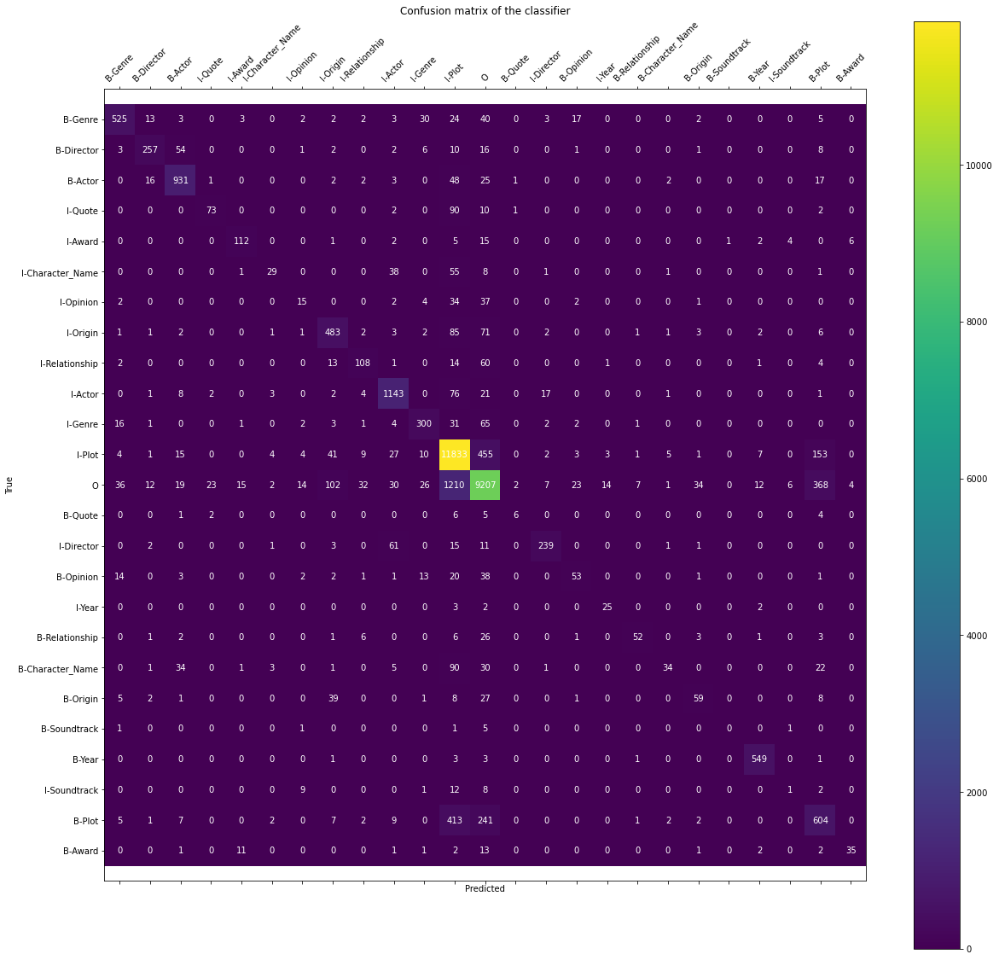

In [23]:
confusion_matrix_heatmap(y_test, preds)

# 5. Feature experimentation and other optimization for optimal macro average (30 marks).
Experiment with different features by further adjusting the `get_features` function, and modifying it to get the best results in terms of `macro average f-score` (i.e. average f-score across all classes) on your 20% development data. Iteratively try different functions, briefly describe the method and record the results in the classification report format and make sure you describe this in your report.

Feature tips: You could try more suffixes/prefixes of the current word than those currently extracted, you could use windows of the next and previous tokens (of different sizes, e.g. the previous/next N words/tags). As you try different feature functions, use the techniques you used in Q2 and Q3 to see the kind of errors you are getting for lower performing classes, in addition to the confusion matrix over classes.

Model tips: After your feature engineering, for even better performance you could try optimizing the hyperparameters by adjusting the `training_opt` dictionary values, experimenting with changing the minimum document frequency, c1 and c2 regularization parameters for https://www.nltk.org/api/nltk.tag.crf.html#nltk.tag.crf.CRFTagger.__init__ e.g. changing the initialization to make the minimum feature frequency 2 (rather than the default 1) would be:

`ct = CRFTagger(feature_func=get_features, training_opt={"feature.minfreq":2})`

Leave the `get_features` functions in the state you used to get the highest `macro average f-score` on your 20% development set, then re-train the model on ALL the training data and print the classification report for the original test data (i.e. from the test file `trivia10k13train.bio.txt`) as your final piece of code.

### Idea 1

1. Increasing the Suffix length to 5
2. Adding 3 Prefixes

In [24]:
# Feature engineering

# Get features
def get_features(tokens, idx):
    """
    Extract basic features about this word including
         - Current Word
         - Is Capitalized ?
         - Has Punctuation ?
         - Has Number ?
         - Suffixes up to length 3
    Note that : we might include feature over previous word, next word ect.

    :return : a list which contains the features
    :rtype : list(str)

    """
    token = tokens[idx]
    feature_list = []

    token_tag = token.split('@')
    tag = token_tag[1]
    token = token_tag[0]
    
    
    if not token:
        return feature_list
    
    # Capitalization
    if token[0].isupper():
        feature_list.append("CAPITALIZATION")

    # Number
    if re.search(_pattern, token) is not None:
        feature_list.append("HAS_NUM")

    # Punctuation
    punc_cat = set(["Pc", "Pd", "Ps", "Pe", "Pi", "Pf", "Po"])
    if all(unicodedata.category(x) in punc_cat for x in token):
        feature_list.append("PUNCTUATION")

    # Suffix up to length 5
    if len(token) > 1:
        feature_list.append("SUF_" + token[-1:])
    if len(token) > 2:
        feature_list.append("SUF_" + token[-2:])
    if len(token) > 3:
        feature_list.append("SUF_" + token[-3:])
    if len(token) > 4:
        feature_list.append("SUF_" + token[-4:])
    if len(token) > 5:
        feature_list.append("SUF_" + token[-5:])
        
    # Prefix up to length 3
    if len(token) > 1:
        feature_list.append("SUF_" + token[0:])
    if len(token) > 2:
        feature_list.append("SUF_" + token[1:])
    if len(token) > 3:
        feature_list.append("SUF_" + token[2:])
        
        
    feature_list.append("WORD_" + token)
    
    feature_list.append("POSTAG_" + tag)
    
    
    #print(feature_list)
    return feature_list


In [25]:
# Training the tagger and testing it on the 20% test dataset


# Train the CRF BIO-tag tagger
TAGGER_PATH = "crf_nlu_postags.tagger"  # path to the tagger- it will save/access the model from here
ct = CRFTagger(feature_func=get_features, training_opt={"feature.minfreq":2})  # initialize tagger with get_features function

print("Training tagger...")
ct.train(training_data, TAGGER_PATH)
print("done")


# load tagger from saved file
ct = CRFTagger(feature_func=get_features, training_opt={"feature.minfreq":2})  # initialize tagger
ct.set_model_file(TAGGER_PATH)  # load model from file

# Looking at the 20% test data:
print(len(test_data), "instances")
print(sum([len(sent) for sent in test_data]), "words")


print("Testing tagger...")

preds = []
y_test = []

for sent in test_data:
    sent_preds = [x[1] for x in ct.tag([s[0] for s in sent])]
    sent_true = [s[1] for s in sent]
    preds.extend(sent_preds)
    y_test.extend(sent_true)

print("done\n")


# Output the classification report (which you should save each time for comparing your models)

model_report_q5_1 = classification_report(y_test, preds)
print(model_report_q5_1) 


print(precision_recall_fscore_support(y_test, preds, average='macro'))  # print out accurate macro score


cm = confusion_matrix (y_test, preds)

FP = cm.sum(axis=0) - np.diag(cm)  
FN = cm.sum(axis=1) - np.diag(cm)

labels = list(set(y_test))

metrics = pd.DataFrame ({'Class': labels, 'False Positive': FP, 'False Negatives': FN})
metrics.head(25)

Training tagger...
done
1563 instances
31982 words
Testing tagger...
done

                  precision    recall  f1-score   support

         B-Actor       0.89      0.91      0.90      1048
         B-Award       0.76      0.54      0.63        69
B-Character_Name       0.70      0.26      0.38       222
      B-Director       0.83      0.75      0.79       361
         B-Genre       0.85      0.82      0.83       674
       B-Opinion       0.50      0.42      0.46       149
        B-Origin       0.56      0.44      0.49       151
          B-Plot       0.49      0.46      0.47      1296
         B-Quote       0.64      0.29      0.40        24
  B-Relationship       0.79      0.53      0.64       102
    B-Soundtrack       0.00      0.00      0.00         9
          B-Year       0.95      0.99      0.97       558
         I-Actor       0.90      0.91      0.90      1279
         I-Award       0.79      0.78      0.79       148
I-Character_Name       0.59      0.31      0.41       

,Class,False Positive,False Negatives
0,B-Genre,112,95
1,B-Director,12,32
2,B-Actor,25,164
3,I-Quote,54,92
4,I-Award,99,124
5,I-Character_Name,64,86
6,I-Opinion,53,84
7,I-Origin,619,704
8,I-Relationship,4,17
9,I-Actor,14,48


C:\Users\Usman\anaconda3\lib\site-packages\sklearn\utils\validation.py:67: FutureWarning: Pass labels=['B-Genre', 'B-Director', 'B-Actor', 'I-Quote', 'I-Award', 'I-Character_Name', 'I-Opinion', 'I-Origin', 'I-Relationship', 'I-Actor', 'I-Genre', 'I-Plot', 'O', 'B-Quote', 'I-Director', 'B-Opinion', 'I-Year', 'B-Relationship', 'B-Character_Name', 'B-Origin', 'B-Soundtrack', 'B-Year', 'I-Soundtrack', 'B-Plot', 'B-Award'] as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


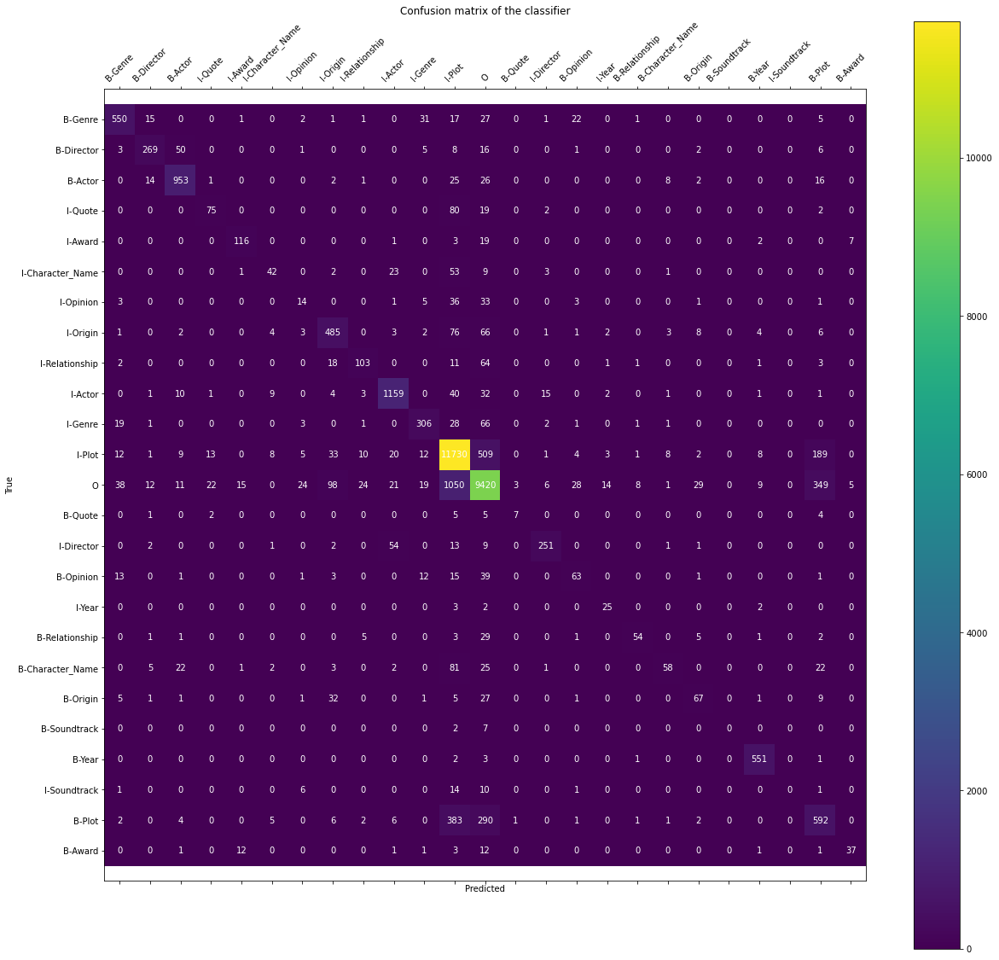

In [26]:
confusion_matrix_heatmap(y_test, preds)

Increasing the length of suffixes from 3 to 5 and adding 3 prefix letters seemed to increase the macro average F1 score more than adding the POS Tags did. Trying to see if increasing the prefix letters to 5 brings about any improvement.

In [27]:
# Feature engineering

# Get features
def get_features(tokens, idx):
    """
    Extract basic features about this word including
         - Current Word
         - Is Capitalized ?
         - Has Punctuation ?
         - Has Number ?
         - Suffixes up to length 3
    Note that : we might include feature over previous word, next word ect.

    :return : a list which contains the features
    :rtype : list(str)

    """
    token = tokens[idx]
    feature_list = []

    token_tag = token.split('@')
    tag = token_tag[1]
    token = token_tag[0]
    
    
    if not token:
        return feature_list
    
    # Capitalization
    if token[0].isupper():
        feature_list.append("CAPITALIZATION")

    # Number
    if re.search(_pattern, token) is not None:
        feature_list.append("HAS_NUM")

    # Punctuation
    punc_cat = set(["Pc", "Pd", "Ps", "Pe", "Pi", "Pf", "Po"])
    if all(unicodedata.category(x) in punc_cat for x in token):
        feature_list.append("PUNCTUATION")

    # Suffix up to length 5
    if len(token) > 1:
        feature_list.append("SUF_" + token[-1:])
    if len(token) > 2:
        feature_list.append("SUF_" + token[-2:])
    if len(token) > 3:
        feature_list.append("SUF_" + token[-3:])
    if len(token) > 4:
        feature_list.append("SUF_" + token[-4:])
    if len(token) > 5:
        feature_list.append("SUF_" + token[-5:])
        
    # Prefix up to length 3
    if len(token) > 1:
        feature_list.append("SUF_" + token[0:])
    if len(token) > 2:
        feature_list.append("SUF_" + token[1:])
    if len(token) > 3:
        feature_list.append("SUF_" + token[2:])
    if len(token) > 4:
        feature_list.append("SUF_" + token[3:])
    if len(token) > 5:
        feature_list.append("SUF_" + token[4:])
        
        
    feature_list.append("WORD_" + token)
    
    feature_list.append("POSTAG_" + tag)
    
    
    #print(feature_list)
    return feature_list


In [28]:
# Training the tagger and testing it on the 20% test dataset


# Train the CRF BIO-tag tagger
TAGGER_PATH = "crf_nlu_postags.tagger"  # path to the tagger- it will save/access the model from here
ct = CRFTagger(feature_func=get_features, training_opt={"feature.minfreq":2})  # initialize tagger with get_features function

print("Training tagger...")
ct.train(training_data, TAGGER_PATH)
print("done")


# load tagger from saved file
ct = CRFTagger(feature_func=get_features, training_opt={"feature.minfreq":2})  # initialize tagger
ct.set_model_file(TAGGER_PATH)  # load model from file

# Looking at the 20% test data:
print(len(test_data), "instances")
print(sum([len(sent) for sent in test_data]), "words")


print("Testing tagger...")

preds = []
y_test = []

for sent in test_data:
    sent_preds = [x[1] for x in ct.tag([s[0] for s in sent])]
    sent_true = [s[1] for s in sent]
    preds.extend(sent_preds)
    y_test.extend(sent_true)

print("done\n")


# Output the classification report (which you should save each time for comparing your models)

model_report_q5_2 = classification_report(y_test, preds)
print(model_report_q5_2) 


print(precision_recall_fscore_support(y_test, preds, average='macro'))  # print out accurate macro score


cm = confusion_matrix (y_test, preds)

FP = cm.sum(axis=0) - np.diag(cm)  
FN = cm.sum(axis=1) - np.diag(cm)

labels = list(set(y_test))

metrics = pd.DataFrame ({'Class': labels, 'False Positive': FP, 'False Negatives': FN})
metrics.head(25)

Training tagger...
done
1563 instances
31982 words
Testing tagger...
done



C:\Users\Usman\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                  precision    recall  f1-score   support

         B-Actor       0.90      0.91      0.91      1048
         B-Award       0.76      0.55      0.64        69
B-Character_Name       0.69      0.27      0.39       222
      B-Director       0.83      0.75      0.79       361
         B-Genre       0.85      0.81      0.83       674
       B-Opinion       0.48      0.42      0.44       149
        B-Origin       0.56      0.45      0.50       151
          B-Plot       0.48      0.45      0.47      1296
         B-Quote       0.67      0.33      0.44        24
  B-Relationship       0.80      0.55      0.65       102
    B-Soundtrack       0.00      0.00      0.00         9
          B-Year       0.95      0.99      0.97       558
         I-Actor       0.90      0.91      0.91      1279
         I-Award       0.81      0.79      0.80       148
I-Character_Name       0.60      0.31      0.41       134
      I-Director       0.89      0.74      0.81       334
         I-Ge

,Class,False Positive,False Negatives
0,B-Genre,110,90
1,B-Director,12,31
2,B-Actor,28,161
3,I-Quote,56,90
4,I-Award,100,127
5,I-Character_Name,68,87
6,I-Opinion,53,83
7,I-Origin,626,708
8,I-Relationship,4,16
9,I-Actor,14,46


In [29]:
print_most_predictive_state_features(ct._tagger.info().state_features.items())

4.971350 B-Year   HAS_NUM
3.773760 I-Year   WORD_s
1.877962 B-Plot   WORD_a
1.760453 I-Genre  WORD_d
1.740046 B-Actor  WORD_cher
1.651961 I-Year   HAS_NUM
1.642206 I-Character_Name POSTAG_SYM
1.547677 B-Genre  WORD_3
1.499283 I-Year   SUF_0
1.496053 B-Quote  WORD_i
1.456249 B-Plot   POSTAG_VBZ
1.403058 B-Award  SUF_scar
1.366888 B-Year   SUF_2
1.327872 B-Quote  POSTAG_PRP
1.314834 B-Character_Name SUF_eus
1.296740 B-Year   SUF_id
1.295480 I-Quote  POSTAG_PRP
1.290420 B-Genre  SUF_mated
1.280554 B-Character_Name WORD_hal
1.247176 B-Award  SUF_car
1.237334 B-Actor  SUF_a
1.223417 B-Year   SUF_1
1.204363 I-Genre  SUF_ction
1.169865 B-Year   SUF_8
1.161622 I-Actor  SUF_sling
1.155417 B-Director SUF_xar
1.155417 B-Director SUF_ixar
1.153911 B-Plot   WORD_an
1.146855 B-Year   SUF_010
1.142144 B-Year   SUF_012
1.128562 B-Soundtrack WORD_i
1.111997 I-Character_Name SUF_ulk
1.107939 B-Opinion SUF_t
1.092884 I-Genre  SUF_hite
1.089403 B-Actor  SUF_eth
1.086714 I-Genre  WORD_fi
1.083374 B-Relatio

0.581121 B-Genre  SUF_nder
0.581046 B-Award  WORD_7
0.580918 I-Opinion SUF_rker
0.580811 I-Actor  SUF_gosling
0.580811 I-Actor  SUF_osling
0.580811 I-Actor  WORD_gosling
0.580509 B-Character_Name SUF_obbs
0.580277 I-Plot   SUF_ives
0.579816 B-Actor  SUF_sten
0.579719 B-Character_Name SUF_stro
0.579514 B-Relationship SUF_tems
0.579512 B-Origin SUF_ats
0.579332 I-Actor  SUF_ox
0.579306 I-Character_Name SUF_ufman
0.578919 I-Actor  SUF_is
0.578820 I-Opinion SUF_aby
0.578544 I-Character_Name SUF_lsing
0.578525 I-Actor  SUF_lone
0.578498 I-Director SUF_ann
0.578291 I-Actor  SUF_ns
0.578187 B-Actor  SUF_iro
0.578083 B-Actor  SUF_anning
0.578071 I-Actor  SUF_hue
0.577869 I-Plot   SUF_evil
0.577859 I-Plot   SUF_rors
0.577841 B-Director SUF_oe
0.577725 I-Character_Name SUF_ray
0.577708 B-Director SUF_pixar
0.577708 B-Director WORD_pixar
0.577619 I-Director SUF_ley
0.577443 B-Character_Name SUF_ickey
0.577383 I-Plot   SUF_eline
0.577097 I-Origin WORD_play
0.576733 I-Director SUF_orman
0.576693 B-

0.470686 B-Plot   SUF_earn
0.470677 B-Plot   SUF_ment
0.470671 B-Relationship SUF_reck
0.470578 I-Director SUF_inpah
0.470490 I-Director SUF_pola
0.470490 I-Director SUF_ppola
0.470416 I-Plot   SUF_plane
0.470398 B-Character_Name SUF_atles
0.470255 I-Actor  SUF_bins
0.470205 I-Director SUF_cas
0.470191 I-Opinion SUF_tense
0.470186 B-Plot   SUF_sad
0.470186 B-Plot   WORD_sad
0.470177 B-Quote  SUF_if
0.470122 B-Director SUF_cheal
0.470061 I-Character_Name SUF_nor
0.469962 I-Opinion SUF_um
0.469870 B-Genre  SUF_mob
0.469870 B-Genre  WORD_mob
0.469788 B-Actor  SUF_nique
0.469783 I-Genre  SUF_animated
0.469783 I-Genre  SUF_nimated
0.469783 I-Genre  SUF_imated
0.469783 I-Genre  WORD_animated
0.469749 B-Plot   SUF_tally
0.469699 I-Genre  SUF_yptic
0.469699 I-Genre  SUF_apocalyptic
0.469699 I-Genre  SUF_pocalyptic
0.469699 I-Genre  SUF_ocalyptic
0.469699 I-Genre  SUF_calyptic
0.469699 I-Genre  SUF_alyptic
0.469699 I-Genre  WORD_apocalyptic
0.469698 B-Director SUF_heal
0.469662 I-Plot   SUF_kil

0.421026 B-Origin SUF_nard
0.420965 I-Director SUF_dform
0.420929 I-Actor  SUF_owe
0.420925 I-Actor  SUF_gen
0.420915 I-Plot   SUF_dence
0.420827 B-Plot   SUF_sked
0.420798 B-Opinion POSTAG_VBG
0.420710 I-Quote  SUF_ack
0.420668 B-Plot   SUF_vard
0.420668 B-Plot   SUF_rvard
0.420624 I-Quote  SUF_orn
0.420580 I-Actor  SUF_myers
0.420580 I-Actor  WORD_myers
0.420572 I-Plot   SUF_ring
0.420482 B-Director SUF_roman
0.420482 B-Director WORD_roman
0.420432 B-Character_Name SUF_asa
0.420334 B-Actor  SUF_damon
0.420334 B-Actor  WORD_damon
0.420310 I-Director SUF_cfarlane
0.420310 I-Director SUF_farlane
0.420310 I-Director SUF_arlane
0.420309 I-Soundtrack SUF_ut
0.420306 I-Director SUF_form
0.420236 B-Character_Name SUF_nsel
0.420236 B-Character_Name SUF_ansel
0.420229 I-Relationship SUF_ovies
0.420133 I-Actor  SUF_toole
0.420133 I-Actor  WORD_toole
0.420072 I-Actor  SUF_enn
0.420028 I-Director SUF_ckay
0.419859 B-Origin SUF_fter
0.419813 B-Plot   SUF_kward
0.419811 I-Actor  SUF_nreid
0.419718 

0.358724 B-Character_Name SUF_lsa
0.358724 B-Character_Name SUF_ulsa
0.358724 B-Character_Name SUF_hulsa
0.358701 B-Actor  SUF_live
0.358595 I-Director SUF_se
0.358569 I-Origin SUF_ch
0.358508 I-Origin SUF_tein
0.358464 B-Director SUF_walt
0.358464 B-Director WORD_walt
0.358450 I-Actor  SUF_kins
0.358408 I-Director SUF_away
0.358406 B-Opinion SUF_ark
0.358385 B-Plot   SUF_icted
0.358358 B-Director SUF_tain
0.358345 I-Plot   WORD_race
0.358286 B-Actor  SUF_mke
0.358286 B-Actor  SUF_amke
0.358258 B-Plot   SUF_lding
0.358181 B-Director SUF_billy
0.358177 B-Director SUF_mar
0.358172 B-Director SUF_ason
0.358135 I-Plot   SUF_ran
0.358091 B-Plot   SUF_mated
0.358074 B-Plot   POSTAG_EX
0.358029 B-Actor  SUF_chevy
0.358029 B-Actor  WORD_chevy
0.358021 I-Opinion SUF_ncing
0.357964 B-Plot   SUF_ut
0.357940 I-Director SUF_oeven
0.357871 B-Actor  SUF_ea
0.357820 I-Award  SUF_best
0.357820 I-Award  WORD_best
0.357791 B-Plot   SUF_nown
0.357762 I-Actor  SUF_urst
0.357762 I-Actor  SUF_hurst
0.357696 

0.312001 I-Plot   SUF_uppy
0.312000 I-Plot   SUF_magic
0.312000 I-Plot   WORD_magic
0.311973 B-Actor  SUF_von
0.311964 B-Genre  SUF_satire
0.311964 B-Genre  WORD_satire
0.311953 B-Director SUF_wa
0.311867 I-Quote  SUF_gain
0.311798 B-Plot   SUF_aturing
0.311782 B-Quote  SUF_there
0.311782 B-Quote  WORD_there
0.311700 B-Actor  SUF_jonah
0.311700 B-Actor  WORD_jonah
0.311644 I-Year   SUF_years
0.311644 I-Year   WORD_years
0.311643 I-Director SUF_others
0.311615 B-Genre  SUF_se
0.311604 B-Plot   SUF_ich
0.311600 I-Plot   SUF_reams
0.311541 I-Plot   SUF_rter
0.311517 I-Character_Name SUF_gale
0.311517 I-Character_Name WORD_gale
0.311508 I-Genre  SUF_ent
0.311449 B-Plot   SUF_ught
0.311430 I-Director WORD_and
0.311413 B-Plot   SUF_uced
0.311413 B-Plot   SUF_duced
0.311396 B-Character_Name SUF_gar
0.311383 I-Plot   SUF_bor
0.311354 I-Quote  SUF_zzy
0.311330 B-Character_Name SUF_kael
0.311330 B-Character_Name SUF_ikael
0.311298 I-Genre  WORD_movie
0.311286 B-Director SUF_uc
0.311235 B-Directo

0.273457 B-Actor  SUF_zac
0.273457 B-Actor  WORD_zac
0.273442 B-Plot   SUF_rrior
0.273416 I-Opinion SUF_office
0.273416 I-Opinion WORD_office
0.273415 B-Plot   SUF_can
0.273362 I-Plot   SUF_ghly
0.273362 I-Plot   SUF_ighly
0.273342 I-Plot   SUF_ticed
0.273330 B-Actor  SUF_linda
0.273330 B-Actor  WORD_linda
0.273327 B-Actor  SUF_ndan
0.273327 B-Actor  SUF_endan
0.273290 B-Director SUF_ruce
0.273277 B-Relationship SUF_james
0.273277 B-Relationship WORD_james
0.273235 I-Plot   SUF_boyfriend
0.273235 I-Plot   SUF_oyfriend
0.273235 I-Plot   WORD_boyfriend
0.273234 I-Director SUF_omas
0.273234 I-Director SUF_homas
0.273230 B-Actor  SUF_ni
0.273229 I-Director SUF_hcok
0.273229 I-Director SUF_chcok
0.273186 I-Plot   SUF_impy
0.273166 I-Plot   SUF_nkeys
0.273164 I-Quote  SUF_nt
0.273160 I-Director SUF_rro
0.273114 B-Actor  SUF_ren
0.273110 I-Actor  SUF_urke
0.273110 I-Actor  SUF_ourke
0.273072 B-Director SUF_uce
0.273068 B-Actor  SUF_michelle
0.273068 B-Actor  SUF_ichelle
0.273068 B-Actor  SUF_

0.242109 B-Opinion WORD_movies
0.242018 B-Plot   SUF_tony
0.242018 B-Plot   WORD_tony
0.242015 I-Plot   SUF_derer
0.242005 I-Plot   WORD_spy
0.241977 I-Plot   WORD_ca
0.241975 I-Plot   SUF_gile
0.241975 I-Plot   SUF_agile
0.241974 I-Plot   SUF_amma
0.241910 B-Plot   SUF_bi
0.241852 B-Plot   SUF_cus
0.241839 B-Plot   SUF_misadventures
0.241839 B-Plot   SUF_isadventures
0.241839 B-Plot   SUF_sadventures
0.241839 B-Plot   WORD_misadventures
0.241784 I-Character_Name SUF_ziano
0.241782 I-Plot   SUF_poland
0.241782 I-Plot   WORD_poland
0.241777 I-Character_Name SUF_oya
0.241777 I-Character_Name SUF_toya
0.241777 I-Character_Name SUF_ntoya
0.241615 I-Quote  SUF_rder
0.241549 I-Plot   SUF_ypse
0.241549 I-Plot   SUF_lypse
0.241549 I-Plot   SUF_apocalypse
0.241549 I-Plot   SUF_pocalypse
0.241549 I-Plot   SUF_ocalypse
0.241549 I-Plot   SUF_calypse
0.241549 I-Plot   SUF_alypse
0.241549 I-Plot   WORD_apocalypse
0.241462 I-Actor  WORD_little
0.241460 I-Relationship SUF_key
0.241444 I-Genre  SUF_ren

0.211843 B-Genre  SUF_torical
0.211843 B-Genre  SUF_orical
0.211843 B-Genre  WORD_historical
0.211813 B-Year   SUF_1978
0.211813 B-Year   WORD_1978
0.211774 B-Actor  SUF_il
0.211746 I-Actor  SUF_giant
0.211746 I-Actor  WORD_giant
0.211743 I-Plot   SUF_ber
0.211734 I-Actor  SUF_eth
0.211729 I-Plot   SUF_rescue
0.211729 I-Plot   WORD_rescue
0.211717 I-Director SUF_rrier
0.211697 B-Origin SUF_british
0.211697 B-Origin SUF_ritish
0.211697 B-Origin WORD_british
0.211695 I-Director SUF_raimi
0.211695 I-Director WORD_raimi
0.211686 B-Actor  SUF_onna
0.211679 B-Plot   SUF_wins
0.211610 I-Origin SUF_rol
0.211606 B-Year   SUF_927
0.211601 B-Actor  SUF_randon
0.211594 I-Plot   SUF_aper
0.211544 I-Plot   SUF_racehorse
0.211544 I-Plot   SUF_acehorse
0.211544 I-Plot   SUF_cehorse
0.211544 I-Plot   SUF_ehorse
0.211544 I-Plot   WORD_racehorse
0.211522 B-Relationship SUF_se
0.211520 B-Plot   SUF_returns
0.211520 B-Plot   SUF_eturns
0.211520 B-Plot   WORD_returns
0.211501 B-Genre  SUF_b
0.211493 I-Actor

0.180116 B-Relationship SUF_ire
0.180114 B-Genre  SUF_py
0.180111 I-Plot   SUF_running
0.180111 I-Plot   WORD_running
0.180085 B-Plot   SUF_ibly
0.180062 I-Plot   SUF_ed
0.180059 I-Plot   SUF_cken
0.180059 B-Year   SUF_1971
0.180059 B-Year   WORD_1971
0.180047 I-Soundtrack SUF_matata
0.180047 I-Soundtrack WORD_matata
0.179989 I-Opinion SUF_lls
0.179970 B-Genre  SUF_can
0.179955 I-Quote  SUF_punk
0.179955 I-Quote  WORD_punk
0.179952 I-Director SUF_ossen
0.179950 I-Plot   SUF_ake
0.179920 B-Genre  SUF_ery
0.179896 I-Opinion SUF_wer
0.179886 B-Plot   SUF_cuing
0.179863 I-Plot   SUF_aut
0.179799 I-Plot   SUF_crazy
0.179799 I-Plot   WORD_crazy
0.179727 I-Plot   SUF_ius
0.179688 I-Plot   SUF_ears
0.179588 I-Plot   WORD_site
0.179587 I-Relationship SUF_ood
0.179566 B-Plot   SUF_starts
0.179566 B-Plot   WORD_starts
0.179543 I-Plot   SUF_discovery
0.179543 I-Plot   SUF_iscovery
0.179543 I-Plot   SUF_scovery
0.179543 I-Plot   SUF_covery
0.179543 I-Plot   WORD_discovery
0.179521 I-Actor  SUF_arre

0.157888 I-Plot   SUF_lousy
0.157884 I-Actor  SUF_mez
0.157884 I-Actor  SUF_omez
0.157837 B-Actor  SUF_u
0.157791 I-Plot   SUF_oward
0.157751 I-Director SUF_gold
0.157731 I-Plot   SUF_vigilante
0.157731 I-Plot   SUF_igilante
0.157731 I-Plot   SUF_gilante
0.157731 I-Plot   SUF_ilante
0.157731 I-Plot   WORD_vigilante
0.157723 I-Plot   SUF_royal
0.157723 I-Plot   WORD_royal
0.157702 I-Actor  SUF_reeve
0.157702 I-Actor  WORD_reeve
0.157698 I-Plot   SUF_rim
0.157686 I-Plot   SUF_colony
0.157686 I-Plot   WORD_colony
0.157663 I-Origin SUF_mm
0.157660 I-Plot   SUF_ldish
0.157647 I-Plot   SUF_thirsty
0.157647 I-Plot   SUF_hirsty
0.157647 I-Plot   WORD_thirsty
0.157632 I-Plot   SUF_nuptials
0.157632 I-Plot   SUF_uptials
0.157632 I-Plot   SUF_ptials
0.157632 I-Plot   WORD_nuptials
0.157464 I-Plot   SUF_divorce
0.157464 I-Plot   SUF_ivorce
0.157464 I-Plot   WORD_divorce
0.157439 B-Year   SUF_1942
0.157439 B-Year   WORD_1942
0.157419 B-Relationship SUF_deo
0.157419 B-Relationship SUF_ideo
0.157413 

0.127427 B-Relationship SUF_ure
0.127423 B-Director SUF_idney
0.127421 I-Plot   SUF_fects
0.127416 I-Origin WORD_of
0.127414 I-Director SUF_rik
0.127414 I-Director SUF_brik
0.127414 I-Director SUF_ubrik
0.127408 B-Plot   SUF_ically
0.127379 B-Plot   SUF_serial
0.127379 B-Plot   WORD_serial
0.127379 B-Plot   SUF_val
0.127351 I-Actor  SUF_gleason
0.127351 I-Actor  SUF_leason
0.127351 I-Actor  WORD_gleason
0.127260 I-Plot   SUF_clause
0.127260 I-Plot   WORD_clause
0.127217 I-Origin SUF_hanie
0.127210 I-Actor  SUF_ffley
0.127191 I-Origin SUF_bott
0.127191 I-Origin SUF_bbott
0.127180 I-Origin SUF_bury
0.127159 B-Actor  WORD_rita
0.127147 I-Plot   SUF_nosed
0.127137 I-Plot   SUF_angers
0.127128 B-Plot   SUF_tial
0.127126 B-Actor  SUF_katie
0.127126 B-Actor  WORD_katie
0.127124 I-Plot   SUF_money
0.127124 I-Plot   WORD_money
0.127116 I-Plot   SUF_super
0.127116 I-Plot   WORD_super
0.127114 B-Actor  SUF_charlie
0.127114 B-Actor  SUF_harlie
0.127114 B-Actor  WORD_charlie
0.127090 I-Plot   SUF_m

0.109821 I-Plot   WORD_ten
0.109812 B-Actor  SUF_tony
0.109812 B-Actor  WORD_tony
0.109809 I-Actor  SUF_fiennes
0.109809 I-Actor  SUF_iennes
0.109809 I-Actor  WORD_fiennes
0.109805 I-Origin WORD_amy
0.109786 I-Relationship SUF_running
0.109786 I-Relationship WORD_running
0.109782 B-Origin SUF_his
0.109755 I-Genre  SUF_nse
0.109753 B-Actor  SUF_pe
0.109703 I-Plot   SUF_drome
0.109680 I-Quote  SUF_ve
0.109668 I-Relationship SUF_ve
0.109663 I-Relationship SUF_middle
0.109663 I-Relationship WORD_middle
0.109652 I-Origin SUF_anthony
0.109652 I-Origin SUF_nthony
0.109652 I-Origin WORD_anthony
0.109624 I-Actor  SUF_pez
0.109624 I-Actor  SUF_opez
0.109614 I-Plot   WORD_fish
0.109582 I-Origin SUF_rvel
0.109582 I-Origin SUF_arvel
0.109570 B-Plot   SUF_lows
0.109544 B-Relationship WORD_popular
0.109496 I-Character_Name SUF_ine
0.109496 B-Relationship SUF_popular
0.109496 B-Relationship SUF_opular
0.109481 B-Genre  SUF_ner
0.109471 B-Character_Name SUF_die
0.109467 I-Genre  SUF_py
0.109443 I-Plot 

0.085580 I-Plot   SUF_inter
0.085575 I-Director SUF_ook
0.085561 I-Plot   SUF_cycle
0.085500 I-Plot   SUF_hires
0.085500 I-Plot   WORD_hires
0.085468 I-Plot   SUF_ergo
0.085468 I-Plot   SUF_dergo
0.085452 I-Plot   SUF_efly
0.085452 I-Plot   SUF_refly
0.085450 I-Plot   SUF_tern
0.085412 B-Plot   SUF_nging
0.085404 I-Plot   SUF_18
0.085404 I-Plot   WORD_18
0.085372 I-Plot   SUF_mos
0.085371 I-Plot   SUF_rmind
0.085371 I-Plot   SUF_mastermind
0.085371 I-Plot   SUF_astermind
0.085371 I-Plot   SUF_stermind
0.085371 I-Plot   SUF_termind
0.085371 I-Plot   SUF_ermind
0.085371 I-Plot   WORD_mastermind
0.085362 B-Plot   SUF_satirizes
0.085362 B-Plot   SUF_atirizes
0.085362 B-Plot   SUF_tirizes
0.085362 B-Plot   SUF_irizes
0.085362 B-Plot   WORD_satirizes
0.085353 I-Plot   SUF_less
0.085333 I-Soundtrack SUF_tle
0.085302 I-Actor  SUF_cliff
0.085281 I-Plot   SUF_iconic
0.085281 I-Plot   WORD_iconic
0.085273 I-Opinion SUF_ith
0.085250 I-Plot   SUF_vist
0.085232 I-Plot   SUF_organs
0.085232 I-Plot   

0.059343 I-Plot   SUF_major
0.059343 I-Plot   WORD_major
0.059338 I-Plot   WORD_bb
0.059303 I-Plot   SUF_rgely
0.059294 I-Plot   SUF_shoes
0.059294 I-Plot   WORD_shoes
0.059282 I-Plot   WORD_laying
0.059244 B-Plot   SUF_ollow
0.059234 I-Origin SUF_punzel
0.059213 I-Plot   WORD_modern
0.059184 I-Plot   SUF_card
0.059184 I-Plot   WORD_card
0.059178 I-Plot   SUF_tents
0.059130 I-Origin SUF_rmer
0.059129 I-Plot   SUF_hrer
0.059129 I-Plot   SUF_ehrer
0.059121 I-Plot   SUF_ctive
0.059080 I-Plot   SUF_halloween
0.059080 I-Plot   SUF_alloween
0.059080 I-Plot   WORD_halloween
0.059080 I-Plot   SUF_idly
0.059080 I-Plot   SUF_pidly
0.059060 B-Opinion POSTAG_VBN
0.059056 I-Plot   SUF_mordor
0.059056 I-Plot   WORD_mordor
0.059040 B-Opinion SUF_osely
0.059004 I-Actor  SUF_ourney
0.058987 I-Plot   SUF_arrying
0.058987 I-Plot   SUF_rrying
0.058985 B-Plot   SUF_classic
0.058985 B-Plot   SUF_lassic
0.058985 B-Plot   WORD_classic
0.058980 I-Plot   SUF_ghout
0.058980 I-Plot   SUF_throughout
0.058980 I-Plo

0.034299 I-Plot   SUF_ackage
0.034299 I-Plot   WORD_package
0.034288 I-Actor  SUF_rad
0.034246 I-Plot   SUF_mary
0.034222 I-Plot   SUF_circumstances
0.034222 I-Plot   SUF_ircumstances
0.034222 I-Plot   SUF_rcumstances
0.034222 I-Plot   SUF_cumstances
0.034222 I-Plot   SUF_umstances
0.034222 I-Plot   WORD_circumstances
0.034222 I-Plot   SUF_cuss
0.034222 I-Plot   SUF_scuss
0.034197 I-Plot   SUF_aders
0.034125 I-Plot   SUF_peaks
0.034087 I-Plot   SUF_keeping
0.034087 I-Plot   WORD_keeping
0.034085 I-Plot   SUF_sedly
0.034085 I-Plot   SUF_supposedly
0.034085 I-Plot   SUF_upposedly
0.034085 I-Plot   SUF_pposedly
0.034085 I-Plot   SUF_posedly
0.034085 I-Plot   SUF_osedly
0.034085 I-Plot   WORD_supposedly
0.034078 I-Origin SUF_tis
0.034078 I-Origin SUF_rtis
0.034038 B-Origin SUF_ne
0.034030 I-Plot   SUF_rapes
0.033987 I-Plot   SUF_attitude
0.033987 I-Plot   SUF_ttitude
0.033987 I-Plot   SUF_titude
0.033987 I-Plot   WORD_attitude
0.033928 I-Relationship SUF_age
0.033927 I-Plot   SUF_enged
0.0

0.012796 I-Plot   SUF_sest
0.012796 I-Plot   SUF_osest
0.012768 I-Actor  SUF_hew
0.012750 I-Plot   SUF_erers
0.012742 I-Plot   SUF_iranian
0.012742 I-Plot   SUF_ranian
0.012742 I-Plot   WORD_iranian
0.012732 I-Plot   SUF_dike
0.012732 I-Plot   SUF_ndike
0.012715 I-Plot   SUF_eef
0.012712 I-Plot   SUF_loon
0.012703 I-Character_Name SUF_il
0.012697 I-Plot   SUF_hilly
0.012694 I-Origin SUF_old
0.012693 I-Plot   SUF_evel
0.012689 I-Director SUF_bergh
0.012679 I-Plot   SUF_finger
0.012679 I-Plot   WORD_finger
0.012668 I-Plot   SUF_when
0.012668 I-Plot   WORD_when
0.012650 I-Plot   SUF_rink
0.012649 B-Genre  SUF_sical
0.012632 B-Plot   SUF_reet
0.012632 B-Plot   SUF_treet
0.012577 B-Origin SUF_s
0.012575 I-Plot   SUF_uxes
0.012575 I-Plot   SUF_horcruxes
0.012575 I-Plot   SUF_orcruxes
0.012575 I-Plot   SUF_rcruxes
0.012575 I-Plot   SUF_cruxes
0.012575 I-Plot   WORD_horcruxes
0.012565 I-Plot   SUF_guish
0.012565 I-Plot   SUF_lit
0.012565 I-Plot   SUF_plit
0.012544 I-Plot   SUF_unable
0.012544 

-0.020613 I-Plot   SUF_aped
-0.020663 I-Plot   SUF_comes
-0.020690 I-Plot   WORD_show
-0.020727 I-Plot   SUF_umbling
-0.020740 I-Quote  SUF_ion
-0.020742 I-Plot   SUF_civil
-0.020742 I-Plot   WORD_civil
-0.020745 I-Plot   SUF_change
-0.020745 I-Plot   WORD_change
-0.020795 B-Actor  SUF_immy
-0.020851 I-Plot   SUF_cused
-0.020901 I-Plot   SUF_igs
-0.020917 B-Director SUF_s
-0.020924 B-Plot   SUF_len
-0.020977 B-Actor  SUF_kenneth
-0.020977 B-Actor  SUF_enneth
-0.020977 B-Actor  WORD_kenneth
-0.021062 I-Plot   SUF_miles
-0.021062 I-Plot   WORD_miles
-0.021067 B-Plot   SUF_pt
-0.021262 I-Plot   SUF_ads
-0.021265 I-Plot   SUF_reunite
-0.021265 I-Plot   SUF_eunite
-0.021265 I-Plot   WORD_reunite
-0.021276 I-Plot   SUF_mistaken
-0.021276 I-Plot   SUF_istaken
-0.021276 I-Plot   SUF_staken
-0.021276 I-Plot   WORD_mistaken
-0.021329 B-Genre  POSTAG_NNS
-0.021376 I-Plot   SUF_wants
-0.021376 I-Plot   WORD_wants
-0.021463 I-Actor  SUF_za
-0.021547 B-Actor  SUF_line
-0.021552 I-Plot   SUF_unemploy

-0.132076 I-Plot   SUF_mance
-0.132138 I-Actor  SUF_rson
-0.132193 I-Plot   SUF_ruth
-0.132392 I-Plot   SUF_thany
-0.132402 I-Plot   SUF_imba
-0.132633 B-Plot   SUF_uple
-0.132633 B-Plot   SUF_ouple
-0.132715 I-Plot   SUF_tient
-0.132817 I-Plot   SUF_lord
-0.132888 B-Origin SUF_p
-0.132898 B-Origin WORD_on
-0.132905 I-Actor  SUF_ills
-0.133004 B-Origin SUF_g
-0.133026 I-Quote  SUF_nd
-0.133033 I-Plot   SUF_itics
-0.133275 I-Plot   SUF_james
-0.133275 I-Plot   WORD_james
-0.133326 I-Plot   SUF_uin
-0.133374 I-Plot   WORD_while
-0.133447 I-Plot   SUF_omb
-0.133522 B-Origin SUF_h
-0.133651 I-Plot   SUF_lia
-0.133802 I-Plot   SUF_toon
-0.133908 I-Opinion SUF_for
-0.133912 I-Plot   SUF_much
-0.133912 I-Plot   WORD_much
-0.133959 I-Actor  SUF_am
-0.134047 I-Plot   SUF_returns
-0.134047 I-Plot   SUF_eturns
-0.134047 I-Plot   WORD_returns
-0.134047 I-Plot   SUF_odd
-0.134082 B-Actor  SUF_he
-0.134105 I-Plot   SUF_off
-0.134109 B-Origin SUF_ling
-0.134138 I-Plot   SUF_playwright
-0.134138 I-Plo

Adding length of word

In [30]:
# Feature engineering

# Get features
def get_features(tokens, idx):
    """
    Extract basic features about this word including
         - Current Word
         - Is Capitalized ?
         - Has Punctuation ?
         - Has Number ?
         - Suffixes up to length 3
    Note that : we might include feature over previous word, next word ect.

    :return : a list which contains the features
    :rtype : list(str)

    """
    token = tokens[idx]
    feature_list = []

    token_tag = token.split('@')
    tag = token_tag[1]
    token = token_tag[0]
    
    
    if not token:
        return feature_list
    
    # Capitalization
    if token[0].isupper():
        feature_list.append("CAPITALIZATION")

    # Number
    if re.search(_pattern, token) is not None:
        feature_list.append("HAS_NUM")

    # Punctuation
    punc_cat = set(["Pc", "Pd", "Ps", "Pe", "Pi", "Pf", "Po"])
    if all(unicodedata.category(x) in punc_cat for x in token):
        feature_list.append("PUNCTUATION")

    # Suffix up to length 5
    if len(token) > 1:
        feature_list.append("SUF_" + token[-1:])
    if len(token) > 2:
        feature_list.append("SUF_" + token[-2:])
    if len(token) > 3:
        feature_list.append("SUF_" + token[-3:])
    if len(token) > 4:
        feature_list.append("SUF_" + token[-4:])
    if len(token) > 5:
        feature_list.append("SUF_" + token[-5:])
        
    # Prefix up to length 3
    if len(token) > 1:
        feature_list.append("SUF_" + token[0:])
    if len(token) > 2:
        feature_list.append("SUF_" + token[1:])
    if len(token) > 3:
        feature_list.append("SUF_" + token[2:])
    if len(token) > 4:
        feature_list.append("SUF_" + token[3:])
    if len(token) > 5:
        feature_list.append("SUF_" + token[4:])
        
        
    feature_list.append("WORD_" + token)
    
    feature_list.append("POSTAG_" + tag)
    
    feature_list.append("LEN_" + str(len(token)))
    
    #print(feature_list)
    return feature_list


In [31]:
# Training the tagger and testing it on the 20% test dataset


# Train the CRF BIO-tag tagger
TAGGER_PATH = "crf_nlu_postags.tagger"  # path to the tagger- it will save/access the model from here
ct = CRFTagger(feature_func=get_features, training_opt={"feature.minfreq":2})  # initialize tagger with get_features function

print("Training tagger...")
ct.train(training_data, TAGGER_PATH)
print("done")


# load tagger from saved file
ct = CRFTagger(feature_func=get_features, training_opt={"feature.minfreq":2})  # initialize tagger
ct.set_model_file(TAGGER_PATH)  # load model from file

# Looking at the 20% test data:
print(len(test_data), "instances")
print(sum([len(sent) for sent in test_data]), "words")


print("Testing tagger...")

preds = []
y_test = []

for sent in test_data:
    sent_preds = [x[1] for x in ct.tag([s[0] for s in sent])]
    sent_true = [s[1] for s in sent]
    preds.extend(sent_preds)
    y_test.extend(sent_true)

print("done\n")


# Output the classification report (which you should save each time for comparing your models)

model_report_q5_3 = classification_report(y_test, preds)
print(model_report_q5_3) 


print(precision_recall_fscore_support(y_test, preds, average='macro'))  # print out accurate macro score


cm = confusion_matrix (y_test, preds)

FP = cm.sum(axis=0) - np.diag(cm)  
FN = cm.sum(axis=1) - np.diag(cm)

labels = list(set(y_test))

metrics = pd.DataFrame ({'Class': labels, 'False Positive': FP, 'False Negatives': FN})
metrics.head(25)

Training tagger...
done
1563 instances
31982 words
Testing tagger...
done



C:\Users\Usman\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


                  precision    recall  f1-score   support

         B-Actor       0.90      0.91      0.90      1048
         B-Award       0.74      0.54      0.62        69
B-Character_Name       0.67      0.28      0.39       222
      B-Director       0.83      0.76      0.79       361
         B-Genre       0.84      0.81      0.82       674
       B-Opinion       0.48      0.40      0.44       149
        B-Origin       0.57      0.45      0.50       151
          B-Plot       0.49      0.45      0.47      1296
         B-Quote       0.67      0.33      0.44        24
  B-Relationship       0.81      0.55      0.65       102
    B-Soundtrack       0.00      0.00      0.00         9
          B-Year       0.95      0.99      0.97       558
         I-Actor       0.90      0.91      0.91      1279
         I-Award       0.81      0.77      0.79       148
I-Character_Name       0.57      0.32      0.41       134
      I-Director       0.88      0.75      0.81       334
         I-Ge

,Class,False Positive,False Negatives
0,B-Genre,109,93
1,B-Director,13,32
2,B-Actor,30,160
3,I-Quote,55,88
4,I-Award,104,130
5,I-Character_Name,65,89
6,I-Opinion,51,83
7,I-Origin,621,709
8,I-Relationship,4,16
9,I-Actor,13,46


In [32]:
print_most_predictive_state_features(ct._tagger.info().state_features.items())

4.773984 B-Year   HAS_NUM
2.897315 I-Year   WORD_s
1.724402 B-Plot   WORD_a
1.697560 B-Actor  WORD_cher
1.672539 I-Character_Name POSTAG_SYM
1.642195 B-Genre  WORD_3
1.622906 B-Year   LEN_4
1.489699 I-Genre  WORD_d
1.468344 B-Year   SUF_id
1.424943 B-Plot   POSTAG_VBZ
1.407739 I-Year   SUF_0
1.386413 I-Actor  SUF_jr
1.386413 I-Actor  WORD_jr
1.385923 I-Year   HAS_NUM
1.371119 B-Award  SUF_scar
1.337020 B-Year   SUF_0
1.307927 B-Quote  WORD_i
1.291765 B-Character_Name SUF_eus
1.279294 B-Character_Name WORD_hal
1.277759 B-Genre  SUF_mated
1.244043 B-Actor  WORD_ed
1.232607 B-Award  SUF_car
1.228586 B-Plot   WORD_an
1.180178 I-Genre  SUF_ction
1.171068 B-Year   WORD_mid
1.168347 B-Quote  POSTAG_PRP
1.167183 I-Genre  WORD_fi
1.157578 B-Relationship HAS_NUM
1.151757 I-Actor  SUF_elms
1.137844 I-Year   LEN_1
1.137769 B-Director SUF_xar
1.137769 B-Director SUF_ixar
1.137616 I-Actor  SUF_sling
1.107089 B-Genre  POSTAG_JJ
1.106307 B-Award  POSTAG_VBD
1.100059 B-Genre  WORD_action
1.095578 B-Yea

0.547901 B-Actor  SUF_llone
0.547868 I-Year   SUF_000
0.547843 B-Quote  SUF_la
0.547769 B-Actor  SUF_muel
0.547769 B-Actor  SUF_amuel
0.547670 B-Character_Name SUF_olly
0.547598 I-Actor  SUF_n
0.547451 I-Plot   SUF_backs
0.547379 I-Character_Name SUF_kton
0.547379 I-Character_Name SUF_ckton
0.546255 I-Opinion SUF_ching
0.546180 B-Relationship SUF_rican
0.545907 B-Relationship SUF_tems
0.545867 B-Plot   SUF_fl
0.545546 B-Award  SUF_ong
0.545494 B-Plot   SUF_itish
0.545231 B-Plot   SUF_fell
0.545231 B-Plot   WORD_fell
0.545094 I-Plot   SUF_eadly
0.544987 I-Opinion SUF_udget
0.544898 I-Genre  SUF_umentary
0.544785 I-Plot   SUF_wboys
0.544699 B-Actor  SUF_bra
0.544512 B-Actor  SUF_iro
0.544386 I-Relationship SUF_ingly
0.544325 I-Genre  SUF_ntary
0.544123 B-Genre  SUF_kes
0.544003 I-Plot   SUF_obot
0.543980 I-Relationship SUF_ngly
0.543895 B-Opinion SUF_ummer
0.543843 B-Character_Name POSTAG_PRPMD
0.543835 B-Director SUF_peter
0.543835 B-Director WORD_peter
0.543834 I-Plot   SUF_xer
0.54383

0.456480 I-Relationship SUF_story
0.456441 I-Opinion SUF_ity
0.456423 B-Relationship SUF_akes
0.456410 B-Director SUF_gmar
0.456410 B-Director SUF_ngmar
0.456238 B-Plot   SUF_anda
0.456141 I-Actor  SUF_adams
0.456078 B-Actor  SUF_eric
0.455985 I-Soundtrack SUF_ash
0.455928 B-Character_Name SUF_sti
0.455928 B-Character_Name SUF_isti
0.455928 B-Character_Name SUF_risti
0.455847 B-Year   WORD_50
0.455780 B-Actor  SUF_iel
0.455761 B-Plot   SUF_uit
0.455749 B-Plot   SUF_rant
0.455715 B-Opinion SUF_tal
0.455703 I-Relationship SUF_mour
0.455691 B-Character_Name SUF_dney
0.455575 I-Opinion SUF_emely
0.455522 I-Plot   WORD_family
0.455521 B-Origin SUF_ely
0.455487 I-Director SUF_bell
0.455470 I-Plot   POSTAG_PRP
0.455463 B-Actor  SUF_peter
0.455463 B-Actor  WORD_peter
0.455458 I-Actor  SUF_der
0.455421 B-Character_Name SUF_eses
0.455421 B-Character_Name SUF_meses
0.455416 B-Director SUF_mcg
0.455416 B-Director WORD_mcg
0.455365 I-Opinion SUF_pe
0.455334 I-Plot   SUF_904
0.455329 B-Quote  SUF_hy

0.385527 B-Character_Name SUF_rix
0.385492 I-Origin SUF_anna
0.385471 I-Actor  SUF_depp
0.385471 I-Actor  WORD_depp
0.385324 B-Plot   SUF_put
0.385324 B-Plot   WORD_put
0.385217 I-Plot   SUF_rl
0.385157 B-Plot   SUF_hnid
0.385157 B-Plot   SUF_chnid
0.385075 B-Character_Name SUF_frodo
0.385075 B-Character_Name WORD_frodo
0.385023 I-Actor  SUF_oper
0.384987 B-Actor  SUF_asley
0.384892 I-Award  WORD_win
0.384802 I-Actor  SUF_ill
0.384799 I-Relationship SUF_reddy
0.384572 I-Origin SUF_nna
0.384551 B-Quote  SUF_sten
0.384529 I-Plot   WORD_father
0.384470 I-Plot   WORD_hero
0.384401 B-Opinion SUF_aimed
0.384358 B-Opinion SUF_upid
0.384358 B-Opinion SUF_tupid
0.384305 I-Director SUF_ine
0.384305 B-Relationship SUF_ord
0.384292 I-Character_Name SUF_hill
0.384199 I-Director SUF_oyle
0.384184 B-Actor  SUF_la
0.384159 I-Opinion POSTAG_UH
0.384097 B-Character_Name SUF_pot
0.384079 I-Plot   SUF_ayers
0.383982 I-Relationship SUF_84
0.383941 I-Actor  SUF_rif
0.383860 I-Actor  SUF_dana
0.383860 I-Acto

0.342951 I-Genre  SUF_ouney
0.342905 B-Plot   SUF_nking
0.342816 I-Relationship SUF_house
0.342808 B-Relationship LEN_7
0.342791 B-Director SUF_iele
0.342791 B-Director SUF_riele
0.342712 B-Actor  WORD_liam
0.342683 I-Soundtrack SUF_e
0.342580 I-Plot   SUF_ance
0.342559 B-Plot   SUF_iend
0.342502 B-Genre  SUF_rtial
0.342460 B-Plot   SUF_nap
0.342460 B-Plot   SUF_dnap
0.342460 B-Plot   SUF_idnap
0.342455 I-Origin SUF_atest
0.342419 I-Actor  SUF_if
0.342419 I-Director WORD_ethan
0.342369 B-Actor  SUF_as
0.342347 I-Genre  SUF_ssey
0.342313 I-Plot   SUF_alley
0.342287 I-Plot   SUF_rave
0.342250 B-Actor  SUF_ica
0.342242 B-Plot   SUF_ewife
0.342206 B-Character_Name SUF_punzel
0.342192 I-Quote  SUF_lace
0.342160 B-Plot   SUF_ams
0.342154 B-Plot   SUF_classical
0.342154 B-Plot   SUF_lassical
0.342154 B-Plot   SUF_assical
0.342154 B-Plot   WORD_classical
0.342071 B-Plot   SUF_ative
0.342058 B-Origin SUF_lewis
0.342058 B-Origin WORD_lewis
0.342036 B-Plot   SUF_rugs
0.341940 B-Award  SUF_eign
0.

0.300956 B-Plot   SUF_ogue
0.300944 I-Soundtrack SUF_y
0.300921 B-Actor  SUF_len
0.300876 I-Soundtrack SUF_lue
0.300824 I-Director WORD_scott
0.300816 I-Quote  SUF_erson
0.300815 B-Director SUF_rsal
0.300815 B-Director SUF_universal
0.300815 B-Director SUF_niversal
0.300815 B-Director SUF_iversal
0.300815 B-Director SUF_versal
0.300815 B-Director WORD_universal
0.300766 I-Genre  SUF_een
0.300734 I-Plot   SUF_bot
0.300701 I-Director SUF_g
0.300700 B-Director SUF_sal
0.300640 B-Genre  SUF_tish
0.300539 I-Plot   SUF_puppets
0.300539 I-Plot   WORD_puppets
0.300494 I-Actor  SUF_nan
0.300491 I-Plot   SUF_omen
0.300459 I-Actor  SUF_ullan
0.300417 I-Plot   SUF_life
0.300387 I-Plot   SUF_lti
0.300387 I-Plot   SUF_ulti
0.300373 B-Character_Name SUF_dy
0.300365 I-Director SUF_os
0.300313 I-Plot   WORD_rio
0.300182 I-Year   SUF_ter
0.300146 I-Plot   SUF_anned
0.300090 I-Genre  SUF_mble
0.300081 B-Plot   SUF_stoner
0.300081 B-Plot   WORD_stoner
0.300046 B-Genre  POSTAG_CD
0.300039 I-Origin SUF_icto

0.247970 B-Director SUF_chris
0.247970 B-Director WORD_chris
0.247862 I-Character_Name SUF_year
0.247851 I-Actor  SUF_ary
0.247825 B-Opinion SUF_east
0.247817 I-Director SUF_ected
0.247786 I-Plot   SUF_okie
0.247786 I-Plot   SUF_ookie
0.247770 I-Quote  SUF_ned
0.247728 I-Plot   SUF_nearly
0.247707 I-Actor  SUF_ei
0.247689 I-Plot   SUF_etle
0.247689 I-Plot   SUF_eetle
0.247678 B-Origin WORD_dc
0.247656 B-Plot   SUF_gs
0.247647 B-Year   SUF_1984
0.247647 B-Year   WORD_1984
0.247634 B-Plot   SUF_oge
0.247634 B-Plot   SUF_ooge
0.247634 B-Plot   SUF_rooge
0.247598 I-Plot   SUF_lause
0.247577 I-Plot   SUF_onist
0.247577 I-Plot   SUF_tagonist
0.247577 I-Plot   SUF_agonist
0.247508 B-Plot   SUF_bling
0.247480 I-Plot   SUF_zards
0.247475 I-Plot   SUF_pandora
0.247475 I-Plot   SUF_andora
0.247475 I-Plot   WORD_pandora
0.247452 I-Plot   SUF_talked
0.247441 B-Origin SUF_ean
0.247410 B-Actor  LEN_3
0.247379 I-Plot   SUF_gile
0.247379 I-Plot   SUF_agile
0.247374 I-Director SUF_rrow
0.247366 B-Genre 

0.213483 B-Actor  SUF_laurence
0.213483 B-Actor  SUF_aurence
0.213483 B-Actor  SUF_urence
0.213483 B-Actor  WORD_laurence
0.213470 I-Plot   SUF_fabled
0.213470 I-Plot   WORD_fabled
0.213427 I-Plot   SUF_unity
0.213408 I-Award  SUF_ash
0.213382 I-Director SUF_henson
0.213382 I-Director WORD_henson
0.213313 I-Origin SUF_ia
0.213288 I-Plot   SUF_pler
0.213288 I-Plot   SUF_apler
0.213282 I-Plot   SUF_eist
0.213241 I-Genre  WORD_motion
0.213230 I-Actor  SUF_urh
0.213230 I-Actor  SUF_gurh
0.213230 I-Actor  SUF_igurh
0.213218 I-Genre  SUF_motion
0.213211 I-Plot   SUF_pper
0.213198 I-Character_Name SUF_finch
0.213198 I-Character_Name WORD_finch
0.213031 B-Plot   SUF_eans
0.213018 I-Origin WORD_tan
0.213017 I-Plot   SUF_axy
0.213017 I-Plot   SUF_laxy
0.213017 I-Plot   SUF_alaxy
0.212988 I-Actor  SUF_uma
0.212988 I-Actor  WORD_uma
0.212973 I-Character_Name SUF_way
0.212962 I-Plot   SUF_attempting
0.212962 I-Plot   SUF_ttempting
0.212962 I-Plot   SUF_tempting
0.212962 I-Plot   SUF_empting
0.21296

0.188258 I-Relationship SUF_or
0.188211 B-Plot   SUF_animated
0.188211 B-Plot   SUF_nimated
0.188211 B-Plot   SUF_imated
0.188211 B-Plot   WORD_animated
0.188204 I-Actor  SUF_brolin
0.188204 I-Actor  WORD_brolin
0.188204 I-Director SUF_yzaki
0.188171 I-Plot   SUF_tface
0.188135 I-Award  SUF_sh
0.188125 I-Director SUF_rger
0.188119 B-Origin SUF_ry
0.188095 I-Actor  SUF_henreid
0.188095 I-Actor  SUF_enreid
0.188095 I-Actor  WORD_henreid
0.188038 I-Character_Name SUF_ergh
0.188032 B-Director SUF_ul
0.188008 I-Plot   SUF_tment
0.187985 I-Origin SUF_rque
0.187985 I-Origin SUF_arque
0.187967 B-Plot   SUF_ried
0.187936 B-Plot   SUF_rable
0.187918 I-Director SUF_macfarlane
0.187918 I-Director SUF_acfarlane
0.187918 I-Director WORD_macfarlane
0.187864 B-Character_Name SUF_ng
0.187840 I-Character_Name SUF_ey
0.187814 B-Year   WORD_30
0.187810 B-Opinion SUF_lling
0.187809 I-Character_Name SUF_eed
0.187768 I-Quote  SUF_is
0.187758 I-Quote  SUF_life
0.187731 B-Soundtrack SUF_nd
0.187708 I-Character

0.155028 B-Plot   SUF_oids
0.155009 I-Genre  SUF_sic
0.155006 I-Actor  SUF_vid
0.154972 I-Actor  SUF_savage
0.154972 I-Actor  WORD_savage
0.154958 B-Director SUF_hayao
0.154958 B-Director WORD_hayao
0.154930 I-Plot   SUF_ractions
0.154906 I-Character_Name SUF_ale
0.154894 B-Year   SUF_85
0.154894 B-Year   SUF_985
0.154870 B-Plot   SUF_oy
0.154860 I-Plot   SUF_cers
0.154840 I-Director SUF_judge
0.154840 I-Director WORD_judge
0.154835 I-Actor  SUF_rash
0.154830 I-Origin SUF_tale
0.154824 B-Actor  SUF_leighton
0.154824 B-Actor  SUF_eighton
0.154824 B-Actor  SUF_ighton
0.154824 B-Actor  WORD_leighton
0.154813 I-Plot   SUF_charge
0.154813 I-Plot   WORD_charge
0.154801 I-Plot   SUF_fellow
0.154801 I-Plot   WORD_fellow
0.154787 B-Director SUF_anton
0.154763 B-Actor  SUF_denis
0.154763 B-Actor  WORD_denis
0.154756 I-Plot   SUF_zombies
0.154756 I-Plot   SUF_ombies
0.154756 I-Plot   WORD_zombies
0.154755 I-Plot   SUF_ousy
0.154755 I-Plot   SUF_lousy
0.154754 I-Plot   SUF_rick
0.154725 I-Characte

0.133720 I-Plot   SUF_yal
0.133702 B-Director SUF_z
0.133694 B-Plot   SUF_dge
0.133679 I-Origin SUF_ram
0.133678 I-Origin SUF_wer
0.133650 B-Plot   LEN_15
0.133627 I-Origin SUF_after
0.133627 I-Origin WORD_after
0.133610 I-Quote  WORD_at
0.133610 I-Plot   SUF_feat
0.133610 I-Plot   SUF_efeat
0.133575 I-Origin SUF_anen
0.133575 I-Origin SUF_aanen
0.133521 B-Year   SUF_47
0.133518 I-Plot   POSTAG_VBN
0.133510 I-Character_Name SUF_how
0.133488 I-Plot   SUF_rapist
0.133406 B-Plot   SUF_detective
0.133406 B-Plot   SUF_etective
0.133406 B-Plot   WORD_detective
0.133403 I-Director SUF_th
0.133373 B-Actor  SUF_hank
0.133366 B-Actor  SUF_rek
0.133351 I-Director SUF_ll
0.133334 B-Relationship SUF_l
0.133334 I-Quote  SUF_un
0.133334 I-Origin SUF_real
0.133283 I-Director SUF_columbus
0.133283 I-Director SUF_olumbus
0.133283 I-Director SUF_lumbus
0.133283 I-Director WORD_columbus
0.133272 B-Actor  SUF_ya
0.133254 I-Origin SUF_charles
0.133254 I-Origin SUF_harles
0.133254 I-Origin WORD_charles
0.133

0.109869 I-Genre  WORD_supernatural
0.109843 I-Plot   SUF_belle
0.109843 I-Plot   WORD_belle
0.109837 I-Director SUF_rik
0.109837 I-Director SUF_brik
0.109837 I-Director SUF_ubrik
0.109832 B-Character_Name SUF_za
0.109803 I-Origin SUF_alice
0.109803 I-Origin WORD_alice
0.109803 I-Plot   SUF_nerdy
0.109803 I-Plot   WORD_nerdy
0.109795 B-Plot   SUF_cartoon
0.109795 B-Plot   SUF_artoon
0.109795 B-Plot   WORD_cartoon
0.109768 I-Plot   SUF_tio
0.109768 I-Plot   SUF_atio
0.109768 I-Plot   SUF_ratio
0.109720 B-Director WORD_tom
0.109696 I-Plot   SUF_mboy
0.109664 I-Plot   SUF_pieces
0.109664 I-Plot   WORD_pieces
0.109663 I-Actor  SUF_davis
0.109663 I-Actor  WORD_davis
0.109613 I-Plot   SUF_raction
0.109546 I-Actor  SUF_onah
0.109542 I-Plot   SUF_jor
0.109542 I-Plot   SUF_ajor
0.109516 I-Award  SUF_p
0.109498 I-Plot   SUF_atar
0.109498 I-Plot   SUF_vatar
0.109492 I-Plot   SUF_london
0.109492 I-Plot   WORD_london
0.109489 I-Plot   SUF_financial
0.109489 I-Plot   SUF_inancial
0.109489 I-Plot   S

0.088122 I-Plot   SUF_anti
0.088122 I-Plot   SUF_ianti
0.088037 I-Plot   SUF_india
0.088037 I-Plot   WORD_india
0.087979 I-Plot   SUF_ofy
0.087979 I-Plot   SUF_oofy
0.087977 I-Plot   SUF_rban
0.087974 I-Quote  SUF_ges
0.087969 B-Director SUF_az
0.087944 I-Plot   SUF_scared
0.087944 I-Plot   WORD_scared
0.087932 I-Actor  SUF_ier
0.087910 B-Plot   SUF_evil
0.087886 I-Plot   SUF_wanting
0.087886 I-Plot   WORD_wanting
0.087795 B-Relationship SUF_ure
0.087776 I-Plot   SUF_ryday
0.087750 I-Plot   SUF_ventures
0.087750 I-Plot   SUF_entures
0.087750 I-Plot   SUF_ntures
0.087750 I-Plot   WORD_adventures
0.087720 I-Plot   SUF_rmind
0.087720 I-Plot   SUF_mastermind
0.087720 I-Plot   SUF_astermind
0.087720 I-Plot   SUF_stermind
0.087720 I-Plot   SUF_termind
0.087720 I-Plot   SUF_ermind
0.087720 I-Plot   WORD_mastermind
0.087704 I-Plot   SUF_abies
0.087690 I-Plot   SUF_hide
0.087690 I-Plot   WORD_hide
0.087687 B-Actor  SUF_ngo
0.087687 B-Actor  SUF_ingo
0.087656 I-Actor  SUF_samberg
0.087656 I-Acto

0.059648 I-Actor  SUF_gren
0.059648 I-Actor  SUF_dgren
0.059603 I-Plot   SUF_dictator
0.059603 I-Plot   SUF_ictator
0.059603 I-Plot   SUF_ctator
0.059603 I-Plot   WORD_dictator
0.059576 I-Actor  SUF_rsson
0.059542 I-Plot   SUF_uried
0.059520 I-Plot   SUF_deed
0.059520 I-Plot   SUF_ndeed
0.059481 B-Quote  SUF_te
0.059466 I-Origin WORD_my
0.059445 I-Actor  SUF_app
0.059432 I-Actor  SUF_pfeiffer
0.059432 I-Actor  SUF_feiffer
0.059432 I-Actor  WORD_pfeiffer
0.059426 I-Origin SUF_ka
0.059425 I-Origin SUF_stephanie
0.059425 I-Origin SUF_tephanie
0.059425 I-Origin SUF_ephanie
0.059425 I-Origin SUF_phanie
0.059425 I-Origin WORD_stephanie
0.059414 I-Origin SUF_stephen
0.059414 I-Origin SUF_tephen
0.059414 I-Origin WORD_stephen
0.059393 B-Actor  SUF_arine
0.059349 B-Plot   SUF_depicting
0.059349 B-Plot   SUF_epicting
0.059349 B-Plot   SUF_picting
0.059349 B-Plot   SUF_icting
0.059349 B-Plot   WORD_depicting
0.059344 I-Plot   SUF_chess
0.059344 I-Plot   WORD_chess
0.059313 I-Plot   SUF_orrow
0.05

0.035716 I-Origin WORD_fairy
0.035708 I-Plot   SUF_manipulate
0.035708 I-Plot   SUF_anipulate
0.035708 I-Plot   SUF_nipulate
0.035708 I-Plot   SUF_ipulate
0.035708 I-Plot   SUF_pulate
0.035708 I-Plot   WORD_manipulate
0.035708 I-Origin SUF_arthy
0.035687 I-Plot   SUF_cores
0.035687 I-Plot   SUF_arish
0.035666 I-Plot   SUF_mower
0.035662 I-Plot   SUF_far
0.035662 I-Plot   WORD_far
0.035647 I-Plot   SUF_children
0.035627 I-Plot   SUF_debts
0.035627 I-Plot   WORD_debts
0.035620 I-Plot   SUF_decision
0.035620 I-Plot   SUF_ecision
0.035620 I-Plot   SUF_cision
0.035620 I-Plot   WORD_decision
0.035597 I-Plot   SUF_minions
0.035597 I-Plot   SUF_inions
0.035597 I-Plot   WORD_minions
0.035584 I-Plot   SUF_solved
0.035580 I-Plot   SUF_magically
0.035580 I-Plot   WORD_magically
0.035571 I-Character_Name LEN_11
0.035566 I-Actor  WORD_field
0.035555 I-Plot   SUF_iders
0.035544 B-Director SUF_er
0.035483 I-Plot   SUF_woman
0.035479 B-Year   SUF_04
0.035455 B-Origin SUF_es
0.035438 I-Plot   SUF_rger
0

0.017952 I-Plot   WORD_orbiting
0.017949 I-Relationship WORD_popular
0.017944 I-Plot   SUF_ttons
0.017942 I-Relationship SUF_popular
0.017942 I-Relationship SUF_opular
0.017931 B-Relationship SUF_ous
0.017922 I-Plot   SUF_alaskan
0.017922 I-Plot   SUF_laskan
0.017922 I-Plot   WORD_alaskan
0.017907 I-Plot   SUF_rute
0.017891 I-Plot   SUF_ilth
0.017869 I-Plot   SUF_deer
0.017830 I-Plot   SUF_olls
0.017825 I-Plot   SUF_nborn
0.017820 I-Quote  WORD_so
0.017810 I-Opinion SUF_ow
0.017796 I-Plot   SUF_erlin
0.017780 I-Actor  SUF_nee
0.017780 I-Actor  SUF_enee
0.017742 I-Plot   SUF_ods
0.017623 I-Origin SUF_tre
0.017591 B-Quote  SUF_es
0.017577 I-Plot   SUF_igers
0.017570 I-Plot   SUF_coach
0.017570 I-Plot   WORD_coach
0.017569 I-Plot   SUF_rrows
0.017560 I-Plot   SUF_rves
0.017560 I-Plot   SUF_arves
0.017538 I-Plot   SUF_rgent
0.017529 I-Plot   SUF_socialite
0.017529 I-Plot   SUF_ocialite
0.017529 I-Plot   SUF_cialite
0.017529 I-Plot   SUF_ialite
0.017529 I-Plot   WORD_socialite
0.017520 I-Pl

0.002317 I-Plot   WORD_dwarf
0.002317 I-Plot   SUF_ysis
0.002317 I-Plot   SUF_lysis
0.002302 I-Plot   SUF_gges
0.002302 I-Plot   SUF_ugges
0.002295 I-Plot   SUF_opose
0.002294 I-Plot   SUF_osive
0.002282 I-Plot   SUF_xists
0.002273 I-Plot   SUF_chooses
0.002273 I-Plot   SUF_hooses
0.002273 I-Plot   WORD_chooses
0.002268 I-Plot   SUF_gies
0.002268 I-Plot   SUF_ggies
0.002232 B-Actor  SUF_all
0.002232 I-Plot   WORD_nature
0.002225 I-Plot   SUF_ctice
0.002224 I-Plot   SUF_gner
0.002224 I-Plot   SUF_igner
0.002209 I-Plot   SUF_survives
0.002209 I-Plot   SUF_urvives
0.002209 I-Plot   SUF_rvives
0.002209 I-Plot   WORD_survives
0.002209 I-Plot   SUF_stion
0.002208 B-Origin SUF_e
0.002208 I-Plot   SUF_arked
0.002205 B-Actor  SUF_bi
0.002203 I-Plot   SUF_uched
0.002197 I-Plot   SUF_aggy
0.002197 I-Plot   SUF_haggy
0.002169 I-Origin SUF_phillip
0.002169 I-Origin SUF_hillip
0.002169 I-Origin WORD_phillip
0.002165 I-Plot   SUF_moned
0.002157 I-Plot   SUF_smay
0.002157 I-Plot   SUF_ismay
0.002116 I

-0.062377 I-Origin POSTAG_NNS
-0.062528 I-Plot   SUF_reated
-0.062642 I-Genre  SUF_ap
-0.062732 I-Plot   WORD_own
-0.062747 B-Soundtrack LEN_2
-0.062841 I-Origin SUF_ack
-0.062843 I-Plot   SUF_ense
-0.062846 I-Plot   SUF_adams
-0.062874 B-Relationship POSTAG_VBZ
-0.062984 I-Plot   SUF_house
-0.063026 I-Plot   SUF_certain
-0.063026 I-Plot   SUF_ertain
-0.063026 I-Plot   WORD_certain
-0.063044 B-Actor  SUF_ve
-0.063054 I-Plot   SUF_becomes
-0.063054 I-Plot   SUF_ecomes
-0.063054 I-Plot   WORD_becomes
-0.063452 I-Plot   SUF_ive
-0.063469 I-Plot   WORD_created
-0.063614 I-Plot   SUF_over
-0.063661 I-Plot   SUF_rily
-0.063788 B-Year   SUF_990
-0.063839 I-Plot   WORD_building
-0.063925 I-Actor  SUF_rtney
-0.063956 I-Plot   SUF_reate
-0.064004 I-Actor  WORD_billy
-0.064117 I-Plot   SUF_develops
-0.064117 I-Plot   SUF_evelops
-0.064117 I-Plot   SUF_velops
-0.064117 I-Plot   WORD_develops
-0.064268 B-Actor  SUF_rren
-0.064326 I-Plot   SUF_within
-0.064326 I-Plot   WORD_within
-0.064349 I-Actor 

-0.164356 I-Plot   SUF_evious
-0.164523 I-Plot   SUF_urnal
-0.164559 I-Plot   WORD_lord
-0.164658 I-Plot   SUF_paper
-0.164697 I-Relationship SUF_try
-0.164902 I-Plot   SUF_think
-0.164902 I-Plot   WORD_think
-0.165262 I-Plot   SUF_rat
-0.165392 I-Actor  SUF_nto
-0.165437 I-Opinion LEN_4
-0.165498 I-Plot   SUF_cept
-0.165626 I-Plot   SUF_uster
-0.165727 I-Plot   SUF_ounded
-0.165836 I-Plot   SUF_icon
-0.165972 I-Plot   WORD_grant
-0.165994 I-Plot   SUF_porn
-0.165994 I-Plot   WORD_porn
-0.166048 I-Plot   SUF_tracks
-0.166048 I-Plot   WORD_tracks
-0.166056 I-Plot   SUF_tings
-0.166139 I-Plot   SUF_5
-0.166141 I-Relationship SUF_ot
-0.166143 I-Plot   SUF_pers
-0.166263 I-Plot   WORD_m
-0.166306 I-Actor  SUF_ess
-0.166315 I-Plot   SUF_for
-0.166384 I-Quote  SUF_rs
-0.166452 I-Plot   SUF_dsmen
-0.166458 I-Plot   SUF_lman
-0.166482 I-Award  SUF_o
-0.166650 I-Plot   SUF_lead
-0.166650 I-Plot   WORD_lead
-0.166657 B-Opinion LEN_4
-0.166896 I-Plot   SUF_olds
-0.166959 B-Plot   WORD_as
-0.16696

Adding the length of the word didnt help probably because the length was passed as  a string instead of an int. Lets see if adding a window around the next and previous word helps.

In [33]:
# Feature engineering

# Get features
def get_features(tokens, idx):
    """
    Extract basic features about this word including
         - Current Word
         - Is Capitalized ?
         - Has Punctuation ?
         - Has Number ?
         - Suffixes up to length 3
    Note that : we might include feature over previous word, next word ect.

    :return : a list which contains the features
    :rtype : list(str)

    """
    token = tokens[idx]
    feature_list = []

    token_tag = token.split('@')
    tag = token_tag[1]
    token = token_tag[0]
    
    
    if not token:
        return feature_list
    
    # Capitalization
    if token[0].isupper():
        feature_list.append("CAPITALIZATION")

    # Number
    if re.search(_pattern, token) is not None:
        feature_list.append("HAS_NUM")

    # Punctuation
    punc_cat = set(["Pc", "Pd", "Ps", "Pe", "Pi", "Pf", "Po"])
    if all(unicodedata.category(x) in punc_cat for x in token):
        feature_list.append("PUNCTUATION")

    # Suffix up to length 5
    if len(token) > 1:
        feature_list.append("SUF_" + token[-1:])
    if len(token) > 2:
        feature_list.append("SUF_" + token[-2:])
    if len(token) > 3:
        feature_list.append("SUF_" + token[-3:])
    if len(token) > 4:
        feature_list.append("SUF_" + token[-4:])
    if len(token) > 5:
        feature_list.append("SUF_" + token[-5:])
        
    # Prefix up to length 3
    if len(token) > 1:
        feature_list.append("SUF_" + token[0:])
    if len(token) > 2:
        feature_list.append("SUF_" + token[1:])
    if len(token) > 3:
        feature_list.append("SUF_" + token[2:])
    if len(token) > 4:
        feature_list.append("SUF_" + token[3:])
    if len(token) > 5:
        feature_list.append("SUF_" + token[4:])
        
        
    feature_list.append("WORD_" + token)
    
    feature_list.append("POSTAG_" + tag)
    
    feature_list.append("LEN_" + str(len(token)))
    
    if idx > 0:
        feature_list.append("PREV_" + tokens[idx-1].split('@')[0])
        
    if idx < (len(tokens)-1):
        feature_list.append("NEXT_" + tokens[idx+1].split('@')[0])
        
    #print(feature_list)
    return feature_list


In [34]:
# Training the tagger and testing it on the 20% test dataset


# Train the CRF BIO-tag tagger
TAGGER_PATH = "crf_nlu_postags.tagger"  # path to the tagger- it will save/access the model from here
ct = CRFTagger(feature_func=get_features, training_opt={"feature.minfreq":2})  # initialize tagger with get_features function

print("Training tagger...")
ct.train(training_data, TAGGER_PATH)
print("done")


# load tagger from saved file
ct = CRFTagger(feature_func=get_features, training_opt={"feature.minfreq":2})  # initialize tagger
ct.set_model_file(TAGGER_PATH)  # load model from file

# Looking at the 20% test data:
print(len(test_data), "instances")
print(sum([len(sent) for sent in test_data]), "words")


print("Testing tagger...")

preds = []
y_test = []

for sent in test_data:
    sent_preds = [x[1] for x in ct.tag([s[0] for s in sent])]
    sent_true = [s[1] for s in sent]
    preds.extend(sent_preds)
    y_test.extend(sent_true)

print("done\n")


# Output the classification report (which you should save each time for comparing your models)

model_report_q5_4 = classification_report(y_test, preds)
print(model_report_q5_4) 


print(precision_recall_fscore_support(y_test, preds, average='macro'))  # print out accurate macro score


cm = confusion_matrix (y_test, preds)

FP = cm.sum(axis=0) - np.diag(cm)  
FN = cm.sum(axis=1) - np.diag(cm)

labels = list(set(y_test))

metrics = pd.DataFrame ({'Class': labels, 'False Positive': FP, 'False Negatives': FN})
metrics.head(25)

Training tagger...
done
1563 instances
31982 words
Testing tagger...
done

                  precision    recall  f1-score   support

         B-Actor       0.95      0.93      0.94      1048
         B-Award       0.75      0.55      0.63        69
B-Character_Name       0.77      0.37      0.50       222
      B-Director       0.86      0.85      0.86       361
         B-Genre       0.86      0.82      0.84       674
       B-Opinion       0.47      0.42      0.44       149
        B-Origin       0.57      0.46      0.51       151
          B-Plot       0.49      0.47      0.48      1296
         B-Quote       0.57      0.33      0.42        24
  B-Relationship       0.77      0.59      0.67       102
    B-Soundtrack       1.00      0.11      0.20         9
          B-Year       0.96      0.99      0.97       558
         I-Actor       0.94      0.93      0.93      1279
         I-Award       0.81      0.79      0.80       148
I-Character_Name       0.66      0.43      0.52       

,Class,False Positive,False Negatives
0,B-Genre,55,69
1,B-Director,13,31
2,B-Actor,25,139
3,I-Quote,49,54
4,I-Award,90,124
5,I-Character_Name,69,87
6,I-Opinion,51,82
7,I-Origin,621,693
8,I-Relationship,6,16
9,I-Actor,18,42


In [35]:
print_most_predictive_state_features(ct._tagger.info().state_features.items())

4.435226 B-Year   HAS_NUM
2.886226 B-Quote  PREV_line
2.808509 B-Character_Name PREV_named
2.619914 B-Director PREV_by
2.480588 B-Actor  PREV_starring
2.434054 B-Soundtrack PREV_song
2.413181 I-Year   WORD_s
2.372636 B-Character_Name PREV_character
2.317955 B-Character_Name PREV_as
2.226451 B-Actor  PREV_stars
1.954767 B-Actor  PREV_and
1.871081 I-Plot   NEXT_starring
1.839106 B-Director PREV_director
1.825189 B-Actor  PREV_with
1.762270 I-Director NEXT_directed
1.707669 I-Director NEXT_wrote
1.663113 I-Plot   PREV_in
1.649871 B-Actor  PREV_starred
1.602721 B-Plot   PREV_about
1.596127 I-Character_Name POSTAG_SYM
1.559329 B-Year   LEN_4
1.557681 B-Origin PREV_on
1.513592 B-Character_Name PREV_played
1.478541 B-Genre  NEXT_movie
1.419036 I-Genre  NEXT_movie
1.400419 I-Plot   PREV_a
1.383503 B-Origin PREV_by
1.373268 I-Award  PREV_best
1.372674 B-Year   PREV_what
1.370673 B-Quote  PREV_says
1.362607 B-Genre  NEXT_film
1.361599 B-Year   PREV_this
1.353183 I-Plot   PREV_he
1.347692 I-Plot 

0.514640 B-Plot   SUF_tlaws
0.514560 I-Origin SUF_uyver
0.514486 B-Plot   NEXT_between
0.514448 I-Opinion NEXT_all
0.514426 B-Relationship LEN_6
0.514347 B-Plot   SUF_ob
0.514066 B-Opinion SUF_g
0.514063 B-Director NEXT_moore
0.514026 I-Character_Name WORD_ness
0.513990 B-Opinion SUF_able
0.513925 I-Genre  SUF_age
0.513831 B-Character_Name SUF_trix
0.513831 B-Character_Name SUF_atrix
0.513608 I-Opinion SUF_endly
0.513585 I-Opinion SUF_ndly
0.513512 I-Director PREV_coen
0.513498 I-Actor  WORD_hanks
0.513494 I-Relationship SUF_ain
0.513446 B-Opinion PREV_really
0.513411 I-Plot   NEXT_apprentice
0.513358 I-Actor  SUF_pitt
0.513358 I-Actor  WORD_pitt
0.513344 B-Character_Name SUF_dam
0.513340 I-Director SUF_lle
0.513269 I-Genre  SUF_odies
0.513182 B-Character_Name WORD_thor
0.513041 B-Character_Name SUF_oody
0.512988 I-Opinion SUF_mage
0.512710 B-Relationship SUF_ird
0.512609 I-Actor  PREV_john
0.512542 B-Plot   SUF_cruit
0.511993 I-Character_Name SUF_li
0.511974 B-Award  SUF_rs
0.511847 I

0.427710 B-Actor  SUF_lle
0.427685 B-Award  WORD_7
0.427635 B-Plot   SUF_uture
0.427591 I-Award  SUF_f
0.427510 B-Origin PREV_of
0.427488 B-Director SUF_cil
0.427488 B-Director SUF_ecil
0.427466 I-Plot   SUF_ing
0.427446 B-Actor  SUF_ames
0.427304 I-Character_Name SUF_opus
0.427242 B-Director SUF_ictor
0.427162 I-Genre  SUF_tasy
0.427162 I-Genre  SUF_ntasy
0.427121 B-Director SUF_hn
0.427097 I-Character_Name SUF_ett
0.427083 B-Director SUF_alt
0.426953 I-Director SUF_ndry
0.426874 B-Plot   NEXT_fight
0.426781 B-Actor  SUF_erce
0.426781 B-Actor  SUF_ierce
0.426761 B-Plot   PREV_playing
0.426759 I-Genre  SUF_ntic
0.426759 I-Genre  SUF_antic
0.426712 I-Plot   PREV_ballet
0.426623 B-Genre  SUF_jerker
0.426508 B-Plot   SUF_apted
0.426379 I-Character_Name SUF_ssell
0.426362 B-Actor  SUF_ples
0.426329 I-Actor  SUF_lift
0.426288 I-Plot   NEXT_abusive
0.426202 B-Plot   SUF_rcher
0.426195 B-Director SUF_cheal
0.426166 I-Award  SUF_ture
0.426132 I-Character_Name SUF_zel
0.425978 B-Opinion SUF_ady

0.359648 B-Plot   SUF_ngel
0.359630 B-Plot   POSTAG_WRB
0.359562 B-Plot   SUF_aired
0.359549 B-Plot   SUF_lump
0.359527 B-Genre  SUF_edic
0.359383 B-Character_Name SUF_hur
0.359383 B-Character_Name SUF_thur
0.359383 B-Character_Name SUF_rthur
0.359376 B-Actor  SUF_vier
0.359294 I-Relationship SUF_me
0.359288 I-Director SUF_bbins
0.359204 B-Actor  SUF_hel
0.359187 B-Genre  SUF_romance
0.359187 B-Genre  SUF_omance
0.359187 B-Genre  WORD_romance
0.359100 B-Actor  SUF_iane
0.359046 I-Character_Name SUF_nd
0.359037 B-Plot   SUF_roup
0.358977 B-Plot   SUF_ry
0.358957 I-Origin NEXT_henry
0.358928 B-Plot   SUF_vable
0.358881 B-Plot   NEXT_robert
0.358751 B-Director SUF_coen
0.358751 B-Director WORD_coen
0.358744 I-Quote  SUF_ith
0.358704 B-Actor  SUF_yn
0.358644 B-Actor  SUF_ilary
0.358480 I-Plot   SUF_iring
0.358439 B-Genre  SUF_slasher
0.358439 B-Genre  SUF_lasher
0.358439 B-Genre  WORD_slasher
0.358432 I-Opinion SUF_me
0.358421 B-Relationship SUF_poof
0.358392 I-Actor  WORD_de
0.358255 B-Ge

0.319895 I-Genre  SUF_mockumentary
0.319895 I-Genre  WORD_mockumentary
0.319889 I-Actor  SUF_iant
0.319881 I-Director SUF_ott
0.319861 I-Character_Name SUF_eger
0.319856 I-Plot   SUF_wn
0.319814 I-Director SUF_ith
0.319805 I-Plot   SUF_olors
0.319782 I-Genre  SUF_ck
0.319746 B-Plot   SUF_itans
0.319684 B-Actor  SUF_nna
0.319677 I-Plot   NEXT_lead
0.319575 I-Plot   SUF_oard
0.319571 I-Actor  SUF_trong
0.319569 B-Plot   SUF_chases
0.319569 B-Plot   WORD_chases
0.319548 I-Plot   NEXT_invasion
0.319527 B-Relationship SUF_ench
0.319527 B-Relationship SUF_rench
0.319463 B-Year   SUF_013
0.319461 B-Actor  NEXT_depp
0.319445 I-Actor  SUF_damon
0.319445 I-Actor  WORD_damon
0.319436 B-Character_Name SUF_tain
0.319341 I-Plot   SUF_tcast
0.319319 I-Year   SUF_ra
0.319247 I-Character_Name SUF_pp
0.319234 I-Relationship SUF_ngth
0.319234 I-Relationship SUF_ength
0.319214 B-Director SUF_ren
0.319176 I-Plot   NEXT_primate
0.319164 I-Plot   SUF_grown
0.319164 I-Plot   WORD_grown
0.319115 B-Award  PREV_

0.277316 I-Plot   NEXT_perfect
0.277258 B-Plot   SUF_esia
0.277258 B-Plot   SUF_nesia
0.277211 B-Genre  SUF_emble
0.277206 B-Actor  SUF_ene
0.277180 I-Plot   NEXT_literary
0.277169 I-Origin PREV_fairy
0.277160 I-Actor  SUF_ek
0.277104 B-Plot   SUF_what
0.277078 I-Actor  WORD_kay
0.277056 I-Plot   SUF_lane
0.277046 B-Year   PREV_that
0.277037 B-Relationship SUF_ose
0.277016 I-Plot   SUF_ocky
0.277009 I-Character_Name SUF_the
0.276984 B-Director SUF_eph
0.276984 B-Director SUF_seph
0.276984 B-Director SUF_oseph
0.276972 B-Plot   NEXT_master
0.276946 B-Plot   SUF_iend
0.276922 I-Plot   SUF_udi
0.276922 I-Plot   SUF_audi
0.276904 B-Genre  SUF_sian
0.276843 I-Plot   SUF_did
0.276843 I-Plot   WORD_did
0.276830 I-Quote  PREV_are
0.276811 I-Plot   NEXT_rich
0.276796 I-Plot   SUF_aly
0.276796 I-Plot   SUF_taly
0.276795 B-Plot   SUF_oked
0.276791 I-Plot   SUF_alley
0.276749 B-Plot   NEXT_learning
0.276749 B-Origin SUF_edgar
0.276749 B-Origin WORD_edgar
0.276741 I-Character_Name SUF_cogburn
0.276

0.246387 I-Character_Name SUF_nezer
0.246360 I-Award  NEXT_feature
0.246337 B-Opinion PREV_kubrick
0.246295 B-Origin SUF_ella
0.246272 I-Plot   SUF_bin
0.246253 I-Actor  SUF_aton
0.246225 I-Genre  PREV_futuristic
0.246223 I-Genre  SUF_uage
0.246223 I-Genre  SUF_guage
0.246153 I-Actor  SUF_otts
0.246136 B-Genre  NEXT_featured
0.246114 I-Character_Name SUF_cott
0.246082 I-Plot   NEXT_urchin
0.246079 I-Actor  PREV_nicholas
0.246070 B-Origin SUF_end
0.246064 B-Actor  SUF_ake
0.246011 B-Director NEXT_fosse
0.246009 B-Plot   SUF_rug
0.245963 B-Actor  NEXT_film
0.245942 I-Plot   SUF_ribe
0.245940 B-Origin SUF_nicholas
0.245940 B-Origin SUF_icholas
0.245940 B-Origin SUF_cholas
0.245940 B-Origin WORD_nicholas
0.245930 I-Soundtrack SUF_re
0.245925 I-Character_Name SUF_tie
0.245922 I-Origin SUF_els
0.245896 I-Plot   SUF_ntry
0.245888 I-Plot   SUF_ozen
0.245880 I-Actor  SUF_letta
0.245869 I-Plot   NEXT_selected
0.245860 I-Plot   NEXT_betrayed
0.245846 I-Plot   SUF_tire
0.245834 B-Origin SUF_update

0.213190 I-Character_Name WORD_russell
0.213174 B-Plot   SUF_learn
0.213174 B-Plot   WORD_learn
0.213167 B-Plot   SUF_ook
0.213154 I-Year   NEXT_which
0.213135 I-Character_Name SUF_nview
0.213128 I-Plot   NEXT_die
0.213097 B-Director SUF_micheal
0.213097 B-Director SUF_icheal
0.213097 B-Director WORD_micheal
0.213082 I-Quote  SUF_int
0.213032 I-Actor  SUF_tal
0.213029 I-Plot   PREV_wake
0.213014 I-Plot   PREV_1950
0.212979 B-Relationship SUF_james
0.212979 B-Relationship WORD_james
0.212973 B-Director SUF_ler
0.212953 I-Plot   SUF_whoville
0.212953 I-Plot   SUF_hoville
0.212953 I-Plot   SUF_oville
0.212953 I-Plot   WORD_whoville
0.212950 B-Actor  SUF_yneth
0.212938 I-Origin SUF_even
0.212931 I-Origin SUF_orth
0.212903 I-Award  PREV_in
0.212874 I-Award  NEXT_nominations
0.212849 I-Plot   SUF_itute
0.212839 I-Plot   PREV_mythical
0.212830 B-Character_Name SUF_zeus
0.212830 B-Character_Name WORD_zeus
0.212823 B-Plot   SUF_ill
0.212809 I-Actor  SUF_chett
0.212778 I-Opinion WORD_famous
0.21

0.184082 I-Plot   PREV_falling
0.184060 I-Plot   SUF_cold
0.184060 I-Plot   WORD_cold
0.184059 B-Plot   SUF_op
0.184049 B-Director SUF_am
0.184021 I-Actor  PREV_hilary
0.183986 I-Actor  SUF_rudolph
0.183986 I-Actor  SUF_udolph
0.183986 I-Actor  WORD_rudolph
0.183965 I-Plot   NEXT_santa
0.183965 B-Director SUF_elia
0.183965 B-Director WORD_elia
0.183965 B-Director NEXT_kazan
0.183953 I-Plot   WORD_sport
0.183943 B-Character_Name SUF_iver
0.183926 I-Plot   SUF_zombies
0.183926 I-Plot   SUF_ombies
0.183926 I-Plot   WORD_zombies
0.183906 B-Actor  NEXT_morita
0.183898 B-Origin SUF_rge
0.183891 I-Origin SUF_hard
0.183882 I-Quote  SUF_mell
0.183872 I-Plot   SUF_stal
0.183872 I-Plot   SUF_ystal
0.183810 I-Quote  PREV_make
0.183802 B-Opinion NEXT_and
0.183790 I-Relationship POSTAG_RP
0.183771 I-Plot   SUF_cared
0.183762 B-Actor  NEXT_streisand
0.183756 B-Plot   SUF_ster
0.183754 I-Plot   SUF_pened
0.183680 I-Actor  PREV_michelle
0.183652 I-Plot   PREV_origins
0.183649 B-Actor  SUF_ael
0.183641 

0.156822 I-Plot   SUF_dreams
0.156822 I-Plot   WORD_dreams
0.156813 I-Actor  SUF_ard
0.156800 I-Plot   SUF_don
0.156796 I-Actor  PREV_brooklyn
0.156792 B-Relationship SUF_prequel
0.156792 B-Relationship SUF_requel
0.156792 B-Relationship WORD_prequel
0.156770 I-Plot   SUF_pply
0.156770 I-Plot   SUF_upply
0.156751 I-Plot   SUF_included
0.156751 I-Plot   WORD_included
0.156744 I-Plot   SUF_rara
0.156744 I-Plot   SUF_rrara
0.156743 B-Director WORD_mark
0.156738 I-Plot   SUF_retired
0.156738 I-Plot   SUF_etired
0.156738 I-Plot   WORD_retired
0.156738 I-Origin SUF_sner
0.156703 I-Plot   SUF_ology
0.156694 B-Director SUF_rcus
0.156693 I-Origin LEN_6
0.156681 I-Actor  SUF_raser
0.156676 I-Actor  SUF_aser
0.156660 B-Origin NEXT_rice
0.156650 I-Plot   NEXT_seals
0.156625 I-Plot   SUF_nkeys
0.156612 I-Plot   NEXT_involved
0.156611 B-Genre  SUF_rse
0.156610 I-Genre  NEXT_staring
0.156604 B-Director SUF_ary
0.156595 I-Plot   SUF_erio
0.156595 I-Plot   SUF_nerio
0.156562 I-Plot   WORD_search
0.1565

0.144430 B-Plot   SUF_ikes
0.144426 B-Director SUF_orian
0.144401 I-Relationship SUF_ire
0.144401 I-Plot   SUF_ness
0.144376 I-Plot   NEXT_residence
0.144368 I-Origin SUF_version
0.144368 I-Origin SUF_ersion
0.144368 I-Origin WORD_version
0.144332 I-Plot   SUF_amous
0.144309 I-Director SUF_studios
0.144309 I-Director SUF_tudios
0.144309 I-Director WORD_studios
0.144304 I-Soundtrack SUF_to
0.144292 I-Plot   PREV_involvement
0.144250 B-Quote  SUF_it
0.144233 I-Plot   SUF_dic
0.144210 B-Plot   SUF_humans
0.144208 B-Genre  SUF_que
0.144188 B-Plot   SUF_start
0.144159 I-Plot   SUF_adopted
0.144159 I-Plot   SUF_dopted
0.144159 I-Plot   WORD_adopted
0.144147 I-Plot   WORD_wall
0.144117 I-Director SUF_welles
0.144117 I-Director WORD_welles
0.144111 I-Actor  PREV_mickey
0.144110 B-Plot   SUF_rness
0.144104 I-Plot   PREV_woman
0.144092 I-Plot   PREV_marine
0.144092 I-Plot   NEXT_keeps
0.144089 I-Relationship SUF_lf
0.144087 I-Plot   SUF_ides
0.144079 I-Actor  SUF_foe
0.144074 B-Plot   SUF_her
0.

0.121445 I-Origin NEXT_writing
0.121435 I-Genre  SUF_blockbuster
0.121435 I-Genre  SUF_lockbuster
0.121435 I-Genre  SUF_ockbuster
0.121435 I-Genre  SUF_ckbuster
0.121435 I-Genre  SUF_kbuster
0.121435 I-Genre  WORD_blockbuster
0.121416 B-Director SUF_vel
0.121411 I-Plot   NEXT_theater
0.121405 I-Plot   SUF_mpt
0.121405 I-Plot   SUF_empt
0.121405 I-Plot   SUF_tempt
0.121400 B-Character_Name SUF_michael
0.121400 B-Character_Name SUF_ichael
0.121400 B-Character_Name WORD_michael
0.121359 B-Character_Name SUF_james
0.121359 B-Character_Name WORD_james
0.121356 I-Quote  PREV_mrs
0.121353 I-Plot   SUF_rky
0.121353 I-Plot   SUF_irky
0.121353 I-Plot   SUF_uirky
0.121345 I-Plot   SUF_gold
0.121334 I-Soundtrack SUF_tle
0.121321 B-Actor  SUF_bruce
0.121321 B-Actor  WORD_bruce
0.121320 I-Genre  SUF_uster
0.121311 I-Origin SUF_ric
0.121309 I-Plot   SUF_lamp
0.121309 I-Plot   WORD_lamp
0.121267 B-Actor  NEXT_pegg
0.121254 I-Plot   SUF_oody
0.121246 I-Plot   SUF_overy
0.121241 I-Quote  SUF_kend
0.1212

0.099440 I-Plot   NEXT_chance
0.099437 I-Plot   SUF_robbers
0.099437 I-Plot   SUF_obbers
0.099437 I-Plot   WORD_robbers
0.099432 I-Plot   PREV_crashing
0.099430 I-Character_Name WORD_mr
0.099430 I-Actor  SUF_arash
0.099427 I-Genre  SUF_and
0.099413 I-Origin SUF_ecame
0.099411 B-Opinion PREV_is
0.099410 B-Director SUF_sylvester
0.099410 B-Director SUF_ylvester
0.099410 B-Director SUF_lvester
0.099410 B-Director WORD_sylvester
0.099403 B-Quote  NEXT_m
0.099385 I-Actor  SUF_justin
0.099385 I-Actor  WORD_justin
0.099372 I-Plot   PREV_maker
0.099357 I-Plot   WORD_deal
0.099354 I-Plot   SUF_nkind
0.099330 I-Actor  SUF_dibe
0.099330 I-Actor  SUF_idibe
0.099329 I-Plot   PREV_convicts
0.099328 I-Plot   PREV_whole
0.099324 B-Actor  WORD_queen
0.099293 B-Actor  NEXT_reeve
0.099287 I-Quote  LEN_4
0.099285 I-Opinion SUF_te
0.099258 I-Actor  SUF_rard
0.099258 I-Actor  SUF_erard
0.099256 I-Relationship SUF_ular
0.099241 I-Quote  SUF_lucky
0.099240 I-Actor  SUF_mble
0.099229 B-Actor  SUF_leine
0.09922

0.082640 I-Actor  SUF_gman
0.082621 I-Plot   NEXT_ball
0.082603 I-Plot   PREV_looking
0.082583 I-Plot   PREV_alternate
0.082579 I-Actor  SUF_nni
0.082579 I-Actor  SUF_anni
0.082579 I-Actor  SUF_ianni
0.082579 I-Actor  SUF_mastroianni
0.082579 I-Actor  SUF_astroianni
0.082579 I-Actor  SUF_stroianni
0.082579 I-Actor  SUF_troianni
0.082579 I-Actor  SUF_roianni
0.082579 I-Actor  WORD_mastroianni
0.082579 I-Actor  PREV_marcello
0.082566 I-Plot   PREV_overcome
0.082552 I-Plot   SUF_banker
0.082552 I-Plot   WORD_banker
0.082550 I-Plot   SUF_tents
0.082538 I-Origin SUF_yuki
0.082538 I-Origin SUF_iyuki
0.082517 I-Plot   SUF_yday
0.082516 I-Plot   SUF_ceremony
0.082516 I-Plot   SUF_eremony
0.082516 I-Plot   SUF_remony
0.082516 I-Plot   WORD_ceremony
0.082509 B-Plot   SUF_computer
0.082509 B-Plot   SUF_omputer
0.082509 B-Plot   SUF_mputer
0.082509 B-Plot   WORD_computer
0.082508 B-Plot   SUF_icked
0.082496 I-Plot   NEXT_arch
0.082481 I-Plot   PREV_pets
0.082450 B-Character_Name SUF_rk
0.082394 I-

0.066093 B-Year   SUF_990
0.066091 I-Plot   PREV_gain
0.066079 I-Plot   NEXT_alcoholic
0.066035 I-Plot   PREV_royalty
0.066032 I-Plot   SUF_changes
0.066032 I-Plot   SUF_hanges
0.066032 I-Plot   WORD_changes
0.066019 I-Quote  SUF_own
0.066013 B-Character_Name SUF_reg
0.066013 I-Plot   SUF_rests
0.065967 I-Plot   WORD_bad
0.065948 I-Actor  PREV_ashley
0.065933 I-Plot   PREV_frozen
0.065932 I-Actor  SUF_iza
0.065877 I-Plot   SUF_poisoning
0.065877 I-Plot   SUF_oisoning
0.065877 I-Plot   SUF_isoning
0.065877 I-Plot   SUF_soning
0.065877 I-Plot   WORD_poisoning
0.065873 I-Origin SUF_iry
0.065873 I-Origin SUF_airy
0.065866 B-Director SUF_teve
0.065859 I-Plot   PREV_violence
0.065851 I-Plot   PREV_far
0.065846 B-Genre  PREV_smith
0.065829 I-Plot   SUF_il
0.065826 I-Plot   PREV_horrors
0.065811 B-Actor  SUF_emary
0.065800 I-Plot   SUF_neral
0.065786 I-Actor  SUF_sak
0.065786 I-Actor  SUF_usak
0.065770 I-Plot   SUF_environment
0.065770 I-Plot   SUF_nvironment
0.065770 I-Plot   SUF_vironment
0.

0.047695 I-Plot   PREV_retrieve
0.047694 I-Plot   PREV_motorcycle
0.047689 I-Plot   PREV_unforeseen
0.047669 I-Plot   SUF_tuskegee
0.047669 I-Plot   SUF_uskegee
0.047669 I-Plot   SUF_skegee
0.047669 I-Plot   WORD_tuskegee
0.047664 I-Quote  SUF_eason
0.047650 I-Plot   SUF_setting
0.047650 I-Plot   WORD_setting
0.047644 I-Plot   NEXT_charles
0.047632 I-Plot   SUF_ipment
0.047617 B-Character_Name SUF_ven
0.047613 I-Plot   SUF_gangsters
0.047613 I-Plot   SUF_angsters
0.047613 I-Plot   WORD_gangsters
0.047608 I-Plot   SUF_roots
0.047608 I-Plot   WORD_roots
0.047598 I-Actor  SUF_avier
0.047590 I-Plot   SUF_vince
0.047582 I-Opinion SUF_es
0.047571 I-Plot   PREV_rescued
0.047550 I-Plot   PREV_francisco
0.047548 I-Plot   NEXT_hunted
0.047525 B-Origin SUF_ndary
0.047510 I-Plot   SUF_tends
0.047507 I-Plot   SUF_knot
0.047507 I-Plot   WORD_knot
0.047501 I-Plot   SUF_european
0.047501 I-Plot   SUF_uropean
0.047501 I-Plot   SUF_ropean
0.047501 I-Plot   WORD_european
0.047499 B-Actor  NEXT_little
0.0

0.034639 I-Plot   SUF_inky
0.034639 I-Plot   SUF_linky
0.034627 I-Plot   NEXT_kept
0.034619 I-Plot   SUF_rific
0.034616 I-Plot   SUF_someone
0.034616 I-Plot   SUF_omeone
0.034616 I-Plot   WORD_someone
0.034614 I-Plot   SUF_icers
0.034610 B-Director NEXT_mcdonagh
0.034601 B-Director SUF_ben
0.034581 I-Plot   SUF_ergy
0.034581 I-Plot   SUF_nergy
0.034574 I-Plot   PREV_misfortunes
0.034572 B-Actor  SUF_andie
0.034566 I-Plot   SUF_ughty
0.034558 I-Plot   PREV_always
0.034557 B-Actor  SUF_viggo
0.034557 B-Actor  WORD_viggo
0.034557 B-Actor  NEXT_mortensen
0.034553 I-Genre  SUF_cture
0.034552 I-Plot   SUF_lashes
0.034547 I-Director SUF_uston
0.034546 I-Plot   WORD_nice
0.034542 I-Plot   PREV_quirky
0.034529 I-Plot   SUF_pie
0.034524 I-Plot   NEXT_br
0.034519 I-Plot   SUF_cused
0.034511 I-Plot   SUF_destroyed
0.034511 I-Plot   SUF_estroyed
0.034511 I-Plot   SUF_stroyed
0.034511 I-Plot   SUF_troyed
0.034511 I-Plot   WORD_destroyed
0.034501 I-Actor  SUF_daniel
0.034501 I-Actor  WORD_daniel
0.03

0.022487 I-Plot   SUF_oodoo
0.022485 I-Plot   SUF_overcome
0.022485 I-Plot   SUF_vercome
0.022485 I-Plot   SUF_ercome
0.022485 I-Plot   WORD_overcome
0.022482 I-Plot   SUF_candy
0.022482 I-Plot   WORD_candy
0.022480 I-Plot   PREV_bizarre
0.022477 I-Plot   WORD_ties
0.022474 I-Plot   SUF_peck
0.022441 I-Plot   PREV_dictator
0.022410 I-Plot   NEXT_experience
0.022350 B-Director SUF_n
0.022342 I-Actor  PREV_wiig
0.022341 B-Actor  PREV_starting
0.022298 I-Plot   SUF_llent
0.022288 I-Plot   NEXT_dealers
0.022287 I-Plot   SUF_holocost
0.022287 I-Plot   SUF_olocost
0.022287 I-Plot   SUF_locost
0.022287 I-Plot   WORD_holocost
0.022284 I-Plot   NEXT_realize
0.022274 I-Plot   NEXT_shop
0.022271 I-Genre  SUF_uel
0.022269 B-Plot   SUF_ier
0.022260 I-Plot   SUF_distance
0.022260 I-Plot   WORD_distance
0.022250 I-Plot   SUF_ancing
0.022240 I-Plot   NEXT_asia
0.022239 I-Plot   PREV_extraordinary
0.022217 I-Plot   SUF_field
0.022213 I-Plot   SUF_manager
0.022213 I-Plot   SUF_anager
0.022213 I-Plot   W

0.009784 I-Plot   PREV_coma
0.009782 I-Origin SUF_52
0.009782 I-Origin SUF_952
0.009782 I-Plot   NEXT_explodes
0.009755 I-Plot   PREV_maids
0.009753 I-Plot   NEXT_rises
0.009748 I-Plot   SUF_obsession
0.009748 I-Plot   SUF_bsession
0.009748 I-Plot   WORD_obsession
0.009741 I-Plot   SUF_sis
0.009736 I-Plot   SUF_teers
0.009736 I-Plot   SUF_volunteers
0.009736 I-Plot   SUF_olunteers
0.009736 I-Plot   SUF_lunteers
0.009736 I-Plot   SUF_unteers
0.009736 I-Plot   SUF_nteers
0.009736 I-Plot   WORD_volunteers
0.009718 I-Plot   WORD_mental
0.009714 I-Actor  SUF_erman
0.009714 I-Plot   NEXT_possibility
0.009712 I-Plot   NEXT_mill
0.009705 I-Plot   NEXT_outer
0.009696 I-Plot   PREV_secretary
0.009696 I-Plot   WORD_clear
0.009687 I-Plot   SUF_buse
0.009684 I-Plot   PREV_abuse
0.009680 I-Plot   SUF_iming
0.009680 I-Plot   SUF_tmen
0.009680 I-Plot   SUF_itmen
0.009678 I-Plot   PREV_whenever
0.009666 I-Plot   PREV_without
0.009648 I-Plot   NEXT_glass
0.009647 I-Actor  SUF_crow
0.009644 I-Plot   SUF_

-0.000634 B-Year   NEXT_action
-0.000675 I-Plot   NEXT_forest
-0.000685 I-Plot   NEXT_keep
-0.000713 I-Plot   SUF_overt
-0.000754 I-Origin SUF_uki
-0.000769 I-Plot   SUF_androids
-0.000769 I-Plot   SUF_ndroids
-0.000769 I-Plot   SUF_droids
-0.000769 I-Plot   WORD_androids
-0.000775 I-Plot   SUF_imid
-0.000788 B-Year   NEXT_post
-0.000788 I-Actor  SUF_eger
-0.000795 I-Plot   PREV_base
-0.000795 B-Director SUF_rrol
-0.000822 I-Genre  SUF_kids
-0.000822 I-Genre  WORD_kids
-0.000843 I-Plot   PREV_accident
-0.000848 B-Plot   WORD_united
-0.000862 I-Plot   SUF_lives
-0.000872 I-Plot   SUF_genetic
-0.000872 I-Plot   SUF_enetic
-0.000872 I-Plot   WORD_genetic
-0.000879 B-Plot   SUF_ival
-0.000886 I-Plot   NEXT_comedic
-0.000887 I-Plot   NEXT_pilots
-0.000927 I-Plot   NEXT_justice
-0.000945 I-Plot   PREV_minister
-0.000953 I-Actor  NEXT_cameron
-0.000958 I-Plot   PREV_speaking
-0.000992 I-Plot   SUF_female
-0.000992 I-Plot   WORD_female
-0.000995 I-Actor  SUF_ini
-0.001002 I-Plot   PREV_mirror


-0.033748 I-Plot   SUF_rderous
-0.033748 I-Plot   SUF_derous
-0.033748 I-Plot   WORD_murderous
-0.033757 I-Plot   SUF_cruise
-0.033757 I-Plot   WORD_cruise
-0.033761 I-Plot   NEXT_built
-0.033766 I-Plot   NEXT_fairy
-0.033804 I-Actor  SUF_teve
-0.033824 I-Plot   NEXT_engineers
-0.033896 I-Plot   SUF_certain
-0.033896 I-Plot   SUF_ertain
-0.033896 I-Plot   WORD_certain
-0.033922 I-Origin SUF_from
-0.033922 I-Origin WORD_from
-0.033937 I-Origin SUF_ger
-0.033941 I-Plot   SUF_hop
-0.033979 I-Award  PREV_and
-0.034000 I-Origin SUF_ken
-0.034069 B-Actor  SUF_rene
-0.034077 B-Character_Name SUF_nt
-0.034077 I-Plot   PREV_soldier
-0.034090 B-Plot   WORD_male
-0.034102 I-Relationship SUF_rie
-0.034137 B-Soundtrack LEN_6
-0.034146 I-Character_Name PREV_scarlett
-0.034173 I-Plot   SUF_after
-0.034173 I-Plot   WORD_after
-0.034185 I-Plot   SUF_resh
-0.034213 I-Opinion NEXT_famous
-0.034224 I-Plot   WORD_hit
-0.034250 I-Origin SUF_era
-0.034270 I-Plot   WORD_known
-0.034318 I-Plot   SUF_ott
-0.034

-0.091293 B-Plot   SUF_bing
-0.091299 I-Plot   SUF_ra
-0.091349 I-Plot   SUF_sor
-0.091449 B-Plot   SUF_by
-0.091561 B-Year   SUF_980
-0.091664 I-Plot   SUF_rier
-0.091726 I-Relationship SUF_s
-0.091766 I-Plot   PREV_few
-0.091845 I-Plot   SUF_uces
-0.091845 I-Plot   SUF_duces
-0.091892 I-Plot   SUF_wd
-0.091892 I-Plot   SUF_owd
-0.091959 I-Plot   SUF_roll
-0.091990 I-Plot   SUF_wasteland
-0.091990 I-Plot   SUF_asteland
-0.091990 I-Plot   SUF_steland
-0.091990 I-Plot   SUF_teland
-0.091990 I-Plot   WORD_wasteland
-0.092005 I-Relationship WORD_and
-0.092074 I-Plot   SUF_hand
-0.092195 I-Plot   SUF_unted
-0.092270 I-Plot   NEXT_l
-0.092311 I-Plot   SUF_die
-0.092317 B-Plot   PREV_movie
-0.092355 I-Plot   SUF_oins
-0.092356 I-Plot   PREV_baby
-0.092357 B-Genre  PREV_1989
-0.092371 B-Plot   LEN_6
-0.092378 B-Plot   WORD_lion
-0.092423 B-Origin WORD_of
-0.092428 I-Actor  SUF_arton
-0.092488 B-Plot   SUF_owing
-0.092501 I-Plot   SUF_ole
-0.092518 I-Relationship SUF_le
-0.092549 I-Plot   SUF_

-0.194707 I-Plot   SUF_ine
-0.194776 I-Plot   SUF_newspaper
-0.194776 I-Plot   SUF_ewspaper
-0.194776 I-Plot   SUF_wspaper
-0.194776 I-Plot   SUF_spaper
-0.194776 I-Plot   WORD_newspaper
-0.194789 I-Director PREV_a
-0.194851 B-Year   SUF_ic
-0.194853 I-Plot   NEXT_luxury
-0.194913 I-Plot   NEXT_moving
-0.194914 I-Plot   SUF_hoven
-0.195037 I-Character_Name SUF_ry
-0.195141 I-Plot   NEXT_r
-0.195153 I-Plot   SUF_ceans
-0.195236 I-Plot   SUF_ruffy
-0.195262 B-Plot   NEXT_space
-0.195267 B-Plot   NEXT_child
-0.195323 B-Character_Name SUF_id
-0.195382 I-Plot   SUF_ha
-0.195492 I-Plot   SUF_ces
-0.195584 I-Plot   SUF_k
-0.195637 B-Actor  WORD_andy
-0.195840 I-Plot   PREV_your
-0.195847 I-Plot   SUF_opher
-0.195856 I-Genre  PREV_old
-0.195995 I-Character_Name PREV_hal
-0.196047 B-Actor  POSTAG_VBD
-0.196171 I-Plot   SUF_normal
-0.196259 I-Origin SUF_ds
-0.196315 B-Plot   SUF_uts
-0.196345 I-Plot   SUF_puppies
-0.196345 I-Plot   SUF_uppies
-0.196345 I-Plot   WORD_puppies
-0.196524 I-Plot   SU

In [36]:
# Feature engineering

# Get features
def get_features(tokens, idx):
    """
    Extract basic features about this word including
         - Current Word
         - Is Capitalized ?
         - Has Punctuation ?
         - Has Number ?
         - Suffixes up to length 3
    Note that : we might include feature over previous word, next word ect.

    :return : a list which contains the features
    :rtype : list(str)

    """
    token = tokens[idx]
    feature_list = []

    token_tag = token.split('@')
    tag = token_tag[1]
    token = token_tag[0]
    
    
    if not token:
        return feature_list
    
    # Capitalization
    if token[0].isupper():
        feature_list.append("CAPITALIZATION")

    # Number
    if re.search(_pattern, token) is not None:
        feature_list.append("HAS_NUM")

    # Punctuation
    punc_cat = set(["Pc", "Pd", "Ps", "Pe", "Pi", "Pf", "Po"])
    if all(unicodedata.category(x) in punc_cat for x in token):
        feature_list.append("PUNCTUATION")

    # Suffix up to length 5
    if len(token) > 1:
        feature_list.append("SUF_" + token[-1:])
    if len(token) > 2:
        feature_list.append("SUF_" + token[-2:])
    if len(token) > 3:
        feature_list.append("SUF_" + token[-3:])
    if len(token) > 4:
        feature_list.append("SUF_" + token[-4:])
    if len(token) > 5:
        feature_list.append("SUF_" + token[-5:])
        
    # Prefix up to length 3
    if len(token) > 1:
        feature_list.append("SUF_" + token[0:])
    if len(token) > 2:
        feature_list.append("SUF_" + token[1:])
    if len(token) > 3:
        feature_list.append("SUF_" + token[2:])
    if len(token) > 4:
        feature_list.append("SUF_" + token[3:])
    if len(token) > 5:
        feature_list.append("SUF_" + token[4:])
        
        
    feature_list.append("WORD_" + token)
    
    feature_list.append("POSTAG_" + tag)
    
    feature_list.append("LEN_" + str(len(token)))
    
    if idx > 0:
        feature_list.append("PREV_" + tokens[idx-1].split('@')[0])

    if idx > 1:
         feature_list.append("PREV-2_" + tokens[idx-2].split('@')[0])

        
    if idx < (len(tokens)-1):
        feature_list.append("NEXT_" + tokens[idx+1].split('@')[0])

    if idx < (len(tokens)-1):
         feature_list.append("NEXT+2_" + tokens[idx+1].split('@')[0])
        
    #print(feature_list)
    return feature_list


In [37]:
# Training the tagger and testing it on the 20% test dataset


# Train the CRF BIO-tag tagger
TAGGER_PATH = "crf_nlu_postags.tagger"  # path to the tagger- it will save/access the model from here
ct = CRFTagger(feature_func=get_features, training_opt={"feature.minfreq":2})  # initialize tagger with get_features function

print("Training tagger...")
ct.train(training_data, TAGGER_PATH)
print("done")


# load tagger from saved file
ct = CRFTagger(feature_func=get_features, training_opt={"feature.minfreq":2})  # initialize tagger
ct.set_model_file(TAGGER_PATH)  # load model from file

# Looking at the 20% test data:
print(len(test_data), "instances")
print(sum([len(sent) for sent in test_data]), "words")


print("Testing tagger...")

preds = []
y_test = []

for sent in test_data:
    sent_preds = [x[1] for x in ct.tag([s[0] for s in sent])]
    sent_true = [s[1] for s in sent]
    preds.extend(sent_preds)
    y_test.extend(sent_true)

print("done\n")


# Output the classification report (which you should save each time for comparing your models)

model_report_q5_4 = classification_report(y_test, preds)
print(model_report_q5_4) 


print(precision_recall_fscore_support(y_test, preds, average='macro'))  # print out accurate macro score


cm = confusion_matrix (y_test, preds)

FP = cm.sum(axis=0) - np.diag(cm)  
FN = cm.sum(axis=1) - np.diag(cm)

labels = list(set(y_test))

metrics = pd.DataFrame ({'Class': labels, 'False Positive': FP, 'False Negatives': FN})
metrics.head(25)

Training tagger...
done
1563 instances
31982 words
Testing tagger...
done

                  precision    recall  f1-score   support

         B-Actor       0.95      0.94      0.95      1048
         B-Award       0.73      0.58      0.65        69
B-Character_Name       0.77      0.39      0.51       222
      B-Director       0.88      0.86      0.87       361
         B-Genre       0.86      0.82      0.84       674
       B-Opinion       0.48      0.42      0.45       149
        B-Origin       0.58      0.46      0.52       151
          B-Plot       0.51      0.48      0.49      1296
         B-Quote       0.90      0.38      0.53        24
  B-Relationship       0.74      0.57      0.64       102
    B-Soundtrack       1.00      0.22      0.36         9
          B-Year       0.96      0.99      0.97       558
         I-Actor       0.94      0.94      0.94      1279
         I-Award       0.82      0.75      0.78       148
I-Character_Name       0.65      0.44      0.52       

,Class,False Positive,False Negatives
0,B-Genre,48,63
1,B-Director,15,29
2,B-Actor,26,136
3,I-Quote,41,51
4,I-Award,87,122
5,I-Character_Name,67,86
6,I-Opinion,50,81
7,I-Origin,607,674
8,I-Relationship,1,15
9,I-Actor,20,44


In [38]:
print_most_predictive_state_features(ct._tagger.info().state_features.items())

4.408252 B-Year   HAS_NUM
3.232841 B-Director PREV-2_directed
2.450464 B-Character_Name PREV_named
2.391304 B-Actor  PREV-2_played
2.296245 I-Year   WORD_s
2.283701 B-Quote  PREV_line
2.180190 B-Character_Name PREV_character
1.999881 B-Plot   PREV_about
1.905142 I-Soundtrack PREV-2_song
1.827576 B-Soundtrack PREV_song
1.741247 B-Actor  PREV_starring
1.665464 B-Character_Name PREV_as
1.660941 B-Plot   PREV-2_about
1.623204 I-Plot   PREV_in
1.554643 B-Actor  PREV_stars
1.549951 B-Year   LEN_4
1.515111 I-Character_Name POSTAG_SYM
1.461979 B-Origin PREV-2_on
1.454658 B-Year   PREV_this
1.427372 I-Director PREV-2_by
1.385497 B-Year   PREV_what
1.375806 B-Character_Name PREV_played
1.372062 B-Director PREV-2_what
1.367228 B-Director PREV_director
1.362176 I-Genre  PREV-2_children
1.327575 I-Quote  PREV-2_line
1.285931 B-Actor  PREV_with
1.283495 I-Plot   PREV_he
1.270220 I-Award  PREV_best
1.266755 I-Director NEXT_wrote
1.266755 I-Director NEXT+2_wrote
1.258727 I-Director PREV-2_director
1.2

0.515102 I-Plot   SUF_orses
0.515050 B-Opinion SUF_ular
0.514969 I-Actor  SUF_dem
0.514969 I-Actor  SUF_rdem
0.514969 I-Actor  SUF_ardem
0.514878 B-Plot   LEN_10
0.514832 B-Origin SUF_ovel
0.514826 B-Actor  PREV-2_ryder
0.514787 I-Relationship SUF_08
0.514787 I-Relationship SUF_008
0.514731 B-Plot   PREV-2_wilder
0.514653 I-Genre  SUF_erker
0.514450 B-Character_Name SUF_ord
0.514396 I-Actor  SUF_iro
0.514247 B-Relationship SUF_ird
0.514190 B-Actor  SUF_rey
0.514177 B-Quote  SUF_la
0.514095 B-Plot   PREV-2_dr
0.514024 I-Plot   SUF_mma
0.513966 B-Opinion SUF_ou
0.513832 B-Opinion SUF_nder
0.513816 I-Character_Name SUF_ouse
0.513706 I-Soundtrack SUF_lrus
0.513706 I-Soundtrack SUF_alrus
0.513705 B-Character_Name SUF_eddy
0.513614 I-Origin NEXT_but
0.513614 I-Origin NEXT+2_but
0.513448 B-Origin NEXT_with
0.513448 B-Origin NEXT+2_with
0.513325 I-Genre  SUF_tary
0.513193 B-Origin NEXT_adaptation
0.513193 B-Origin NEXT+2_adaptation
0.513162 B-Opinion SUF_mash
0.512913 B-Opinion PREV-2_fi
0.512

0.411174 I-Character_Name NEXT_beast
0.411174 I-Character_Name NEXT+2_beast
0.411020 I-Genre  SUF_ort
0.410978 I-Plot   SUF_llian
0.410883 B-Relationship SUF_fare
0.410769 I-Origin PREV-2_tragedy
0.410721 B-Plot   SUF_otta
0.410691 I-Character_Name SUF_ung
0.410690 B-Relationship SUF_hreck
0.410685 B-Character_Name SUF_oopy
0.410661 B-Character_Name SUF_an
0.410603 B-Plot   NEXT_happens
0.410603 B-Plot   NEXT+2_happens
0.410602 I-Director PREV_and
0.410575 I-Plot   PREV-2_retelling
0.410539 B-Opinion SUF_ser
0.410538 B-Character_Name SUF_dr
0.410507 B-Plot   WORD_go
0.410449 I-Actor  NEXT_star
0.410449 I-Actor  NEXT+2_star
0.410446 B-Opinion SUF_ense
0.410443 B-Relationship SUF_rks
0.410433 I-Genre  PREV-2_japanese
0.410344 B-Plot   SUF_nown
0.410303 I-Opinion SUF_cess
0.410261 B-Opinion NEXT_humphrey
0.410261 B-Opinion NEXT+2_humphrey
0.410165 I-Origin SUF_ially
0.410106 B-Origin SUF_ely
0.410092 I-Plot   PREV-2_craven
0.410013 I-Plot   SUF_way
0.409961 B-Opinion NEXT_1939
0.409961 B-

0.346710 B-Plot   NEXT+2_dealer
0.346639 B-Character_Name SUF_llan
0.346629 B-Plot   PREV-2_chase
0.346624 I-Character_Name PREV_john
0.346580 B-Genre  SUF_tmas
0.346580 B-Genre  SUF_christmas
0.346580 B-Genre  SUF_hristmas
0.346580 B-Genre  SUF_ristmas
0.346580 B-Genre  SUF_istmas
0.346580 B-Genre  WORD_christmas
0.346578 B-Plot   SUF_ican
0.346543 B-Genre  SUF_lian
0.346468 I-Soundtrack SUF_ta
0.346462 I-Origin PREV-2_blockbuster
0.346448 I-Soundtrack SUF_oser
0.346427 B-Opinion SUF_upid
0.346427 B-Opinion SUF_tupid
0.346394 I-Relationship SUF_edish
0.346361 B-Actor  LEN_5
0.346359 B-Character_Name PREV_including
0.346299 B-Origin SUF_dr
0.346254 I-Director PREV_martin
0.346196 I-Quote  PREV_man
0.346167 B-Plot   NEXT_refugee
0.346167 B-Plot   NEXT+2_refugee
0.346152 I-Actor  PREV_brad
0.346149 B-Plot   NEXT_runaway
0.346149 B-Plot   NEXT+2_runaway
0.346132 B-Plot   SUF_pes
0.346115 B-Origin POSTAG_VBP
0.346052 B-Character_Name LEN_5
0.346033 I-Character_Name SUF_lynn
0.345990 B-Genr

0.300834 I-Plot   SUF_nside
0.300818 B-Character_Name SUF_tian
0.300782 B-Character_Name SUF_loki
0.300782 B-Character_Name WORD_loki
0.300779 I-Plot   PREV_bad
0.300770 I-Actor  SUF_avez
0.300770 I-Actor  SUF_havez
0.300764 I-Genre  WORD_fu
0.300751 B-Plot   SUF_which
0.300751 B-Plot   WORD_which
0.300741 B-Award  SUF_cial
0.300737 B-Director SUF_inic
0.300737 B-Director SUF_minic
0.300720 I-Quote  SUF_umpy
0.300705 B-Actor  SUF_nie
0.300700 I-Quote  NEXT_monologue
0.300700 I-Quote  NEXT+2_monologue
0.300683 B-Plot   SUF_tony
0.300683 B-Plot   WORD_tony
0.300680 I-Soundtrack POSTAG_TO
0.300628 B-Origin SUF_ice
0.300609 I-Character_Name SUF_rles
0.300609 I-Character_Name SUF_arles
0.300557 B-Opinion SUF_ht
0.300531 B-Actor  SUF_nny
0.300515 B-Director PREV-2_classic
0.300474 B-Genre  SUF_olice
0.300427 B-Opinion NEXT_shower
0.300427 B-Opinion NEXT+2_shower
0.300415 I-Plot   SUF_uence
0.300407 I-Origin SUF_ee
0.300374 B-Origin SUF_ird
0.300361 B-Opinion SUF_ng
0.300343 B-Plot   SUF_tner

0.259938 B-Actor  NEXT_peck
0.259938 B-Actor  NEXT+2_peck
0.259925 I-Genre  SUF_orts
0.259855 B-Plot   PREV-2_cox
0.259842 I-Actor  SUF_beatty
0.259842 I-Actor  WORD_beatty
0.259787 I-Opinion SUF_nture
0.259749 I-Plot   PREV_bring
0.259723 B-Character_Name PREV-2_cocaine
0.259700 I-Quote  SUF_rying
0.259697 I-Origin SUF_rles
0.259697 I-Origin SUF_arles
0.259678 I-Plot   SUF_teach
0.259678 I-Plot   WORD_teach
0.259622 B-Relationship NEXT_off
0.259622 B-Relationship NEXT+2_off
0.259596 I-Origin PREV_life
0.259586 I-Character_Name SUF_scar
0.259581 I-Actor  PREV_gooding
0.259581 I-Actor  PREV-2_cuba
0.259579 B-Character_Name SUF_arrel
0.259572 B-Award  SUF_ting
0.259551 I-Origin SUF_abian
0.259549 I-Plot   SUF_into
0.259534 I-Director SUF_craven
0.259534 I-Director WORD_craven
0.259518 B-Plot   SUF_rdering
0.259491 I-Plot   SUF_spell
0.259491 I-Plot   WORD_spell
0.259478 B-Character_Name SUF_tain
0.259443 I-Plot   PREV-2_ward
0.259443 I-Plot   SUF_hines
0.259442 I-Quote  SUF_oints
0.25942

0.231346 I-Origin SUF_ilogy
0.231297 B-Quote  SUF_there
0.231297 B-Quote  WORD_there
0.231284 I-Plot   SUF_army
0.231284 I-Plot   WORD_army
0.231259 B-Plot   SUF_liant
0.231195 I-Actor  PREV-2_jet
0.231194 B-Plot   SUF_ster
0.231188 B-Plot   SUF_ash
0.231176 I-Relationship SUF_lling
0.231142 I-Actor  SUF_rooks
0.231140 I-Plot   SUF_world
0.231129 B-Actor  SUF_rance
0.231110 I-Plot   PREV_battles
0.231109 B-Plot   SUF_rior
0.231109 B-Plot   PREV-2_dealing
0.231054 I-Plot   PREV_unemployed
0.231036 I-Character_Name SUF_ia
0.230988 B-Actor  SUF_y
0.230975 I-Plot   SUF_cd
0.230964 I-Origin PREV_melville
0.230964 I-Origin PREV-2_works
0.230963 I-Plot   SUF_fling
0.230945 I-Plot   NEXT_oil
0.230945 I-Plot   NEXT+2_oil
0.230944 I-Plot   PREV-2_killer
0.230920 I-Plot   NEXT_rain
0.230920 I-Plot   NEXT+2_rain
0.230904 I-Opinion PREV_super
0.230858 I-Plot   SUF_neighborhood
0.230858 I-Plot   SUF_eighborhood
0.230858 I-Plot   SUF_ighborhood
0.230858 I-Plot   SUF_ghborhood
0.230858 I-Plot   SUF_hb

0.205043 I-Director SUF_bie
0.205026 B-Character_Name SUF_ardo
0.205006 I-Plot   PREV_wake
0.205004 B-Actor  NEXT_owen
0.205004 B-Actor  NEXT+2_owen
0.204978 B-Actor  WORD_lee
0.204972 I-Plot   SUF_afia
0.204967 I-Origin PREV_mark
0.204947 I-Opinion SUF_claimed
0.204947 I-Opinion SUF_laimed
0.204934 B-Plot   PREV-2_nora
0.204921 B-Plot   SUF_hmen
0.204921 B-Plot   SUF_chmen
0.204873 I-Relationship PREV-2_guy
0.204867 I-Actor  SUF_wall
0.204844 I-Origin SUF_pon
0.204842 I-Plot   SUF_topic
0.204826 I-Plot   PREV-2_labeouf
0.204810 I-Plot   SUF_oting
0.204803 I-Actor  SUF_lbert
0.204788 I-Origin PREV_comics
0.204787 I-Character_Name SUF_ames
0.204742 B-Actor  SUF_w
0.204696 B-Opinion PREV_fi
0.204692 I-Plot   SUF_ange
0.204692 I-Genre  SUF_xual
0.204692 I-Genre  SUF_exual
0.204687 I-Character_Name PREV_charlie
0.204684 B-Plot   NEXT_parents
0.204684 B-Plot   NEXT+2_parents
0.204672 B-Actor  SUF_orson
0.204672 B-Actor  WORD_orson
0.204624 I-Plot   SUF_oul
0.204623 I-Director SUF_abrams
0.2

0.183057 I-Origin SUF_irytale
0.183057 I-Origin SUF_rytale
0.183057 I-Origin WORD_fairytale
0.183038 I-Plot   SUF_travels
0.183038 I-Plot   WORD_travels
0.183008 B-Character_Name PREV-2_gibson
0.182999 B-Origin SUF_iry
0.182999 B-Origin SUF_airy
0.182987 I-Plot   WORD_worker
0.182984 B-Plot   SUF_ychic
0.182953 B-Origin SUF_amous
0.182936 I-Plot   SUF_unt
0.182908 I-Award  PREV_five
0.182896 B-Plot   PREV-2_timberlake
0.182895 I-Plot   SUF_uard
0.182824 I-Plot   PREV_humans
0.182816 I-Plot   SUF_unity
0.182780 I-Director NEXT_johnson
0.182780 I-Director NEXT+2_johnson
0.182774 B-Plot   NEXT_obsessed
0.182774 B-Plot   NEXT+2_obsessed
0.182771 B-Character_Name SUF_thumper
0.182771 B-Character_Name SUF_humper
0.182771 B-Character_Name WORD_thumper
0.182756 I-Plot   SUF_ucer
0.182756 I-Plot   SUF_ducer
0.182739 I-Plot   SUF_rsed
0.182739 I-Plot   SUF_ursed
0.182730 I-Relationship SUF_previous
0.182730 I-Relationship SUF_revious
0.182730 I-Relationship WORD_previous
0.182694 I-Plot   SUF_it

0.158385 I-Plot   WORD_macgyver
0.158379 I-Plot   PREV-2_torments
0.158378 I-Plot   SUF_rally
0.158328 I-Actor  SUF_inger
0.158283 I-Plot   NEXT_werewolf
0.158283 I-Plot   NEXT+2_werewolf
0.158274 I-Plot   PREV_filmmaker
0.158273 I-Plot   SUF_ejo
0.158273 I-Plot   SUF_rejo
0.158219 I-Genre  SUF_classic
0.158219 I-Genre  SUF_lassic
0.158219 I-Genre  WORD_classic
0.158186 I-Plot   PREV-2_families
0.158158 B-Plot   SUF_ilm
0.158147 B-Plot   NEXT_cyborg
0.158147 B-Plot   NEXT+2_cyborg
0.158135 I-Director PREV_dominic
0.158132 B-Plot   NEXT_seems
0.158132 B-Plot   NEXT+2_seems
0.158123 I-Plot   SUF_ches
0.158122 I-Origin PREV-2_fourth
0.158121 I-Relationship NEXT_forgetting
0.158121 I-Relationship NEXT+2_forgetting
0.158098 I-Origin PREV-2_novella
0.158096 I-Quote  PREV-2_in
0.158074 I-Actor  PREV-2_reynolds
0.158063 I-Origin NEXT_novel
0.158063 I-Origin NEXT+2_novel
0.158058 I-Genre  PREV-2_stop
0.158058 I-Plot   SUF_lped
0.158058 I-Plot   SUF_elped
0.158037 B-Director SUF_rio
0.157959 I-P

0.139672 B-Plot   SUF_character
0.139672 B-Plot   SUF_haracter
0.139672 B-Plot   SUF_aracter
0.139672 B-Plot   SUF_racter
0.139672 B-Plot   WORD_character
0.139656 B-Actor  SUF_ira
0.139637 B-Genre  NEXT_follows
0.139637 B-Genre  NEXT+2_follows
0.139632 B-Year   SUF_66
0.139618 B-Year   SUF_1946
0.139618 B-Year   WORD_1946
0.139614 I-Director PREV_craig
0.139584 I-Plot   NEXT_enchanted
0.139584 I-Plot   NEXT+2_enchanted
0.139578 I-Plot   SUF_urd
0.139578 I-Plot   SUF_surd
0.139578 I-Plot   SUF_bsurd
0.139572 I-Actor  SUF_saldana
0.139572 I-Actor  SUF_aldana
0.139572 I-Actor  WORD_saldana
0.139572 I-Actor  PREV_zoe
0.139562 I-Plot   SUF_dis
0.139556 B-Genre  NEXT_sequel
0.139556 B-Genre  NEXT+2_sequel
0.139556 B-Genre  PREV_2007
0.139542 I-Origin NEXT_ntozake
0.139542 I-Origin NEXT+2_ntozake
0.139532 I-Plot   SUF_icked
0.139468 I-Actor  SUF_scheider
0.139468 I-Actor  SUF_cheider
0.139468 I-Actor  SUF_heider
0.139468 I-Actor  WORD_scheider
0.139467 I-Plot   NEXT_gets
0.139467 I-Plot   NE

0.126139 B-Year   SUF_936
0.126132 I-Quote  SUF_nown
0.126132 I-Opinion PREV-2_often
0.126127 B-Plot   NEXT_dancing
0.126127 B-Plot   NEXT+2_dancing
0.126125 I-Origin SUF_oids
0.126121 I-Plot   SUF_eks
0.126112 I-Plot   PREV_jewish
0.126091 I-Actor  SUF_aniston
0.126091 I-Actor  WORD_aniston
0.126080 I-Plot   SUF_opic
0.126067 I-Plot   SUF_hosts
0.126066 I-Plot   PREV-2_human
0.126044 B-Actor  SUF_rowan
0.126044 B-Actor  WORD_rowan
0.126044 B-Actor  NEXT_atkinson
0.126044 B-Actor  NEXT+2_atkinson
0.126037 I-Character_Name PREV_bob
0.126030 I-Plot   SUF_leaves
0.126030 I-Plot   WORD_leaves
0.126021 B-Actor  SUF_topher
0.126021 B-Actor  WORD_topher
0.126016 I-Plot   SUF_talking
0.126016 I-Plot   NEXT_blond
0.126016 I-Plot   NEXT+2_blond
0.126013 I-Plot   SUF_ve
0.125993 I-Origin SUF_ctric
0.125971 I-Origin SUF_classic
0.125971 I-Origin SUF_lassic
0.125971 I-Origin WORD_classic
0.125954 I-Plot   NEXT_happy
0.125954 I-Plot   NEXT+2_happy
0.125937 I-Actor  SUF_taylor
0.125937 I-Actor  WORD_

0.107459 I-Plot   SUF_rit
0.107459 I-Plot   SUF_irit
0.107459 I-Plot   SUF_pirit
0.107430 I-Director SUF_s
0.107417 I-Genre  SUF_lick
0.107416 I-Plot   SUF_marine
0.107407 I-Plot   SUF_ific
0.107391 I-Plot   SUF_pink
0.107391 I-Plot   WORD_pink
0.107389 I-Actor  SUF_ons
0.107372 I-Quote  SUF_gonna
0.107372 I-Quote  WORD_gonna
0.107364 I-Origin NEXT_sparks
0.107364 I-Origin NEXT+2_sparks
0.107363 B-Plot   SUF_ming
0.107340 I-Relationship PREV_two
0.107336 I-Plot   PREV-2_damon
0.107329 I-Plot   SUF_nned
0.107311 I-Plot   PREV-2_squad
0.107286 B-Plot   PREV_washington
0.107283 I-Plot   PREV-2_adorable
0.107272 I-Plot   SUF_hance
0.107212 I-Award  SUF_d
0.107195 B-Plot   SUF_save
0.107195 B-Plot   WORD_save
0.107185 I-Plot   NEXT_jamie
0.107185 I-Plot   NEXT+2_jamie
0.107183 B-Director NEXT_landis
0.107183 B-Director NEXT+2_landis
0.107164 I-Plot   PREV_central
0.107139 B-Director PREV_1981
0.107136 I-Plot   SUF_literary
0.107136 I-Plot   SUF_iterary
0.107136 I-Plot   SUF_terary
0.107136 

0.090877 I-Plot   NEXT+2_stranded
0.090876 I-Origin PREV_bernard
0.090875 I-Plot   NEXT_woods
0.090875 I-Plot   NEXT+2_woods
0.090874 I-Plot   PREV-2_tiger
0.090861 I-Origin SUF_robert
0.090861 I-Origin WORD_robert
0.090843 I-Actor  SUF_cia
0.090800 I-Quote  SUF_nk
0.090800 I-Actor  WORD_reed
0.090775 B-Actor  NEXT_tatum
0.090775 B-Actor  NEXT+2_tatum
0.090770 B-Plot   SUF_tries
0.090761 I-Year   NEXT_where
0.090761 I-Year   NEXT+2_where
0.090739 I-Origin PREV-2_novels
0.090729 I-Plot   SUF_swinging
0.090729 I-Plot   SUF_winging
0.090729 I-Plot   WORD_swinging
0.090706 B-Year   PREV-2_remember
0.090694 B-Plot   SUF_vers
0.090690 I-Plot   WORD_row
0.090686 I-Plot   NEXT_machine
0.090686 I-Plot   NEXT+2_machine
0.090682 I-Plot   SUF_oic
0.090682 I-Plot   SUF_roic
0.090682 I-Plot   SUF_eroic
0.090676 I-Plot   SUF_average
0.090676 I-Plot   SUF_verage
0.090676 I-Plot   WORD_average
0.090676 I-Plot   NEXT_troubled
0.090676 I-Plot   NEXT+2_troubled
0.090669 I-Plot   SUF_everything
0.090669 I-

0.080045 I-Plot   PREV_never
0.080032 I-Plot   SUF_chicks
0.080032 I-Plot   WORD_chicks
0.079956 I-Plot   PREV_chaos
0.079951 I-Actor  NEXT_tom
0.079951 I-Actor  NEXT+2_tom
0.079939 I-Plot   SUF_headed
0.079939 I-Plot   WORD_headed
0.079934 I-Actor  SUF_singleton
0.079934 I-Actor  SUF_ingleton
0.079934 I-Actor  SUF_ngleton
0.079934 I-Actor  SUF_gleton
0.079934 I-Actor  WORD_singleton
0.079929 I-Plot   SUF_isoned
0.079924 B-Plot   NEXT_meet
0.079924 B-Plot   NEXT+2_meet
0.079886 I-Plot   PREV-2_asian
0.079883 B-Plot   PREV-2_brooks
0.079882 I-Plot   PREV_masked
0.079872 B-Genre  WORD_famous
0.079853 B-Plot   SUF_joins
0.079853 B-Plot   WORD_joins
0.079837 I-Plot   SUF_aine
0.079837 B-Year   NEXT_covers
0.079837 B-Year   NEXT+2_covers
0.079820 I-Plot   SUF_nose
0.079820 I-Plot   WORD_nose
0.079813 B-Year   SUF_1968
0.079813 B-Year   WORD_1968
0.079790 I-Origin NEXT_north
0.079790 I-Origin NEXT+2_north
0.079761 I-Director SUF_elow
0.079761 I-Director SUF_gelow
0.079756 I-Plot   SUF_widow


0.066286 I-Actor  SUF_wright
0.066284 B-Director SUF_ydney
0.066265 I-Plot   PREV_homes
0.066261 I-Actor  SUF_nagh
0.066260 I-Plot   NEXT_stand
0.066260 I-Plot   NEXT+2_stand
0.066242 I-Plot   SUF_lues
0.066240 I-Plot   SUF_learns
0.066240 I-Plot   WORD_learns
0.066238 I-Actor  SUF_aguilera
0.066238 I-Actor  SUF_guilera
0.066238 I-Actor  SUF_uilera
0.066238 I-Actor  WORD_aguilera
0.066233 I-Origin PREV_h
0.066230 I-Plot   PREV-2_tales
0.066217 I-Plot   PREV_sheriff
0.066213 I-Actor  NEXT_spent
0.066213 I-Actor  NEXT+2_spent
0.066199 I-Origin SUF_ep
0.066193 B-Quote  SUF_rely
0.066176 I-Plot   SUF_changes
0.066176 I-Plot   SUF_hanges
0.066176 I-Plot   WORD_changes
0.066175 I-Plot   SUF_elors
0.066175 I-Plot   SUF_counselors
0.066175 I-Plot   SUF_ounselors
0.066175 I-Plot   SUF_unselors
0.066175 I-Plot   SUF_nselors
0.066175 I-Plot   SUF_selors
0.066175 I-Plot   WORD_counselors
0.066163 B-Actor  WORD_liza
0.066158 I-Actor  NEXT_parker
0.066158 I-Actor  NEXT+2_parker
0.066147 I-Plot   SUF

0.056317 B-Opinion SUF_ning
0.056294 I-Plot   PREV_stays
0.056276 I-Plot   SUF_impediment
0.056276 I-Plot   SUF_mpediment
0.056276 I-Plot   SUF_pediment
0.056276 I-Plot   SUF_ediment
0.056276 I-Plot   SUF_diment
0.056276 I-Plot   WORD_impediment
0.056265 I-Plot   SUF_prom
0.056265 I-Plot   WORD_prom
0.056262 B-Actor  PREV-2_released
0.056259 B-Relationship WORD_of
0.056252 B-Character_Name SUF_vel
0.056243 I-Origin SUF_story
0.056243 I-Plot   PREV_brothers
0.056240 B-Plot   SUF_for
0.056208 I-Plot   PREV_5
0.056186 B-Director NEXT_jarmusch
0.056186 B-Director NEXT+2_jarmusch
0.056163 B-Director SUF_alex
0.056163 B-Director WORD_alex
0.056159 I-Genre  SUF_ted
0.056156 B-Plot   SUF_dead
0.056139 I-Actor  SUF_low
0.056127 B-Actor  PREV-2_carrell
0.056118 I-Origin SUF_malamud
0.056118 I-Origin SUF_alamud
0.056118 I-Origin WORD_malamud
0.056116 I-Plot   SUF_employers
0.056116 I-Plot   SUF_mployers
0.056116 I-Plot   SUF_ployers
0.056116 I-Plot   SUF_loyers
0.056116 I-Plot   WORD_employers
0.

0.043950 I-Plot   SUF_eta
0.043942 I-Plot   PREV_gorilla
0.043926 I-Plot   SUF_typical
0.043926 I-Plot   SUF_ypical
0.043926 I-Plot   WORD_typical
0.043920 I-Plot   WORD_born
0.043919 B-Plot   SUF_hite
0.043914 I-Origin SUF_ie
0.043911 I-Actor  SUF_clive
0.043911 I-Actor  WORD_clive
0.043903 B-Plot   NEXT_girl
0.043903 B-Plot   NEXT+2_girl
0.043902 I-Plot   SUF_soviet
0.043902 I-Plot   WORD_soviet
0.043895 I-Plot   SUF_filibuster
0.043895 I-Plot   SUF_ilibuster
0.043895 I-Plot   SUF_libuster
0.043895 I-Plot   SUF_ibuster
0.043895 I-Plot   SUF_buster
0.043895 I-Plot   WORD_filibuster
0.043894 I-Plot   PREV_astronauts
0.043879 B-Plot   SUF_urns
0.043877 I-Plot   SUF_battles
0.043877 I-Plot   SUF_attles
0.043877 I-Plot   WORD_battles
0.043871 B-Actor  NEXT_duhamel
0.043871 B-Actor  NEXT+2_duhamel
0.043860 I-Plot   SUF_jail
0.043860 I-Plot   WORD_jail
0.043832 B-Genre  NEXT_documentary
0.043832 B-Genre  NEXT+2_documentary
0.043832 I-Actor  SUF_abdul
0.043832 I-Actor  WORD_abdul
0.043832 I-

0.033890 I-Plot   NEXT_grandfather
0.033890 I-Plot   NEXT+2_grandfather
0.033866 I-Plot   NEXT_rebel
0.033866 I-Plot   NEXT+2_rebel
0.033864 I-Plot   WORD_pop
0.033830 I-Plot   SUF_irror
0.033827 I-Actor  SUF_hio
0.033827 I-Actor  SUF_chio
0.033827 I-Actor  SUF_cchio
0.033825 I-Plot   SUF_tahs
0.033825 I-Plot   SUF_etahs
0.033822 I-Plot   NEXT_br
0.033822 I-Plot   NEXT+2_br
0.033816 I-Plot   WORD_others
0.033813 I-Plot   SUF_esign
0.033811 I-Plot   SUF_cino
0.033806 I-Plot   WORD_longs
0.033799 B-Actor  SUF_benecio
0.033799 B-Actor  SUF_enecio
0.033799 B-Actor  WORD_benecio
0.033781 I-Plot   PREV-2_british
0.033750 I-Plot   PREV_marrying
0.033748 B-Opinion SUF_ically
0.033746 I-Plot   SUF_vor
0.033742 I-Plot   SUF_rto
0.033742 I-Plot   SUF_erto
0.033742 I-Plot   SUF_uerto
0.033738 I-Plot   WORD_queen
0.033738 I-Actor  WORD_e
0.033718 I-Actor  SUF_hard
0.033711 I-Actor  SUF_ilar
0.033699 I-Actor  NEXT_adams
0.033699 I-Actor  NEXT+2_adams
0.033697 I-Plot   PREV-2_speck
0.033689 I-Plot   

0.025696 I-Plot   PREV_carriage
0.025694 I-Plot   NEXT_ideas
0.025694 I-Plot   NEXT+2_ideas
0.025693 I-Plot   SUF_omly
0.025693 I-Plot   SUF_domly
0.025683 B-Origin SUF_te
0.025681 I-Plot   SUF_elephant
0.025681 I-Plot   SUF_lephant
0.025681 I-Plot   SUF_ephant
0.025681 I-Plot   WORD_elephant
0.025679 I-Plot   PREV-2_causes
0.025679 I-Plot   PREV-2_beings
0.025675 I-Origin NEXT_maria
0.025675 I-Origin NEXT+2_maria
0.025675 I-Plot   NEXT_rat
0.025675 I-Plot   NEXT+2_rat
0.025673 I-Director SUF_shamalan
0.025673 I-Director SUF_hamalan
0.025673 I-Director WORD_shamalan
0.025670 I-Plot   SUF_dener
0.025660 I-Director NEXT_starred
0.025660 I-Director NEXT+2_starred
0.025649 I-Plot   PREV_typical
0.025646 B-Relationship SUF_ous
0.025646 I-Actor  SUF_ffron
0.025638 I-Actor  SUF_avier
0.025622 B-Actor  PREV-2_his
0.025622 B-Actor  NEXT_timberlake
0.025622 B-Actor  NEXT+2_timberlake
0.025618 I-Plot   SUF_treatment
0.025618 I-Plot   SUF_reatment
0.025618 I-Plot   SUF_eatment
0.025618 I-Plot   SU

0.018251 I-Plot   NEXT_disguises
0.018251 I-Plot   NEXT+2_disguises
0.018246 I-Actor  SUF_de
0.018241 I-Plot   SUF_ypt
0.018241 I-Plot   SUF_gypt
0.018228 B-Plot   SUF_pts
0.018222 I-Actor  SUF_sario
0.018220 I-Plot   PREV_employer
0.018219 I-Plot   SUF_sailors
0.018219 I-Plot   SUF_ailors
0.018219 I-Plot   WORD_sailors
0.018214 I-Plot   SUF_venture
0.018214 I-Plot   SUF_enture
0.018211 I-Plot   PREV_bloodthirsty
0.018201 I-Plot   NEXT_picks
0.018201 I-Plot   NEXT+2_picks
0.018201 I-Plot   PREV_holding
0.018200 I-Plot   PREV_carpenter
0.018198 I-Plot   PREV_questions
0.018192 I-Plot   NEXT_client
0.018192 I-Plot   NEXT+2_client
0.018175 I-Plot   SUF_minutes
0.018175 I-Plot   SUF_inutes
0.018175 I-Plot   WORD_minutes
0.018170 I-Plot   PREV_lonely
0.018162 I-Plot   WORD_agrees
0.018160 I-Plot   NEXT_orleans
0.018160 I-Plot   NEXT+2_orleans
0.018155 I-Plot   SUF_mical
0.018153 I-Plot   SUF_edle
0.018153 I-Plot   SUF_eedle
0.018147 I-Plot   PREV-2_soon
0.018146 B-Actor  NEXT_belushi
0.0181

0.012247 I-Plot   NEXT_adams
0.012247 I-Plot   NEXT+2_adams
0.012239 I-Plot   SUF_960
0.012234 I-Plot   PREV-2_ops
0.012225 I-Plot   NEXT_opposing
0.012225 I-Plot   NEXT+2_opposing
0.012216 I-Plot   SUF_perspective
0.012216 I-Plot   SUF_erspective
0.012216 I-Plot   SUF_rspective
0.012216 I-Plot   WORD_perspective
0.012214 I-Plot   SUF_caught
0.012214 I-Plot   WORD_caught
0.012209 I-Award  PREV-2_an
0.012209 I-Plot   SUF_pee
0.012208 I-Relationship SUF_ma
0.012205 I-Plot   NEXT_corn
0.012205 I-Plot   NEXT+2_corn
0.012205 I-Plot   PREV_covert
0.012200 I-Plot   SUF_regain
0.012200 I-Plot   WORD_regain
0.012198 B-Plot   PREV-2_brand
0.012193 B-Plot   SUF_eball
0.012184 I-Plot   SUF_donkey
0.012184 I-Plot   WORD_donkey
0.012184 I-Plot   SUF_sists
0.012181 I-Plot   PREV_seemingly
0.012177 I-Plot   SUF_osite
0.012171 I-Plot   PREV_abuse
0.012170 I-Plot   NEXT_apaches
0.012170 I-Plot   NEXT+2_apaches
0.012167 B-Character_Name SUF_hy
0.012158 I-Plot   PREV_implanted
0.012150 I-Plot   PREV_gathe

0.004914 I-Plot   SUF_sychopath
0.004914 I-Plot   SUF_ychopath
0.004914 I-Plot   SUF_chopath
0.004914 I-Plot   SUF_hopath
0.004914 I-Plot   WORD_psychopath
0.004913 I-Plot   SUF_ified
0.004903 I-Plot   PREV-2_chooses
0.004899 I-Plot   SUF_ttled
0.004898 B-Actor  SUF_inia
0.004898 B-Actor  SUF_ginia
0.004898 I-Plot   PREV-2_interacts
0.004892 I-Plot   PREV_pushed
0.004886 I-Plot   SUF_eft
0.004883 I-Plot   SUF_uares
0.004881 I-Opinion SUF_ng
0.004879 I-Plot   PREV_represents
0.004875 I-Plot   SUF_gency
0.004864 I-Plot   PREV-2_liar
0.004860 I-Plot   SUF_trash
0.004860 I-Plot   WORD_trash
0.004859 I-Plot   SUF_iranian
0.004859 I-Plot   SUF_ranian
0.004859 I-Plot   WORD_iranian
0.004854 I-Plot   SUF_prove
0.004853 I-Plot   PREV_anonymously
0.004847 I-Plot   PREV_missouri
0.004841 I-Plot   SUF_rink
0.004837 I-Plot   NEXT_disfigured
0.004837 I-Plot   NEXT+2_disfigured
0.004829 I-Plot   NEXT_toxin
0.004829 I-Plot   NEXT+2_toxin
0.004808 I-Plot   SUF_ffle
0.004808 I-Plot   SUF_affle
0.004807 

-0.009851 B-Origin NEXT_comics
-0.009851 B-Origin NEXT+2_comics
-0.009854 I-Plot   PREV-2_research
-0.009882 I-Plot   PREV-2_asked
-0.009906 I-Plot   NEXT_let
-0.009906 I-Plot   NEXT+2_let
-0.009915 B-Plot   NEXT_protagonist
-0.009915 B-Plot   NEXT+2_protagonist
-0.009931 I-Plot   SUF_opera
-0.009931 I-Plot   WORD_opera
-0.009933 B-Character_Name SUF_ful
-0.009959 I-Plot   SUF_vengeful
-0.009959 I-Plot   SUF_engeful
-0.009959 I-Plot   SUF_ngeful
-0.009959 I-Plot   WORD_vengeful
-0.010017 B-Plot   NEXT_work
-0.010017 B-Plot   NEXT+2_work
-0.010017 B-Plot   SUF_some
-0.010026 I-Genre  SUF_disney
-0.010026 I-Genre  WORD_disney
-0.010102 I-Plot   SUF_ur
-0.010103 I-Plot   PREV_youth
-0.010113 I-Plot   SUF_hough
-0.010156 I-Plot   SUF_sage
-0.010156 I-Plot   SUF_ssage
-0.010186 I-Plot   PREV_leave
-0.010196 I-Plot   NEXT_going
-0.010196 I-Plot   NEXT+2_going
-0.010203 I-Plot   NEXT_hostage
-0.010203 I-Plot   NEXT+2_hostage
-0.010213 I-Plot   SUF_mum
-0.010227 I-Plot   NEXT_subject
-0.010227

-0.037131 I-Director SUF_ci
-0.037132 I-Plot   PREV_wild
-0.037154 I-Plot   PREV_actress
-0.037224 I-Plot   PREV_developed
-0.037250 I-Plot   PREV-2_eastern
-0.037269 B-Year   SUF_1950
-0.037269 B-Year   WORD_1950
-0.037306 I-Genre  PREV_violent
-0.037344 B-Origin SUF_an
-0.037426 I-Plot   SUF_pearance
-0.037426 I-Plot   SUF_earance
-0.037426 I-Plot   SUF_arance
-0.037426 I-Plot   WORD_appearance
-0.037448 I-Plot   NEXT_italy
-0.037448 I-Plot   NEXT+2_italy
-0.037463 B-Year   PREV-2_classic
-0.037481 I-Plot   SUF_holds
-0.037481 I-Plot   WORD_holds
-0.037559 B-Director NEXT_redford
-0.037559 B-Director NEXT+2_redford
-0.037597 B-Genre  NEXT_hero
-0.037597 B-Genre  NEXT+2_hero
-0.037686 I-Plot   NEXT_bates
-0.037686 I-Plot   NEXT+2_bates
-0.037693 B-Plot   PREV-2_murray
-0.037712 I-Plot   NEXT_bikers
-0.037712 I-Plot   NEXT+2_bikers
-0.037727 I-Plot   SUF_enes
-0.037727 I-Plot   SUF_cenes
-0.037744 I-Plot   NEXT_brick
-0.037744 I-Plot   NEXT+2_brick
-0.037770 I-Plot   SUF_wishes
-0.0377

-0.068976 I-Plot   SUF_arcade
-0.068976 I-Plot   WORD_arcade
-0.069015 I-Origin SUF_most
-0.069070 I-Plot   PREV-2_upside
-0.069109 I-Plot   SUF_tourists
-0.069109 I-Plot   SUF_ourists
-0.069109 I-Plot   SUF_urists
-0.069109 I-Plot   WORD_tourists
-0.069142 B-Genre  SUF_n
-0.069156 I-Plot   SUF_least
-0.069156 I-Plot   WORD_least
-0.069190 I-Origin PREV-2_and
-0.069198 I-Plot   SUF_sons
-0.069254 I-Plot   WORD_living
-0.069357 I-Plot   PREV-2_afraid
-0.069460 I-Origin SUF_works
-0.069474 I-Genre  PREV-2_directed
-0.069475 I-Plot   SUF_roll
-0.069514 I-Plot   SUF_catches
-0.069514 I-Plot   WORD_catches
-0.069526 B-Director PREV_1988
-0.069529 I-Plot   SUF_lown
-0.069596 B-Year   LEN_7
-0.069629 I-Plot   SUF_quite
-0.069629 I-Plot   WORD_quite
-0.069714 B-Genre  SUF_or
-0.069731 I-Character_Name SUF_art
-0.069753 I-Plot   SUF_iotic
-0.069778 I-Plot   PREV_eating
-0.069783 I-Actor  SUF_rn
-0.069787 B-Actor  SUF_ng
-0.069816 I-Plot   SUF_greek
-0.069816 I-Plot   WORD_greek
-0.069824 I-Plot

-0.128509 I-Relationship LEN_11
-0.128546 I-Plot   WORD_eat
-0.128582 I-Genre  POSTAG_NNS
-0.128674 I-Genre  NEXT_family
-0.128674 I-Genre  NEXT+2_family
-0.128676 I-Plot   PREV_teenagers
-0.128690 I-Plot   PREV_released
-0.128705 I-Opinion NEXT_film
-0.128705 I-Opinion NEXT+2_film
-0.128705 I-Plot   SUF_erlin
-0.128745 I-Plot   SUF_m
-0.128755 I-Plot   SUF_dark
-0.128755 I-Plot   WORD_dark
-0.128811 B-Genre  PREV_based
-0.128831 I-Relationship SUF_ers
-0.128836 I-Plot   PREV-2_club
-0.128995 I-Origin SUF_h
-0.129041 I-Plot   PREV_000
-0.129074 I-Director POSTAG_VBD
-0.129081 B-Director PREV_1994
-0.129087 I-Actor  PREV_pacino
-0.129208 B-Actor  SUF_ace
-0.129259 I-Plot   SUF_hows
-0.129305 I-Plot   NEXT_mythical
-0.129305 I-Plot   NEXT+2_mythical
-0.129385 B-Relationship POSTAG_JJS
-0.129443 I-Plot   SUF_screen
-0.129443 I-Plot   WORD_screen
-0.129483 I-Director SUF_all
-0.129583 I-Plot   SUF_olds
-0.129596 B-Plot   NEXT_girls
-0.129596 B-Plot   NEXT+2_girls
-0.129657 I-Year   PREV-2_

-0.197414 I-Plot   PREV_eccentric
-0.197500 I-Genre  LEN_2
-0.197523 I-Plot   NEXT_married
-0.197523 I-Plot   NEXT+2_married
-0.197526 B-Director SUF_rd
-0.197552 I-Plot   SUF_normal
-0.197637 B-Genre  PREV-2_to
-0.197692 I-Plot   NEXT_mostly
-0.197692 I-Plot   NEXT+2_mostly
-0.197727 I-Origin SUF_ce
-0.197765 I-Plot   NEXT_travel
-0.197765 I-Plot   NEXT+2_travel
-0.197972 I-Plot   SUF_newspaper
-0.197972 I-Plot   SUF_ewspaper
-0.197972 I-Plot   SUF_wspaper
-0.197972 I-Plot   SUF_spaper
-0.197972 I-Plot   WORD_newspaper
-0.197994 B-Plot   SUF_zing
-0.198042 I-Director SUF_ler
-0.198161 I-Character_Name PREV-2_a
-0.198465 I-Plot   PREV-2_focused
-0.198466 B-Opinion PREV-2_film
-0.198473 I-Plot   PREV-2_teaches
-0.198502 I-Plot   SUF_greatest
-0.198502 I-Plot   SUF_reatest
-0.198502 I-Plot   SUF_eatest
-0.198502 I-Plot   WORD_greatest
-0.198543 B-Plot   NEXT_masked
-0.198543 B-Plot   NEXT+2_masked
-0.198586 I-Plot   SUF_tale
-0.198835 I-Plot   WORD_over
-0.198926 I-Actor  SUF_ive
-0.1989

Optimizing the model

In [39]:
# Training the tagger and testing it on the 20% test dataset


# Train the CRF BIO-tag tagger
TAGGER_PATH = "crf_nlu_postags.tagger"  # path to the tagger- it will save/access the model from here
ct = CRFTagger(feature_func=get_features)  # initialize tagger with get_features function

print("Training tagger...")
ct.train(training_data, TAGGER_PATH)
print("done")


# load tagger from saved file
ct = CRFTagger(feature_func=get_features)  # initialize tagger
ct.set_model_file(TAGGER_PATH)  # load model from file

# Looking at the 20% test data:
print(len(test_data), "instances")
print(sum([len(sent) for sent in test_data]), "words")


print("Testing tagger...")

preds = []
y_test = []

for sent in test_data:
    sent_preds = [x[1] for x in ct.tag([s[0] for s in sent])]
    sent_true = [s[1] for s in sent]
    preds.extend(sent_preds)
    y_test.extend(sent_true)

print("done\n")


# Output the classification report (which you should save each time for comparing your models)

model_report_q5_5 = classification_report(y_test, preds)
print(model_report_q5_5) 


print(precision_recall_fscore_support(y_test, preds, average='macro'))  # print out accurate macro score

Training tagger...
done
1563 instances
31982 words
Testing tagger...
done

                  precision    recall  f1-score   support

         B-Actor       0.95      0.93      0.94      1048
         B-Award       0.74      0.58      0.65        69
B-Character_Name       0.81      0.41      0.54       222
      B-Director       0.88      0.84      0.86       361
         B-Genre       0.86      0.82      0.84       674
       B-Opinion       0.48      0.39      0.43       149
        B-Origin       0.56      0.46      0.50       151
          B-Plot       0.50      0.48      0.49      1296
         B-Quote       0.89      0.33      0.48        24
  B-Relationship       0.74      0.57      0.64       102
    B-Soundtrack       1.00      0.11      0.20         9
          B-Year       0.96      0.99      0.98       558
         I-Actor       0.94      0.93      0.94      1279
         I-Award       0.83      0.75      0.79       148
I-Character_Name       0.72      0.46      0.56       

### Final results on the Held Out Data

In [40]:
# Final results on original test data, using all training data, with best settings from dev set:

# prepare the test data:
raw_test_data = get_raw_data_from_bio_file("trivia10k13test.bio.txt") 
heldOut_test_data = [preProcess(example) for example in raw_test_data]
print(len(heldOut_test_data), "instances")
print(sum([len(sent) for sent in heldOut_test_data]), "words")


# Train the CRF BIO-tag tagger on all training data
TAGGER_PATH = "crf_nlu.tagger"  # path to the tagger- it will save/access the model from here
ct = CRFTagger(feature_func=get_features)  # initialize tagger with get_features function

print("training tagger...")
ct.train(training_data, TAGGER_PATH)
print("done")

# load tagger from saved file
ct = CRFTagger(feature_func=get_features)  # initialize tagger
ct.set_model_file(TAGGER_PATH)  # load model from file

print(len(heldOut_test_data), "instances")
print(sum([len(sent) for sent in heldOut_test_data]), "words")

print("testing tagger on test data...")
preds = []
y_test = []
for sent in heldOut_test_data:
    sent_preds = [x[1] for x in ct.tag([s[0] for s in sent])]
    sent_true = [s[1] for s in sent]
    preds.extend(sent_preds)
    y_test.extend(sent_true)
print("done")

1953 instances
39035 words
training tagger...
done
1953 instances
39035 words
testing tagger on test data...
done


In [41]:
print_most_predictive_state_features(ct._tagger.info().state_features.items())

4.526178 B-Year   HAS_NUM
2.885293 B-Director PREV-2_directed
2.296105 B-Character_Name PREV_named
2.210790 I-Year   WORD_s
2.157736 B-Actor  PREV-2_played
2.060488 B-Character_Name PREV_character
2.038400 B-Quote  PREV_line
1.941857 B-Plot   PREV_about
1.694610 I-Soundtrack PREV-2_song
1.692185 B-Actor  PREV_starring
1.618322 B-Character_Name PREV_as
1.608697 B-Plot   PREV-2_about
1.597797 B-Soundtrack PREV_song
1.565787 I-Plot   PREV_in
1.498697 B-Actor  PREV_stars
1.415875 B-Year   LEN_4
1.372395 B-Year   PREV_this
1.346396 I-Director PREV-2_by
1.331944 I-Genre  PREV-2_children
1.327803 B-Year   PREV_what
1.325022 B-Director PREV_director
1.315464 B-Director PREV-2_what
1.275313 B-Origin PREV-2_on
1.258398 B-Character_Name PREV_played
1.253446 I-Character_Name PREV-2_as
1.240766 I-Plot   PREV_he
1.230665 I-Award  PREV_best
1.219559 I-Character_Name POSTAG_SYM
1.218665 I-Director PREV-2_director
1.216907 B-Actor  PREV_and
1.207261 B-Actor  PREV_with
1.200325 B-Character_Name PREV_and

0.473096 B-Director SUF_anley
0.472883 I-Director SUF_ore
0.472841 B-Character_Name SUF_gin
0.472783 B-Plot   NEXT_story
0.472783 B-Plot   NEXT+2_story
0.472725 I-Award  POSTAG_VB
0.472716 I-Character_Name SUF_ddy
0.472490 B-Plot   PREV-2_ol
0.472415 I-Genre  NEXT_taught
0.472415 I-Genre  NEXT+2_taught
0.472364 I-Year   SUF_tury
0.472364 I-Year   SUF_ntury
0.472161 I-Actor  SUF_elly
0.472041 I-Year   SUF_ury
0.471951 B-Director SUF_lfred
0.471950 I-Origin PREV_to
0.471745 B-Plot   PREV_timon
0.471745 B-Plot   NEXT_pumba
0.471745 B-Plot   NEXT+2_pumba
0.471441 B-Plot   PREV-2_christian
0.471197 B-Actor  LEN_8
0.471183 B-Character_Name SUF_noopy
0.471155 B-Opinion PREV-2_an
0.471142 B-Plot   SUF_0
0.471134 I-Opinion PREV_so
0.471113 I-Origin NEXT_involving
0.471113 I-Origin NEXT+2_involving
0.470967 B-Opinion SUF_ni
0.470830 I-Soundtrack POSTAG_VBP
0.470793 I-Actor  SUF_vin
0.470743 B-Actor  SUF_urt
0.470722 B-Opinion NEXT_animation
0.470722 B-Opinion NEXT+2_animation
0.470623 I-Plot   S

0.404925 B-Character_Name SUF_lark
0.404864 B-Opinion NEXT_real
0.404864 B-Opinion NEXT+2_real
0.404424 I-Relationship NEXT_dennis
0.404424 I-Relationship NEXT+2_dennis
0.404316 B-Actor  SUF_lly
0.404272 B-Character_Name SUF_ruce
0.404265 B-Plot   PREV_janet
0.404213 I-Director PREV_del
0.404212 B-Genre  SUF_ssic
0.404212 B-Genre  SUF_assic
0.404208 I-Actor  SUF_oore
0.404183 B-Director SUF_ola
0.404153 I-Plot   NEXT_thora
0.404153 I-Plot   NEXT+2_thora
0.404101 I-Plot   PREV-2_benning
0.404052 I-Director SUF_gers
0.403964 I-Year   PREV_40
0.403918 B-Character_Name NEXT_bobs
0.403918 B-Character_Name NEXT+2_bobs
0.403916 B-Character_Name SUF_edi
0.403907 I-Plot   WORD_park
0.403893 B-Plot   SUF_mance
0.403893 B-Relationship NEXT_screwball
0.403893 B-Relationship NEXT+2_screwball
0.403877 I-Actor  PREV_lee
0.403869 B-Plot   PREV_slasher
0.403828 B-Character_Name SUF_orge
0.403812 B-Plot   PREV_gang
0.403758 B-Genre  WORD_cg
0.403647 B-Relationship WORD_re
0.403552 B-Plot   SUF_light
0.4

0.373091 B-Quote  SUF_ave
0.373085 I-Director PREV_steven
0.373062 I-Opinion SUF_ccess
0.373052 I-Character_Name PREV_jar
0.373032 B-Plot   NEXT_traveling
0.373032 B-Plot   NEXT+2_traveling
0.373026 B-Plot   PREV-2_alter
0.372980 I-Origin SUF_came
0.372954 I-Opinion SUF_rcist
0.372930 I-Award  SUF_ard
0.372923 I-Plot   SUF_any
0.372898 B-Origin SUF_eats
0.372896 I-Origin PREV-2_remake
0.372890 B-Origin PREV_sahara
0.372881 B-Award  PREV_ten
0.372854 I-Actor  NEXT_rock
0.372854 I-Actor  NEXT+2_rock
0.372853 B-Genre  PREV_2012
0.372844 B-Opinion SUF_mous
0.372815 I-Genre  PREV-2_adaptation
0.372797 B-Character_Name PREV_adventure
0.372789 I-Actor  SUF_ow
0.372773 B-Character_Name SUF_asa
0.372726 I-Character_Name PREV-2_detective
0.372708 B-Opinion SUF_votal
0.372658 I-Plot   PREV-2_battle
0.372626 I-Opinion SUF_ker
0.372605 B-Character_Name SUF_iser
0.372583 I-Opinion NEXT_ever
0.372583 I-Opinion NEXT+2_ever
0.372551 I-Character_Name PREV-2_younger
0.372543 B-Genre  PREV_apocalyotic
0.3

0.338492 B-Origin SUF_hen
0.338487 B-Character_Name SUF_ella
0.338442 B-Genre  NEXT_post
0.338442 B-Genre  NEXT+2_post
0.338360 I-Plot   NEXT_cleaver
0.338360 I-Plot   NEXT+2_cleaver
0.338355 B-Plot   PREV-2_field
0.338339 I-Plot   SUF_ebook
0.338327 B-Plot   PREV-2_altman
0.338242 B-Plot   PREV-2_judge
0.338242 B-Genre  SUF_indie
0.338242 B-Genre  WORD_indie
0.338219 I-Opinion PREV-2_new
0.338198 I-Genre  PREV-2_lee
0.338143 I-Origin SUF_ember
0.338133 I-Relationship PREV_re
0.338106 B-Plot   NEXT_artists
0.338106 B-Plot   NEXT+2_artists
0.338018 B-Opinion WORD_god
0.338000 B-Director NEXT_ice
0.338000 B-Director NEXT+2_ice
0.337985 I-Plot   PREV_nuclear
0.337968 I-Plot   SUF_taff
0.337954 I-Actor  PREV-2_cary
0.337948 I-Character_Name SUF_ray
0.337917 B-Actor  SUF_rence
0.337899 I-Opinion SUF_riest
0.337878 I-Relationship PREV_who
0.337878 I-Character_Name SUF_room
0.337848 B-Origin NEXT_pierre
0.337848 B-Origin NEXT+2_pierre
0.337819 I-Origin SUF_ci
0.337806 B-Genre  NEXT_dimensiona

0.309078 B-Actor  SUF_ff
0.309060 B-Award  SUF_osca
0.309060 B-Award  WORD_osca
0.309054 I-Quote  NEXT_in
0.309054 I-Quote  NEXT+2_in
0.309050 B-Quote  PREV_does
0.308984 B-Quote  SUF_om
0.308960 I-Actor  SUF_sack
0.308960 I-Actor  SUF_usack
0.308958 B-Genre  SUF_bie
0.308953 B-Character_Name WORD_ned
0.308926 B-Plot   PREV_othello
0.308916 B-Genre  SUF_fantasy
0.308916 B-Genre  SUF_antasy
0.308916 B-Genre  WORD_fantasy
0.308881 I-Director SUF_ilder
0.308869 B-Opinion PREV-2_coen
0.308864 B-Origin SUF_adapted
0.308864 B-Origin SUF_dapted
0.308864 B-Origin WORD_adapted
0.308850 B-Origin SUF_ein
0.308794 I-Actor  SUF_rews
0.308787 I-Quote  PREV-2_my
0.308783 I-Opinion SUF_oo
0.308777 I-Plot   SUF_llet
0.308774 B-Plot   SUF_toto
0.308774 B-Plot   WORD_toto
0.308758 B-Relationship PREV-2_film
0.308750 B-Character_Name SUF_scout
0.308750 B-Character_Name WORD_scout
0.308749 I-Relationship SUF_rsion
0.308701 B-Opinion SUF_uplifting
0.308701 B-Opinion SUF_plifting
0.308701 B-Opinion SUF_lifti

0.284356 B-Actor  SUF_brad
0.284356 B-Actor  WORD_brad
0.284330 I-Character_Name SUF_yne
0.284330 I-Character_Name SUF_ayne
0.284313 B-Plot   PREV-2_pirate
0.284307 B-Plot   SUF_lump
0.284296 B-Relationship PREV-2_academy
0.284294 B-Plot   SUF_book
0.284285 B-Plot   PREV-2_disney
0.284285 B-Plot   SUF_eel
0.284279 B-Plot   PREV_segel
0.284247 B-Plot   SUF_roduced
0.284247 B-Plot   SUF_oduced
0.284245 B-Plot   NEXT_training
0.284245 B-Plot   NEXT+2_training
0.284227 B-Character_Name PREV-2_beast
0.284216 I-Soundtrack SUF_air
0.284167 B-Plot   SUF_cally
0.284157 B-Plot   SUF_aby
0.284141 B-Actor  NEXT_kelly
0.284141 B-Actor  NEXT+2_kelly
0.284132 I-Relationship WORD_pie
0.284122 I-Relationship SUF_drobe
0.284093 I-Plot   SUF_tations
0.284081 I-Plot   SUF_hes
0.284069 B-Opinion WORD_well
0.284048 I-Plot   PREV-2_ambitious
0.284039 B-Genre  PREV_celebrated
0.283983 I-Actor  SUF_he
0.283983 I-Award  SUF_ore
0.283978 I-Character_Name SUF_ock
0.283934 B-Director SUF_dgers
0.283928 B-Plot   SU

0.267301 I-Opinion NEXT_science
0.267301 I-Opinion NEXT+2_science
0.267287 I-Plot   PREV-2_lovers
0.267271 B-Plot   SUF_nun
0.267271 B-Plot   WORD_nun
0.267267 B-Plot   PREV-2_albert
0.267251 B-Plot   PREV-2_6
0.267222 I-Plot   SUF_lane
0.267198 B-Genre  NEXT_supernatural
0.267198 B-Genre  NEXT+2_supernatural
0.267185 B-Plot   SUF_bled
0.267174 B-Origin PREV-2_mate
0.267168 B-Opinion PREV-2_directs
0.267166 I-Character_Name SUF_nlop
0.267166 I-Character_Name SUF_unlop
0.267156 I-Opinion SUF_tier
0.267152 I-Year   SUF_later
0.267150 I-Character_Name NEXT_hood
0.267150 I-Character_Name NEXT+2_hood
0.267148 I-Plot   POSTAG_RBS
0.267101 B-Character_Name SUF_rlie
0.267101 B-Character_Name SUF_arlie
0.267092 B-Plot   NEXT_wrongly
0.267092 B-Plot   NEXT+2_wrongly
0.267075 B-Origin PREV_martin
0.267069 I-Opinion PREV-2_1971
0.267062 I-Soundtrack PREV-2_soundtrack
0.267055 B-Relationship SUF_ature
0.267046 B-Plot   PREV_bergman
0.267030 I-Origin SUF_ift
0.267029 B-Director PREV_smash
0.267029 B

0.249483 B-Origin NEXT_least
0.249483 B-Origin NEXT+2_least
0.249480 B-Plot   SUF_reate
0.249475 I-Plot   SUF_kind
0.249467 I-Actor  PREV-2_girl
0.249445 I-Genre  SUF_stery
0.249429 I-Character_Name NEXT_l
0.249429 I-Character_Name NEXT+2_l
0.249426 I-Plot   PREV_start
0.249398 B-Opinion NEXT_topher
0.249398 B-Opinion NEXT+2_topher
0.249393 I-Relationship NEXT_same
0.249393 I-Relationship NEXT+2_same
0.249374 I-Opinion SUF_classic
0.249374 I-Opinion SUF_lassic
0.249374 I-Opinion WORD_classic
0.249273 I-Relationship SUF_edish
0.249259 I-Plot   SUF_hale
0.249258 I-Relationship PREV-2_final
0.249255 I-Opinion WORD_icon
0.249248 I-Director SUF_liot
0.249227 B-Genre  PREV_known
0.249218 I-Actor  PREV_orson
0.249181 B-Origin SUF_elling
0.249179 B-Plot   SUF_mnia
0.249179 B-Plot   SUF_omnia
0.249165 I-Plot   SUF_fight
0.249165 I-Plot   WORD_fight
0.249164 I-Character_Name SUF_beast
0.249164 I-Character_Name WORD_beast
0.249142 I-Plot   PREV-2_pilot
0.249140 I-Plot   NEXT_actions
0.249140 I-Pl

0.235644 B-Award  SUF_ived
0.235591 B-Character_Name SUF_snoopy
0.235591 B-Character_Name WORD_snoopy
0.235579 I-Plot   PREV-2_death
0.235561 I-Opinion PREV-2_shower
0.235559 B-Plot   SUF_gman
0.235540 B-Origin PREV_selling
0.235536 B-Origin NEXT_cussler
0.235536 B-Origin NEXT+2_cussler
0.235523 B-Quote  SUF_life
0.235512 I-Relationship WORD_part
0.235509 I-Quote  WORD_or
0.235496 B-Character_Name SUF_uben
0.235496 B-Character_Name SUF_euben
0.235486 I-Plot   SUF_dog
0.235457 B-Genre  NEXT_place
0.235457 B-Genre  NEXT+2_place
0.235436 B-Actor  PREV-2_animal
0.235428 I-Character_Name NEXT_past
0.235428 I-Character_Name NEXT+2_past
0.235424 I-Opinion SUF_creen
0.235422 B-Origin PREV_whose
0.235407 B-Plot   PREV-2_gives
0.235393 I-Origin SUF_mero
0.235393 I-Origin SUF_omero
0.235392 I-Plot   NEXT_keeper
0.235392 I-Plot   NEXT+2_keeper
0.235371 I-Actor  LEN_7
0.235357 I-Plot   PREV_intertwined
0.235333 I-Origin SUF_books
0.235333 I-Origin WORD_books
0.235333 B-Character_Name PREV-2_himself

0.222897 B-Plot   PREV-2_amongst
0.222889 I-Quote  SUF_rning
0.222872 I-Director SUF_cher
0.222870 I-Opinion SUF_actor
0.222864 I-Character_Name WORD_x
0.222863 I-Year   PREV-2_famous
0.222858 I-Plot   SUF_teach
0.222858 I-Plot   WORD_teach
0.222857 B-Plot   SUF_battle
0.222857 B-Plot   WORD_battle
0.222842 I-Year   PREV_yrs
0.222840 B-Plot   PREV_octopus
0.222811 B-Award  SUF_eign
0.222803 I-Character_Name SUF_fred
0.222799 I-Relationship PREV-2_rings
0.222773 I-Quote  WORD_as
0.222762 I-Director SUF_ros
0.222747 I-Genre  SUF_tick
0.222747 B-Character_Name PREV-2_munchkins
0.222739 I-Relationship NEXT_frodo
0.222739 I-Relationship NEXT+2_frodo
0.222731 I-Award  NEXT_or
0.222731 I-Award  NEXT+2_or
0.222722 I-Character_Name SUF_pp
0.222721 B-Plot   NEXT_parker
0.222721 B-Plot   NEXT+2_parker
0.222714 I-Genre  PREV-2_1944
0.222682 I-Opinion PREV_super
0.222679 B-Soundtrack SUF_courtesy
0.222679 B-Soundtrack SUF_ourtesy
0.222679 B-Soundtrack SUF_urtesy
0.222679 B-Soundtrack WORD_courtesy


0.206030 I-Origin SUF_piration
0.206030 I-Origin SUF_iration
0.206030 I-Origin WORD_inspiration
0.206025 B-Plot   SUF_tagonists
0.206025 B-Plot   SUF_agonists
0.206023 I-Plot   NEXT_lt
0.206023 I-Plot   NEXT+2_lt
0.206020 I-Director SUF_ling
0.205987 I-Actor  PREV_johnny
0.205981 B-Character_Name SUF_rel
0.205968 B-Origin SUF_zanne
0.205958 I-Origin SUF_wn
0.205950 B-Plot   PREV-2_falls
0.205949 B-Plot   NEXT_vignettes
0.205949 B-Plot   NEXT+2_vignettes
0.205925 B-Genre  SUF_oric
0.205925 B-Genre  SUF_toric
0.205904 B-Plot   SUF_mong
0.205900 I-Quote  NEXT_rule
0.205900 I-Quote  NEXT+2_rule
0.205882 I-Plot   SUF_uter
0.205877 I-Opinion NEXT_1973
0.205877 I-Opinion NEXT+2_1973
0.205873 I-Origin SUF_ancer
0.205847 I-Plot   NEXT_accidentally
0.205847 I-Plot   NEXT+2_accidentally
0.205845 I-Relationship SUF_first
0.205845 I-Relationship WORD_first
0.205841 I-Origin SUF_shelley
0.205841 I-Origin SUF_helley
0.205841 I-Origin WORD_shelley
0.205835 B-Character_Name SUF_mler
0.205795 I-Relation

0.191315 B-Origin NEXT+2_hall
0.191311 I-Plot   PREV_town
0.191294 I-Actor  SUF_ness
0.191291 B-Plot   NEXT_mask
0.191291 B-Plot   NEXT+2_mask
0.191281 I-Character_Name SUF_cannibal
0.191281 I-Character_Name WORD_cannibal
0.191277 I-Relationship SUF_ddy
0.191267 I-Origin PREV-2_saturday
0.191254 I-Plot   SUF_suiters
0.191254 I-Plot   SUF_uiters
0.191254 I-Plot   WORD_suiters
0.191243 I-Plot   NEXT_queen
0.191243 I-Plot   NEXT+2_queen
0.191236 B-Actor  SUF_rrol
0.191232 B-Actor  SUF_emily
0.191232 B-Actor  WORD_emily
0.191232 B-Character_Name PREV-2_robber
0.191224 I-Plot   SUF_read
0.191219 B-Character_Name WORD_dian
0.191219 B-Character_Name PREV_naturalist
0.191219 B-Character_Name NEXT_fossey
0.191219 B-Character_Name NEXT+2_fossey
0.191218 I-Relationship PREV_that
0.191215 B-Character_Name PREV_poet
0.191194 I-Origin NEXT_1800
0.191194 I-Origin NEXT+2_1800
0.191192 B-Year   SUF_09
0.191192 B-Year   SUF_009
0.191189 B-Director SUF_tyler
0.191189 B-Director WORD_tyler
0.191187 I-Rela

0.180519 B-Director NEXT+2_wilder
0.180518 I-Origin PREV_craft
0.180516 I-Origin NEXT_1975
0.180516 I-Origin NEXT+2_1975
0.180507 I-Genre  SUF_emble
0.180490 B-Relationship SUF_james
0.180490 B-Relationship WORD_james
0.180483 I-Genre  PREV_full
0.180480 I-Character_Name NEXT_lands
0.180480 I-Character_Name NEXT+2_lands
0.180476 I-Opinion SUF_trio
0.180476 I-Opinion WORD_trio
0.180466 I-Opinion WORD_of
0.180462 I-Plot   SUF_stel
0.180462 I-Plot   SUF_ostel
0.180443 I-Plot   PREV_something
0.180443 I-Origin SUF_least
0.180443 I-Origin WORD_least
0.180411 B-Actor  NEXT_chase
0.180411 B-Actor  NEXT+2_chase
0.180397 B-Plot   SUF_ycho
0.180397 B-Plot   SUF_sycho
0.180380 I-Origin NEXT_wizardry
0.180380 I-Origin NEXT+2_wizardry
0.180356 I-Actor  SUF_than
0.180350 I-Plot   NEXT_agree
0.180350 I-Plot   NEXT+2_agree
0.180349 I-Plot   PREV-2_1988
0.180343 I-Plot   PREV-2_1965
0.180337 I-Plot   PREV_rides
0.180330 B-Actor  SUF_rance
0.180329 I-Origin SUF_ume
0.180316 B-Plot   SUF_rrupt
0.180309 B

0.166228 I-Director PREV_charlie
0.166225 I-Quote  SUF_ses
0.166216 B-Plot   SUF_hapless
0.166216 B-Plot   SUF_apless
0.166216 B-Plot   WORD_hapless
0.166212 I-Plot   SUF_ibe
0.166208 B-Director SUF_even
0.166192 I-Director SUF_ndo
0.166149 B-Relationship NEXT_this
0.166149 B-Relationship NEXT+2_this
0.166149 I-Plot   PREV-2_famously
0.166149 B-Plot   SUF_committing
0.166149 B-Plot   SUF_ommitting
0.166149 B-Plot   SUF_mmitting
0.166149 B-Plot   SUF_mitting
0.166149 B-Plot   WORD_committing
0.166140 I-Plot   PREV_estranged
0.166128 B-Genre  PREV_1977
0.166121 I-Director SUF_urger
0.166119 I-Award  LEN_1
0.166119 B-Origin NEXT_lucas
0.166119 B-Origin NEXT+2_lucas
0.166104 I-Genre  SUF_jerker
0.166102 B-Plot   WORD_work
0.166100 I-Director SUF_endes
0.166098 I-Plot   SUF_orse
0.166091 B-Plot   PREV_beautiful
0.166087 I-Genre  PREV_jungle
0.166084 I-Relationship SUF_dle
0.166082 I-Director SUF_ynch
0.166070 B-Origin SUF_frank
0.166070 B-Origin WORD_frank
0.166068 I-Actor  SUF_zaria
0.1660

0.157066 B-Opinion NEXT_hollywood
0.157066 B-Opinion NEXT+2_hollywood
0.157063 I-Plot   NEXT_robbery
0.157063 I-Plot   NEXT+2_robbery
0.157059 I-Opinion SUF_nic
0.157058 I-Actor  SUF_giant
0.157058 I-Actor  WORD_giant
0.157055 B-Genre  PREV_swap
0.157048 B-Genre  PREV-2_body
0.157047 B-Soundtrack NEXT_song
0.157047 B-Soundtrack NEXT+2_song
0.157033 B-Director NEXT_brooks
0.157033 B-Director NEXT+2_brooks
0.157021 I-Plot   PREV-2_hitler
0.157016 I-Plot   PREV_clues
0.156978 B-Actor  NEXT_bell
0.156978 B-Actor  NEXT+2_bell
0.156968 I-Plot   PREV_1970
0.156963 I-Plot   PREV-2_anniston
0.156960 I-Plot   SUF_roistering
0.156960 I-Plot   SUF_oistering
0.156960 I-Plot   SUF_istering
0.156960 I-Plot   SUF_stering
0.156960 I-Plot   WORD_roistering
0.156960 I-Plot   PREV-2_falstaff
0.156953 I-Genre  PREV-2_levinson
0.156951 I-Director SUF_bosley
0.156951 I-Director WORD_bosley
0.156925 I-Character_Name SUF_bal
0.156919 I-Character_Name PREV_de
0.156913 I-Opinion SUF_nture
0.156907 I-Plot   SUF_s

0.142902 B-Opinion SUF_highly
0.142902 B-Opinion WORD_highly
0.142887 B-Genre  SUF_detective
0.142887 B-Genre  SUF_etective
0.142887 B-Genre  WORD_detective
0.142886 I-Director SUF_og
0.142853 I-Genre  SUF_imal
0.142853 I-Genre  SUF_nimal
0.142841 B-Actor  SUF_diane
0.142841 B-Actor  WORD_diane
0.142840 B-Actor  NEXT_seyfried
0.142840 B-Actor  NEXT+2_seyfried
0.142835 I-Character_Name SUF_deus
0.142835 I-Character_Name SUF_adeus
0.142817 B-Plot   PREV-2_graves
0.142814 I-Relationship SUF_novel
0.142814 I-Relationship WORD_novel
0.142814 I-Plot   NEXT_big
0.142814 I-Plot   NEXT+2_big
0.142808 I-Origin SUF_aftermath
0.142808 I-Origin SUF_ftermath
0.142808 I-Origin SUF_termath
0.142808 I-Origin SUF_ermath
0.142808 I-Origin WORD_aftermath
0.142806 B-Plot   SUF_colleagues
0.142806 B-Plot   SUF_olleagues
0.142806 B-Plot   SUF_lleagues
0.142806 B-Plot   WORD_colleagues
0.142806 B-Plot   PREV-2_tweedy
0.142795 B-Plot   SUF_op
0.142776 I-Year   NEXT_disney
0.142776 I-Year   NEXT+2_disney
0.1427

0.133710 I-Plot   NEXT+2_dying
0.133705 I-Actor  SUF_jamin
0.133700 I-Origin PREV_experiences
0.133695 I-Character_Name SUF_perry
0.133695 I-Character_Name WORD_perry
0.133695 B-Genre  SUF_ai
0.133684 I-Actor  PREV-2_dick
0.133668 I-Actor  SUF_spacey
0.133668 I-Actor  WORD_spacey
0.133664 B-Plot   SUF_catholic
0.133664 B-Plot   SUF_atholic
0.133664 B-Plot   SUF_tholic
0.133664 B-Plot   WORD_catholic
0.133663 B-Genre  PREV-2_fantasy
0.133655 B-Genre  NEXT_mel
0.133655 B-Genre  NEXT+2_mel
0.133642 I-Plot   SUF_itive
0.133631 I-Relationship SUF_becomes
0.133631 I-Relationship SUF_ecomes
0.133631 I-Relationship WORD_becomes
0.133624 B-Plot   SUF_tects
0.133606 I-Plot   SUF_rk
0.133583 I-Character_Name SUF_dunlop
0.133583 I-Character_Name WORD_dunlop
0.133578 I-Character_Name NEXT_during
0.133578 I-Character_Name NEXT+2_during
0.133575 I-Plot   SUF_ldly
0.133556 I-Relationship SUF_part
0.133554 I-Actor  SUF_gray
0.133554 I-Actor  WORD_gray
0.133552 I-Plot   PREV-2_spend
0.133551 B-Character

0.123968 I-Director SUF_henry
0.123968 I-Director WORD_henry
0.123961 I-Plot   NEXT_summer
0.123961 I-Plot   NEXT+2_summer
0.123959 I-Character_Name SUF_merrick
0.123959 I-Character_Name SUF_errick
0.123959 I-Character_Name WORD_merrick
0.123950 I-Plot   SUF_racehorse
0.123950 I-Plot   SUF_acehorse
0.123950 I-Plot   SUF_cehorse
0.123950 I-Plot   SUF_ehorse
0.123950 I-Plot   WORD_racehorse
0.123949 B-Origin SUF_ret
0.123947 I-Quote  PREV_bunch
0.123942 I-Director SUF_hathaway
0.123942 I-Director SUF_athaway
0.123942 I-Director SUF_thaway
0.123942 I-Director WORD_hathaway
0.123933 I-Actor  SUF_culkin
0.123933 I-Actor  WORD_culkin
0.123933 I-Actor  PREV_macaulay
0.123927 I-Plot   NEXT_francois
0.123927 I-Plot   NEXT+2_francois
0.123911 I-Origin SUF_pson
0.123911 I-Origin SUF_mpson
0.123900 B-Plot   NEXT_nineteen
0.123900 B-Plot   NEXT+2_nineteen
0.123897 I-Genre  SUF_port
0.123888 I-Plot   PREV_raised
0.123887 I-Plot   PREV_prays
0.123885 I-Plot   SUF_arean
0.123885 I-Plot   SUF_shakespea

0.118295 I-Plot   PREV-2_pre
0.118278 I-Plot   SUF_vior
0.118278 I-Plot   SUF_avior
0.118275 B-Actor  PREV-2_future
0.118269 I-Plot   SUF_unman
0.118266 I-Director SUF_nz
0.118266 I-Director SUF_enz
0.118266 I-Director SUF_renz
0.118266 I-Director SUF_orenz
0.118253 I-Plot   PREV-2_win
0.118252 I-Plot   NEXT_chuckie
0.118252 I-Plot   NEXT+2_chuckie
0.118251 B-Plot   PREV-2_jones
0.118227 I-Origin SUF_motta
0.118215 I-Actor  SUF_ender
0.118211 B-Plot   SUF_rapped
0.118211 I-Plot   SUF_riple
0.118207 I-Plot   SUF_lose
0.118184 I-Origin PREV_barbara
0.118183 I-Plot   PREV-2_followed
0.118181 I-Quote  SUF_ilous
0.118179 B-Plot   NEXT_evidence
0.118179 B-Plot   NEXT+2_evidence
0.118172 I-Soundtrack SUF_ten
0.118172 I-Actor  SUF_taylor
0.118172 I-Actor  WORD_taylor
0.118167 I-Plot   PREV_enters
0.118166 B-Plot   PREV_different
0.118162 I-Plot   SUF_woes
0.118162 I-Plot   WORD_woes
0.118156 I-Actor  NEXT_stern
0.118156 I-Actor  NEXT+2_stern
0.118152 B-Character_Name SUF_harvey
0.118152 B-Char

0.112977 I-Character_Name NEXT+2_speaking
0.112973 I-Director SUF_ozu
0.112973 I-Director WORD_ozu
0.112973 I-Director PREV_yasujiro
0.112971 B-Origin NEXT_classic
0.112971 B-Origin NEXT+2_classic
0.112965 B-Actor  SUF_vince
0.112962 B-Director NEXT_bros
0.112962 B-Director NEXT+2_bros
0.112951 I-Character_Name PREV-2_mathematician
0.112946 I-Origin NEXT_bearing
0.112946 I-Origin NEXT+2_bearing
0.112943 I-Opinion SUF_ene
0.112939 I-Relationship NEXT_song
0.112939 I-Relationship NEXT+2_song
0.112938 I-Actor  PREV-2_claude
0.112937 I-Plot   NEXT_weakness
0.112937 I-Plot   NEXT+2_weakness
0.112936 I-Relationship POSTAG_VBZ
0.112933 B-Character_Name SUF_ryan
0.112930 I-Plot   PREV_breaks
0.112928 B-Actor  PREV-2_play
0.112920 I-Character_Name SUF_ls
0.112918 I-Opinion PREV-2_good
0.112914 I-Plot   SUF_descends
0.112914 I-Plot   SUF_escends
0.112914 I-Plot   SUF_scends
0.112914 I-Plot   WORD_descends
0.112895 I-Plot   SUF_pper
0.112889 I-Actor  SUF_reilly
0.112889 I-Actor  WORD_reilly
0.112

0.106254 B-Actor  NEXT_flynn
0.106254 B-Actor  NEXT+2_flynn
0.106251 I-Plot   NEXT_friends
0.106251 I-Plot   NEXT+2_friends
0.106250 B-Plot   SUF_ward
0.106242 I-Plot   SUF_tue
0.106238 B-Actor  PREV-2_love
0.106229 B-Plot   NEXT_helped
0.106229 B-Plot   NEXT+2_helped
0.106216 I-Plot   PREV_designated
0.106208 I-Actor  SUF_irn
0.106208 I-Actor  SUF_airn
0.106197 B-Director SUF_nton
0.106186 I-Plot   SUF_uple
0.106186 I-Plot   SUF_ouple
0.106184 B-Character_Name SUF_stoick
0.106184 B-Character_Name WORD_stoick
0.106181 B-Actor  PREV_tell
0.106164 I-Actor  NEXT_thurman
0.106164 I-Actor  NEXT+2_thurman
0.106162 B-Genre  PREV-2_stanley
0.106157 B-Actor  SUF_dustin
0.106157 B-Actor  WORD_dustin
0.106157 I-Plot   PREV-2_able
0.106151 B-Soundtrack SUF_puttin
0.106151 B-Soundtrack WORD_puttin
0.106149 I-Actor  SUF_jackman
0.106149 I-Actor  WORD_jackman
0.106143 I-Plot   PREV_dramatizes
0.106141 B-Genre  SUF_monster
0.106141 B-Genre  SUF_onster
0.106141 B-Genre  WORD_monster
0.106139 B-Plot   N

0.100037 I-Character_Name SUF_eklund
0.100037 I-Character_Name WORD_eklund
0.100037 I-Character_Name PREV_dicky
0.100036 B-Plot   PREV-2_so
0.100035 I-Relationship NEXT_highly
0.100035 I-Relationship NEXT+2_highly
0.100026 I-Relationship SUF_es
0.099991 I-Plot   NEXT_whiz
0.099991 I-Plot   NEXT+2_whiz
0.099983 I-Plot   PREV-2_sociopath
0.099983 I-Plot   NEXT_gein
0.099983 I-Plot   NEXT+2_gein
0.099975 I-Plot   SUF_gangs
0.099975 I-Plot   WORD_gangs
0.099972 I-Relationship PREV_romeo
0.099972 I-Relationship NEXT_juliet
0.099972 I-Relationship NEXT+2_juliet
0.099970 I-Plot   PREV-2_humphrey
0.099954 B-Genre  NEXT_dystopian
0.099954 B-Genre  NEXT+2_dystopian
0.099953 I-Plot   PREV-2_rumor
0.099946 I-Quote  SUF_fly
0.099939 I-Plot   PREV-2_sea
0.099934 B-Actor  NEXT_pattinson
0.099934 B-Actor  NEXT+2_pattinson
0.099934 I-Actor  SUF_hudgens
0.099934 I-Actor  SUF_udgens
0.099934 I-Actor  WORD_hudgens
0.099914 B-Plot   SUF_agent
0.099914 B-Plot   WORD_agent
0.099909 B-Director SUF_ski
0.09989

0.094907 I-Origin SUF_dams
0.094904 B-Year   NEXT_classic
0.094904 B-Year   NEXT+2_classic
0.094897 B-Actor  SUF_jeremy
0.094897 B-Actor  WORD_jeremy
0.094893 B-Quote  PREV-2_songs
0.094881 I-Origin SUF_comedy
0.094881 I-Origin WORD_comedy
0.094881 B-Plot   SUF_nky
0.094877 I-Actor  PREV-2_replacing
0.094869 I-Plot   PREV_down
0.094865 I-Plot   PREV-2_genius
0.094864 I-Quote  SUF_lust
0.094864 I-Quote  WORD_lust
0.094861 B-Director SUF_jim
0.094861 B-Director WORD_jim
0.094860 B-Director SUF_sofia
0.094860 B-Director WORD_sofia
0.094847 I-Quote  NEXT_joints
0.094847 I-Quote  NEXT+2_joints
0.094846 I-Origin WORD_c
0.094844 B-Plot   SUF_iring
0.094832 I-Plot   PREV_float
0.094829 I-Actor  SUF_sanders
0.094829 I-Actor  WORD_sanders
0.094816 I-Quote  NEXT_need
0.094816 I-Quote  NEXT+2_need
0.094790 B-Relationship SUF_modern
0.094789 B-Character_Name WORD_roy
0.094789 B-Plot   SUF_gathering
0.094789 B-Plot   SUF_athering
0.094789 B-Plot   SUF_thering
0.094789 B-Plot   SUF_hering
0.094789 B-

0.090178 I-Plot   SUF_show
0.090168 I-Plot   SUF_nstruction
0.090161 B-Actor  SUF_llem
0.090161 B-Actor  SUF_illem
0.090158 B-Plot   SUF_corrupt
0.090158 B-Plot   SUF_orrupt
0.090158 B-Plot   WORD_corrupt
0.090155 B-Actor  SUF_phia
0.090149 B-Director WORD_mark
0.090144 B-Actor  PREV-2_robinson
0.090140 I-Plot   SUF_atan
0.090112 I-Quote  PREV_give
0.090108 I-Actor  SUF_vis
0.090108 I-Actor  SUF_avis
0.090105 I-Plot   PREV_wy
0.090090 I-Plot   SUF_tock
0.090081 I-Quote  PREV_seatbelts
0.090080 I-Plot   NEXT_feelings
0.090080 I-Plot   NEXT+2_feelings
0.090078 I-Opinion PREV-2_movie
0.090065 I-Plot   PREV-2_rides
0.090062 I-Actor  PREV_rex
0.090056 I-Plot   SUF_arthurian
0.090056 I-Plot   SUF_rthurian
0.090056 I-Plot   SUF_thurian
0.090056 I-Plot   SUF_hurian
0.090056 I-Plot   WORD_arthurian
0.090047 B-Actor  NEXT_rogan
0.090047 B-Actor  NEXT+2_rogan
0.090034 I-Origin NEXT_name
0.090034 I-Origin NEXT+2_name
0.090032 I-Plot   PREV_spaniel
0.090032 I-Plot   PREV-2_cocker
0.090023 B-Opinion

0.084993 I-Relationship NEXT_half
0.084993 I-Relationship NEXT+2_half
0.084992 I-Actor  NEXT_faris
0.084992 I-Actor  NEXT+2_faris
0.084982 I-Origin WORD_walker
0.084975 B-Character_Name SUF_ou
0.084969 I-Director NEXT_historic
0.084969 I-Director NEXT+2_historic
0.084965 I-Plot   PREV_sugar
0.084947 I-Origin SUF_hs
0.084945 I-Character_Name SUF_malcolm
0.084945 I-Character_Name SUF_alcolm
0.084945 I-Character_Name WORD_malcolm
0.084943 I-Character_Name SUF_zo
0.084936 I-Plot   PREV_bombs
0.084933 B-Director SUF_oger
0.084927 I-Character_Name SUF_sauron
0.084927 I-Character_Name WORD_sauron
0.084925 I-Plot   SUF_orcing
0.084920 B-Director WORD_king
0.084917 I-Actor  PREV_niro
0.084915 I-Actor  PREV_reynolds
0.084914 I-Opinion SUF_all
0.084896 B-Plot   NEXT_line
0.084896 B-Plot   NEXT+2_line
0.084892 I-Opinion NEXT_well
0.084892 I-Opinion NEXT+2_well
0.084890 I-Plot   PREV-2_movement
0.084889 I-Plot   PREV-2_unlikely
0.084882 I-Actor  SUF_issa
0.084882 I-Actor  SUF_lissa
0.084875 B-Plot 

0.080164 I-Plot   SUF_oration
0.080153 B-Actor  SUF_diedrich
0.080153 B-Actor  SUF_iedrich
0.080153 B-Actor  SUF_edrich
0.080153 B-Actor  WORD_diedrich
0.080153 B-Actor  NEXT_bader
0.080153 B-Actor  NEXT+2_bader
0.080144 I-Character_Name PREV-2_on
0.080144 I-Plot   PREV-2_eternal
0.080144 I-Plot   PREV_atlanta
0.080136 I-Plot   SUF_average
0.080136 I-Plot   SUF_verage
0.080136 I-Plot   WORD_average
0.080136 I-Plot   SUF_weird
0.080136 I-Plot   WORD_weird
0.080131 B-Relationship SUF_ic
0.080129 I-Origin SUF_rned
0.080128 I-Plot   SUF_stories
0.080128 I-Plot   SUF_tories
0.080127 I-Genre  NEXT_group
0.080127 I-Genre  NEXT+2_group
0.080110 I-Plot   PREV-2_partners
0.080103 I-Origin PREV_still
0.080102 B-Actor  SUF_yd
0.080099 I-Genre  SUF_science
0.080099 I-Genre  SUF_cience
0.080098 I-Plot   SUF_burns
0.080098 I-Plot   WORD_burns
0.080093 B-Director NEXT_eisenstein
0.080093 B-Director NEXT+2_eisenstein
0.080089 I-Plot   SUF_yotic
0.080089 I-Plot   SUF_apocalyotic
0.080089 I-Plot   SUF_po

0.077033 I-Plot   PREV_deplorable
0.077032 I-Actor  SUF_ba
0.077031 I-Plot   SUF_slashes
0.077031 I-Plot   WORD_slashes
0.077029 I-Quote  PREV_dear
0.077012 B-Plot   SUF_scrooge
0.077012 B-Plot   SUF_crooge
0.077012 B-Plot   WORD_scrooge
0.077011 B-Plot   SUF_cluded
0.077008 I-Plot   PREV_eat
0.077000 I-Plot   SUF_ronic
0.076995 I-Actor  PREV-2_lawyer
0.076983 I-Plot   SUF_outs
0.076983 I-Plot   SUF_houts
0.076971 I-Origin PREV_nine
0.076969 I-Actor  PREV_hugo
0.076966 I-Plot   SUF_grimm
0.076966 I-Plot   WORD_grimm
0.076963 B-Director NEXT_gondry
0.076963 B-Director NEXT+2_gondry
0.076962 I-Plot   NEXT_vicious
0.076962 I-Plot   NEXT+2_vicious
0.076960 I-Relationship SUF_hip
0.076960 I-Plot   WORD_lake
0.076955 B-Plot   SUF_manipulative
0.076955 B-Plot   SUF_anipulative
0.076955 B-Plot   SUF_nipulative
0.076955 B-Plot   SUF_ipulative
0.076955 B-Plot   SUF_pulative
0.076955 B-Plot   WORD_manipulative
0.076951 I-Plot   SUF_duo
0.076951 I-Plot   WORD_duo
0.076944 I-Plot   PREV-2_zany
0.07

0.072266 I-Origin SUF_mccartney
0.072266 I-Origin SUF_ccartney
0.072266 I-Origin SUF_cartney
0.072266 I-Origin SUF_artney
0.072266 I-Origin WORD_mccartney
0.072251 B-Actor  SUF_albert
0.072251 B-Actor  WORD_albert
0.072251 I-Plot   NEXT_backdrop
0.072251 I-Plot   NEXT+2_backdrop
0.072244 I-Origin SUF_tney
0.072237 I-Origin SUF_orson
0.072237 I-Origin WORD_orson
0.072234 I-Origin SUF_clarke
0.072234 I-Origin WORD_clarke
0.072231 I-Actor  SUF_uss
0.072226 B-Plot   SUF_mbling
0.072226 I-Actor  PREV_tony
0.072226 B-Plot   PREV_blair
0.072224 I-Character_Name NEXT_recruit
0.072224 I-Character_Name NEXT+2_recruit
0.072214 I-Plot   PREV-2_soft
0.072213 B-Relationship SUF_famous
0.072213 B-Plot   PREV-2_documentary
0.072212 I-Character_Name PREV_sarah
0.072209 I-Plot   SUF_culty
0.072209 I-Plot   SUF_difficulty
0.072209 I-Plot   SUF_ifficulty
0.072209 I-Plot   SUF_fficulty
0.072209 I-Plot   SUF_ficulty
0.072209 I-Plot   SUF_iculty
0.072209 I-Plot   WORD_difficulty
0.072207 I-Plot   SUF_nurse
0

0.068838 B-Plot   SUF_people
0.068838 B-Plot   WORD_people
0.068833 I-Genre  SUF_tial
0.068832 I-Actor  PREV_richards
0.068832 I-Actor  SUF_ncent
0.068827 I-Plot   NEXT_decade
0.068827 I-Plot   NEXT+2_decade
0.068823 I-Genre  PREV_special
0.068822 I-Origin NEXT_mermaid
0.068822 I-Origin NEXT+2_mermaid
0.068819 I-Plot   SUF_ste
0.068819 I-Plot   SUF_aste
0.068811 B-Character_Name NEXT_lebowski
0.068811 B-Character_Name NEXT+2_lebowski
0.068803 B-Plot   PREV-2_gene
0.068800 B-Plot   SUF_illegal
0.068800 B-Plot   SUF_llegal
0.068800 B-Plot   WORD_illegal
0.068795 I-Plot   PREV_transforms
0.068794 I-Plot   PREV_thinks
0.068794 B-Character_Name SUF_nathan
0.068791 B-Character_Name NEXT_loses
0.068791 B-Character_Name NEXT+2_loses
0.068782 B-Character_Name SUF_nigo
0.068777 I-Actor  PREV-2_hopkons
0.068768 I-Actor  SUF_anders
0.068756 I-Origin PREV-2_act
0.068753 I-Plot   SUF_ping
0.068744 I-Plot   SUF_ust
0.068743 I-Origin SUF_1985
0.068743 I-Origin WORD_1985
0.068742 B-Director PREV-2_pyth

0.064155 I-Plot   WORD_iraq
0.064155 I-Director SUF_ssen
0.064152 I-Plot   NEXT_ball
0.064152 I-Plot   NEXT+2_ball
0.064152 I-Plot   PREV_tornados
0.064151 I-Origin SUF_udlum
0.064142 B-Plot   NEXT_his
0.064142 B-Plot   NEXT+2_his
0.064134 I-Plot   NEXT_discharged
0.064134 I-Plot   NEXT+2_discharged
0.064131 B-Character_Name PREV-2_beginning
0.064130 I-Plot   PREV-2_1966
0.064126 I-Quote  NEXT_talk
0.064126 I-Quote  NEXT+2_talk
0.064120 I-Plot   PREV_odd
0.064111 I-Quote  PREV-2_perilous
0.064099 I-Plot   SUF_ferrara
0.064099 I-Plot   SUF_errara
0.064099 I-Plot   WORD_ferrara
0.064094 B-Actor  NEXT_attends
0.064094 B-Actor  NEXT+2_attends
0.064093 I-Actor  SUF_winstead
0.064093 I-Actor  WORD_winstead
0.064092 I-Plot   SUF_brick
0.064085 I-Plot   PREV_francesca
0.064076 I-Plot   PREV-2_secret
0.064075 I-Plot   NEXT_falling
0.064075 I-Plot   NEXT+2_falling
0.064074 B-Plot   SUF_ires
0.064070 B-Director SUF_orges
0.064068 I-Relationship SUF_claimed
0.064068 I-Relationship SUF_laimed
0.064

0.059372 I-Plot   SUF_nue
0.059370 I-Plot   SUF_im
0.059360 B-Plot   PREV_butterfield
0.059358 I-Plot   SUF_mont
0.059358 I-Plot   SUF_rmont
0.059357 I-Quote  NEXT_200
0.059357 I-Quote  NEXT+2_200
0.059352 I-Plot   WORD_lord
0.059348 B-Genre  PREV-2_burton
0.059347 I-Quote  NEXT_seduce
0.059347 I-Quote  NEXT+2_seduce
0.059342 B-Director WORD_anton
0.059329 I-Actor  SUF_alone
0.059328 I-Plot   SUF_religious
0.059328 I-Plot   SUF_eligious
0.059328 I-Plot   SUF_ligious
0.059328 I-Plot   SUF_igious
0.059328 I-Plot   WORD_religious
0.059310 I-Actor  SUF_vaughn
0.059310 I-Actor  WORD_vaughn
0.059306 I-Plot   SUF_pick
0.059306 I-Plot   WORD_pick
0.059303 I-Director PREV_matthew
0.059293 I-Plot   NEXT_keeps
0.059293 I-Plot   NEXT+2_keeps
0.059291 I-Plot   WORD_aging
0.059290 I-Actor  SUF_ebra
0.059288 I-Actor  PREV-2_irvine
0.059282 I-Plot   SUF_esis
0.059274 I-Quote  PREV-2_instinct
0.059273 B-Actor  PREV-2_ruggles
0.059263 I-Actor  PREV-2_clive
0.059254 B-Plot   SUF_master
0.059244 I-Actor  

0.055130 I-Actor  SUF_cox
0.055130 I-Actor  WORD_cox
0.055127 I-Director SUF_ker
0.055124 I-Actor  SUF_mancini
0.055124 I-Actor  SUF_ancini
0.055124 I-Actor  WORD_mancini
0.055123 I-Plot   NEXT_extinct
0.055123 I-Plot   NEXT+2_extinct
0.055117 I-Plot   NEXT_body
0.055117 I-Plot   NEXT+2_body
0.055114 I-Plot   PREV-2_fresh
0.055114 I-Origin PREV-2_tolkien
0.055113 B-Director SUF_simon
0.055113 B-Director WORD_simon
0.055111 I-Plot   SUF_polish
0.055111 I-Plot   WORD_polish
0.055108 I-Origin SUF_ess
0.055107 I-Plot   PREV_wolf
0.055102 I-Actor  SUF_yck
0.055102 I-Actor  SUF_stanwyck
0.055102 I-Actor  SUF_tanwyck
0.055102 I-Actor  SUF_anwyck
0.055102 I-Actor  WORD_stanwyck
0.055098 I-Actor  SUF_nni
0.055098 I-Actor  SUF_anni
0.055098 I-Actor  SUF_ianni
0.055098 I-Actor  SUF_mastroianni
0.055098 I-Actor  SUF_astroianni
0.055098 I-Actor  SUF_stroianni
0.055098 I-Actor  SUF_troianni
0.055098 I-Actor  SUF_roianni
0.055098 I-Actor  WORD_mastroianni
0.055098 I-Actor  PREV_marcello
0.055095 I-Pl

0.051812 I-Plot   PREV-2_rare
0.051812 I-Plot   SUF_robs
0.051807 B-Plot   SUF_gods
0.051807 B-Plot   WORD_gods
0.051802 I-Relationship PREV_2
0.051801 I-Plot   PREV_survive
0.051800 B-Opinion NEXT_made
0.051800 B-Opinion NEXT+2_made
0.051784 I-Plot   SUF_ffering
0.051784 I-Plot   SUF_fering
0.051783 I-Plot   SUF_centric
0.051783 I-Plot   SUF_entric
0.051768 I-Plot   SUF_idays
0.051766 I-Plot   NEXT_describe
0.051766 I-Plot   NEXT+2_describe
0.051759 I-Plot   PREV-2_sinks
0.051759 B-Plot   SUF_inues
0.051754 I-Director SUF_eta
0.051753 I-Plot   SUF_sorority
0.051753 I-Plot   SUF_orority
0.051753 I-Plot   SUF_rority
0.051753 I-Plot   WORD_sorority
0.051753 I-Plot   PREV_beta
0.051753 I-Plot   PREV-2_phi
0.051747 I-Actor  NEXT_henreid
0.051747 I-Actor  NEXT+2_henreid
0.051744 I-Plot   SUF_sydney
0.051744 I-Plot   WORD_sydney
0.051743 I-Plot   PREV_freakish
0.051742 I-Plot   SUF_nizer
0.051741 I-Year   NEXT_stars
0.051741 I-Year   NEXT+2_stars
0.051740 B-Character_Name NEXT_devil
0.051740

0.048086 B-Actor  SUF_eph
0.048086 B-Actor  SUF_seph
0.048086 B-Actor  SUF_oseph
0.048081 I-Plot   PREV_mute
0.048077 I-Plot   PREV_7
0.048065 I-Actor  SUF_tahl
0.048059 I-Actor  SUF_edren
0.048055 B-Actor  PREV-2_minnelli
0.048051 I-Plot   PREV_hiring
0.048046 B-Character_Name PREV-2_disney
0.048046 B-Plot   SUF_focus
0.048046 B-Plot   WORD_focus
0.048046 B-Actor  NEXT_gylenhaal
0.048046 B-Actor  NEXT+2_gylenhaal
0.048045 I-Plot   SUF_dragon
0.048045 I-Plot   WORD_dragon
0.048043 I-Plot   SUF_pro
0.048043 I-Plot   WORD_pro
0.048039 I-Actor  SUF_knapp
0.048039 I-Actor  WORD_knapp
0.048039 I-Actor  PREV_alexis
0.048038 I-Plot   SUF_deaths
0.048038 I-Plot   WORD_deaths
0.048034 I-Director SUF_wise
0.048034 I-Actor  SUF_mohr
0.048034 I-Actor  WORD_mohr
0.048030 B-Actor  SUF_pe
0.048030 I-Plot   SUF_amos
0.048030 I-Plot   SUF_lamos
0.048028 I-Plot   PREV-2_ties
0.048005 I-Director SUF_forman
0.048005 I-Director WORD_forman
0.048004 I-Character_Name SUF_rt
0.047997 I-Plot   NEXT_piece
0.047

0.044982 I-Plot   SUF_omplicated
0.044982 I-Plot   SUF_mplicated
0.044982 I-Plot   SUF_plicated
0.044982 I-Plot   SUF_licated
0.044982 I-Plot   WORD_complicated
0.044974 B-Actor  PREV-2_satire
0.044973 I-Plot   PREV-2_versus
0.044970 B-Award  PREV_famous
0.044970 B-Character_Name SUF_aggie
0.044967 I-Origin NEXT_bronte
0.044967 I-Origin NEXT+2_bronte
0.044967 I-Plot   NEXT_cocker
0.044967 I-Plot   NEXT+2_cocker
0.044966 I-Origin PREV_it
0.044962 B-Genre  PREV-2_bradley
0.044960 I-Plot   SUF_cocaine
0.044960 I-Plot   SUF_ocaine
0.044960 I-Plot   WORD_cocaine
0.044955 I-Plot   NEXT_nevada
0.044955 I-Plot   NEXT+2_nevada
0.044950 B-Character_Name SUF_theseus
0.044950 B-Character_Name SUF_heseus
0.044950 B-Character_Name WORD_theseus
0.044947 I-Quote  PREV-2_these
0.044940 I-Plot   PREV-2_zuckerburg
0.044938 I-Plot   SUF_ghes
0.044938 I-Plot   SUF_ughes
0.044936 I-Plot   SUF_ucts
0.044933 I-Plot   SUF_gett
0.044933 I-Plot   SUF_ggett
0.044910 I-Actor  NEXT_billy
0.044910 I-Actor  NEXT+2_bi

0.040998 B-Actor  NEXT+2_mitchell
0.040998 I-Plot   SUF_canyon
0.040998 I-Plot   WORD_canyon
0.040995 B-Plot   PREV-2_hanks
0.040994 I-Plot   PREV_referred
0.040988 I-Plot   SUF_spector
0.040988 I-Plot   SUF_pector
0.040985 I-Plot   PREV-2_lykans
0.040982 I-Plot   PREV-2_created
0.040981 I-Plot   PREV_supernatural
0.040979 B-Year   NEXT_futuristic
0.040979 B-Year   NEXT+2_futuristic
0.040971 B-Year   PREV-2_need
0.040969 I-Plot   SUF_janero
0.040969 I-Plot   WORD_janero
0.040961 I-Plot   NEXT_limb
0.040961 I-Plot   NEXT+2_limb
0.040955 B-Director SUF_terrence
0.040955 B-Director SUF_errence
0.040955 B-Director SUF_rrence
0.040955 B-Director WORD_terrence
0.040955 B-Director NEXT_malick
0.040955 B-Director NEXT+2_malick
0.040951 I-Plot   SUF_nuptials
0.040951 I-Plot   SUF_uptials
0.040951 I-Plot   SUF_ptials
0.040951 I-Plot   WORD_nuptials
0.040950 I-Plot   SUF_boobs
0.040950 I-Plot   WORD_boobs
0.040937 I-Plot   SUF_middle
0.040937 I-Plot   WORD_middle
0.040935 B-Actor  NEXT_woods
0.04

0.037634 B-Origin SUF_ke
0.037623 I-Plot   NEXT_professional
0.037623 I-Plot   NEXT+2_professional
0.037622 I-Actor  PREV_katy
0.037620 I-Plot   SUF_violent
0.037620 I-Plot   SUF_iolent
0.037620 I-Plot   WORD_violent
0.037614 I-Relationship LEN_10
0.037610 I-Plot   SUF_cave
0.037610 I-Plot   WORD_cave
0.037608 B-Actor  SUF_b
0.037606 I-Plot   NEXT_ultimate
0.037606 I-Plot   NEXT+2_ultimate
0.037604 I-Plot   PREV_policemen
0.037603 I-Plot   PREV_deformed
0.037600 I-Origin NEXT_mason
0.037600 I-Origin NEXT+2_mason
0.037599 I-Actor  NEXT_leonardo
0.037599 I-Actor  NEXT+2_leonardo
0.037594 I-Plot   PREV-2_drag
0.037580 I-Plot   SUF_reckoning
0.037580 I-Plot   SUF_eckoning
0.037580 I-Plot   SUF_ckoning
0.037580 I-Plot   SUF_koning
0.037580 I-Plot   WORD_reckoning
0.037580 I-Plot   PREV-2_nice
0.037578 B-Actor  SUF_jim
0.037578 B-Actor  WORD_jim
0.037576 I-Plot   PREV_odin
0.037575 B-Plot   NEXT_angry
0.037575 B-Plot   NEXT+2_angry
0.037569 I-Plot   SUF_hical
0.037564 B-Plot   SUF_lain
0.037

0.033399 B-Genre  WORD_medical
0.033399 I-Director SUF_nston
0.033395 B-Actor  SUF_ente
0.033395 B-Actor  SUF_cente
0.033395 I-Origin SUF_conrad
0.033395 I-Origin WORD_conrad
0.033393 I-Quote  PREV-2_hear
0.033390 I-Actor  SUF_kerr
0.033390 I-Actor  WORD_kerr
0.033390 I-Actor  PREV_deborah
0.033387 I-Origin SUF_elin
0.033387 I-Origin SUF_delin
0.033381 I-Actor  SUF_mara
0.033381 I-Actor  WORD_mara
0.033380 I-Plot   NEXT_defend
0.033380 I-Plot   NEXT+2_defend
0.033379 I-Plot   SUF_weekend
0.033379 I-Plot   SUF_eekend
0.033379 I-Plot   WORD_weekend
0.033378 B-Plot   PREV_toretto
0.033366 I-Plot   SUF_tahiti
0.033366 I-Plot   WORD_tahiti
0.033366 I-Plot   PREV-2_sailing
0.033362 I-Plot   PREV-2_suspect
0.033357 I-Origin PREV-2_reading
0.033354 I-Plot   PREV-2_father
0.033351 I-Opinion NEXT_a
0.033351 I-Opinion NEXT+2_a
0.033351 I-Character_Name SUF_gecko
0.033351 I-Character_Name WORD_gecko
0.033344 B-Director SUF_eg
0.033337 I-Plot   NEXT_minutes
0.033337 I-Plot   NEXT+2_minutes
0.033336

0.029878 I-Plot   PREV_feels
0.029873 I-Actor  NEXT_western
0.029873 I-Actor  NEXT+2_western
0.029873 I-Actor  SUF_stan
0.029870 B-Year   NEXT_tragic
0.029870 B-Year   NEXT+2_tragic
0.029866 I-Award  NEXT_that
0.029866 I-Award  NEXT+2_that
0.029865 I-Plot   SUF_forgets
0.029865 I-Plot   SUF_orgets
0.029865 I-Plot   WORD_forgets
0.029857 I-Plot   SUF_geant
0.029855 I-Plot   SUF_hant
0.029855 I-Plot   SUF_phant
0.029854 I-Plot   SUF_ocking
0.029852 I-Plot   NEXT_teenage
0.029852 I-Plot   NEXT+2_teenage
0.029851 B-Actor  NEXT_martin
0.029851 B-Actor  NEXT+2_martin
0.029848 I-Actor  NEXT_swap
0.029848 I-Actor  NEXT+2_swap
0.029844 I-Plot   PREV_jockeys
0.029838 I-Director SUF_liman
0.029835 I-Plot   PREV-2_thousands
0.029834 I-Plot   SUF_2010
0.029834 I-Plot   WORD_2010
0.029824 I-Plot   SUF_progresses
0.029824 I-Plot   SUF_rogresses
0.029824 I-Plot   SUF_ogresses
0.029824 I-Plot   SUF_gresses
0.029824 I-Plot   WORD_progresses
0.029817 I-Plot   NEXT_found
0.029817 I-Plot   NEXT+2_found
0.0

0.026337 I-Plot   SUF_ccept
0.026326 I-Plot   NEXT_liberty
0.026326 I-Plot   NEXT+2_liberty
0.026318 I-Plot   SUF_curator
0.026318 I-Plot   SUF_urator
0.026318 I-Plot   WORD_curator
0.026315 I-Plot   SUF_hless
0.026313 I-Plot   NEXT_interests
0.026313 I-Plot   NEXT+2_interests
0.026308 I-Plot   PREV_fbi
0.026300 B-Actor  SUF_slim
0.026300 B-Actor  WORD_slim
0.026300 B-Actor  NEXT_pickens
0.026300 B-Actor  NEXT+2_pickens
0.026295 B-Director PREV_1985
0.026291 I-Plot   NEXT_time
0.026291 I-Plot   NEXT+2_time
0.026289 I-Plot   PREV-2_attempts
0.026288 I-Plot   PREV-2_first
0.026288 I-Award  SUF_song
0.026288 I-Award  WORD_song
0.026276 I-Plot   PREV-2_approach
0.026272 I-Plot   PREV-2_colleague
0.026270 I-Plot   PREV_ridiculous
0.026270 I-Plot   PREV-2_preparations
0.026268 I-Plot   SUF_brutal
0.026268 I-Plot   WORD_brutal
0.026264 B-Actor  NEXT_lorre
0.026264 B-Actor  NEXT+2_lorre
0.026262 I-Plot   SUF_mited
0.026261 I-Plot   SUF_questions
0.026261 I-Plot   SUF_uestions
0.026261 I-Plot  

0.023325 I-Actor  SUF_rshey
0.023324 I-Actor  NEXT_matthew
0.023324 I-Actor  NEXT+2_matthew
0.023323 I-Plot   NEXT_rat
0.023323 I-Plot   NEXT+2_rat
0.023322 I-Plot   PREV_monolith
0.023320 I-Plot   PREV_exploring
0.023317 I-Plot   PREV-2_crossdresses
0.023315 B-Director NEXT_bigelow
0.023315 B-Director NEXT+2_bigelow
0.023311 I-Actor  NEXT_sexually
0.023311 I-Actor  NEXT+2_sexually
0.023308 I-Plot   SUF_ntic
0.023308 I-Plot   SUF_antic
0.023304 I-Award  NEXT_sound
0.023304 I-Award  NEXT+2_sound
0.023299 I-Plot   SUF_icult
0.023299 I-Plot   PREV_kansas
0.023295 I-Plot   PREV_resides
0.023292 I-Plot   SUF_stress
0.023292 I-Plot   SUF_aulty
0.023289 I-Plot   NEXT_parties
0.023289 I-Plot   NEXT+2_parties
0.023289 I-Actor  PREV-2_byrne
0.023287 I-Plot   PREV-2_weekend
0.023285 I-Actor  SUF_ayoade
0.023285 I-Actor  WORD_ayoade
0.023282 I-Plot   SUF_rtual
0.023282 I-Plot   PREV-2_reappear
0.023280 I-Director SUF_gaton
0.023278 I-Director SUF_nner
0.023277 I-Plot   PREV_johnson
0.023275 I-Plot

0.021180 I-Plot   SUF_rcher
0.021179 I-Plot   PREV_act
0.021175 I-Plot   SUF_adults
0.021175 I-Plot   WORD_adults
0.021175 I-Actor  SUF_rpo
0.021175 I-Actor  SUF_arpo
0.021161 I-Plot   NEXT_may
0.021161 I-Plot   NEXT+2_may
0.021159 I-Plot   SUF_nfield
0.021156 I-Plot   SUF_nums
0.021156 I-Plot   SUF_gnums
0.021155 I-Plot   WORD_pen
0.021154 I-Actor  SUF_bards
0.021151 B-Genre  PREV-2_2001
0.021151 I-Plot   SUF_syndrome
0.021151 I-Plot   SUF_yndrome
0.021151 I-Plot   SUF_ndrome
0.021151 I-Plot   WORD_syndrome
0.021151 I-Plot   PREV-2_locked
0.021149 I-Plot   NEXT_nordic
0.021149 I-Plot   NEXT+2_nordic
0.021148 I-Plot   SUF_everyday
0.021148 I-Plot   SUF_veryday
0.021148 I-Plot   SUF_eryday
0.021148 I-Plot   WORD_everyday
0.021147 I-Plot   SUF_verge
0.021147 I-Plot   WORD_verge
0.021146 I-Origin SUF_ric
0.021144 I-Plot   PREV-2_factory
0.021130 I-Plot   PREV_vengeful
0.021128 I-Plot   PREV_typical
0.021125 I-Plot   NEXT_blending
0.021125 I-Plot   NEXT+2_blending
0.021119 B-Origin SUF_es


0.018485 I-Plot   SUF_laborate
0.018485 I-Plot   SUF_aborate
0.018485 I-Plot   SUF_borate
0.018485 I-Plot   WORD_elaborate
0.018482 I-Plot   PREV-2_childless
0.018481 I-Plot   SUF_crimes
0.018481 I-Plot   WORD_crimes
0.018481 I-Plot   PREV-2_pedal
0.018480 I-Plot   PREV-2_refer
0.018475 I-Plot   SUF_estate
0.018475 I-Plot   WORD_estate
0.018474 B-Plot   NEXT_simple
0.018474 B-Plot   NEXT+2_simple
0.018472 I-Plot   PREV_prize
0.018472 I-Plot   PREV-2_agrees
0.018467 I-Actor  PREV-2_1948
0.018467 B-Plot   NEXT_heist
0.018467 B-Plot   NEXT+2_heist
0.018465 I-Plot   SUF_dener
0.018463 I-Plot   PREV_puppet
0.018462 I-Actor  PREV_fiennes
0.018461 I-Plot   SUF_ocy
0.018461 I-Plot   SUF_iocy
0.018461 I-Plot   SUF_diocy
0.018460 I-Plot   SUF_addict
0.018460 I-Plot   WORD_addict
0.018459 I-Plot   PREV_loathing
0.018455 I-Plot   SUF_plant
0.018455 I-Plot   WORD_plant
0.018455 I-Plot   NEXT_limited
0.018455 I-Plot   NEXT+2_limited
0.018452 I-Plot   PREV-2_decorating
0.018451 I-Plot   PREV_pedal
0.

0.016580 I-Plot   NEXT+2_revolutionary
0.016579 I-Plot   SUF_icorn
0.016578 I-Plot   PREV_allows
0.016573 I-Plot   SUF_overcome
0.016573 I-Plot   SUF_vercome
0.016573 I-Plot   SUF_ercome
0.016573 I-Plot   WORD_overcome
0.016570 I-Plot   PREV_activist
0.016569 I-Plot   NEXT_website
0.016569 I-Plot   NEXT+2_website
0.016568 I-Actor  NEXT_embark
0.016568 I-Actor  NEXT+2_embark
0.016566 I-Plot   SUF_prolonged
0.016566 I-Plot   SUF_rolonged
0.016566 I-Plot   SUF_olonged
0.016566 I-Plot   SUF_longed
0.016566 I-Plot   WORD_prolonged
0.016559 I-Plot   PREV-2_blow
0.016558 I-Plot   PREV-2_foolproof
0.016552 I-Plot   SUF_transform
0.016552 I-Plot   SUF_ransform
0.016552 I-Plot   SUF_ansform
0.016552 I-Plot   SUF_nsform
0.016552 I-Plot   WORD_transform
0.016551 B-Plot   SUF_shows
0.016551 B-Plot   WORD_shows
0.016550 B-Actor  PREV-2_develops
0.016545 B-Actor  PREV-2_perseus
0.016541 I-Plot   WORD_aware
0.016537 I-Plot   SUF_rbing
0.016535 I-Plot   PREV_prevent
0.016531 I-Plot   PREV_coat
0.016530

0.013953 B-Actor  NEXT+2_dewitt
0.013948 I-Plot   NEXT_ie
0.013948 I-Plot   NEXT+2_ie
0.013945 I-Plot   PREV_instruction
0.013943 I-Plot   PREV_trainer
0.013942 B-Year   PREV-2_done
0.013941 B-Director SUF_oaz
0.013938 B-Actor  NEXT_meyers
0.013938 B-Actor  NEXT+2_meyers
0.013937 I-Plot   NEXT_wisconsin
0.013937 I-Plot   NEXT+2_wisconsin
0.013932 I-Quote  PREV_ever
0.013930 I-Plot   PREV-2_harness
0.013922 I-Director SUF_gorak
0.013922 I-Director WORD_gorak
0.013922 I-Actor  SUF_newton
0.013922 I-Actor  WORD_newton
0.013920 B-Genre  NEXT_fic
0.013920 B-Genre  NEXT+2_fic
0.013918 I-Plot   SUF_amok
0.013918 I-Plot   WORD_amok
0.013917 B-Actor  SUF_helena
0.013917 B-Actor  WORD_helena
0.013917 I-Plot   SUF_bage
0.013917 I-Plot   SUF_rbage
0.013915 I-Plot   PREV-2_viagra
0.013911 I-Plot   NEXT_nasty
0.013911 I-Plot   NEXT+2_nasty
0.013907 I-Origin SUF_william
0.013907 I-Origin WORD_william
0.013907 I-Plot   SUF_scrapes
0.013907 I-Plot   SUF_crapes
0.013907 I-Plot   WORD_scrapes
0.013900 I-

0.011556 B-Actor  NEXT_robins
0.011556 B-Actor  NEXT+2_robins
0.011555 B-Director NEXT_bradley
0.011555 B-Director NEXT+2_bradley
0.011553 I-Plot   NEXT_transformed
0.011553 I-Plot   NEXT+2_transformed
0.011552 I-Plot   NEXT_klumsy
0.011552 I-Plot   NEXT+2_klumsy
0.011550 B-Relationship SUF_te
0.011549 B-Director NEXT_gorak
0.011549 B-Director NEXT+2_gorak
0.011548 I-Plot   PREV_accepting
0.011546 I-Plot   PREV-2_set
0.011543 I-Plot   NEXT_egypt
0.011543 I-Plot   NEXT+2_egypt
0.011540 I-Plot   SUF_upside
0.011540 I-Plot   WORD_upside
0.011537 I-Plot   SUF_suits
0.011535 I-Plot   SUF_reunited
0.011535 I-Plot   SUF_eunited
0.011535 I-Plot   WORD_reunited
0.011534 I-Plot   NEXT_rafting
0.011534 I-Plot   NEXT+2_rafting
0.011531 I-Plot   SUF_stime
0.011531 I-Plot   SUF_christmastime
0.011531 I-Plot   SUF_hristmastime
0.011531 I-Plot   SUF_ristmastime
0.011531 I-Plot   SUF_istmastime
0.011531 I-Plot   SUF_stmastime
0.011531 I-Plot   WORD_christmastime
0.011524 I-Plot   SUF_hometown
0.011524 

0.010433 I-Plot   NEXT+2_totalitarion
0.010433 I-Plot   PREV-2_interweaves
0.010431 I-Plot   SUF_resort
0.010431 I-Plot   WORD_resort
0.010429 I-Plot   PREV_trash
0.010428 I-Plot   SUF_ealing
0.010424 I-Actor  SUF_eryl
0.010423 B-Origin PREV-2_know
0.010421 I-Plot   SUF_animal
0.010421 I-Plot   WORD_animal
0.010417 B-Actor  NEXT_robards
0.010417 B-Actor  NEXT+2_robards
0.010416 I-Plot   SUF_abia
0.010416 I-Plot   SUF_rabia
0.010416 I-Plot   PREV-2_hangs
0.010414 I-Plot   SUF_intentioned
0.010414 I-Plot   SUF_ntentioned
0.010414 I-Plot   SUF_tentioned
0.010414 I-Plot   SUF_entioned
0.010414 I-Plot   SUF_ntioned
0.010414 I-Plot   WORD_intentioned
0.010414 I-Plot   PREV_lied
0.010411 I-Plot   PREV_mutants
0.010409 I-Plot   SUF_rightful
0.010409 I-Plot   WORD_rightful
0.010403 I-Actor  NEXT_romance
0.010403 I-Actor  NEXT+2_romance
0.010402 I-Plot   SUF_lants
0.010396 I-Plot   NEXT_feuding
0.010396 I-Plot   NEXT+2_feuding
0.010395 B-Actor  PREV-2_counterculture
0.010394 I-Plot   PREV-2_decl

0.008412 I-Plot   SUF_reading
0.008412 I-Plot   WORD_reading
0.008412 I-Plot   PREV-2_chemical
0.008411 B-Plot   POSTAG_PDT
0.008411 I-Plot   NEXT_desk
0.008411 I-Plot   NEXT+2_desk
0.008408 I-Plot   PREV-2_drawn
0.008407 I-Origin NEXT_wiseguy
0.008407 I-Origin NEXT+2_wiseguy
0.008406 I-Plot   PREV_runner
0.008406 I-Plot   NEXT_refused
0.008406 I-Plot   NEXT+2_refused
0.008405 I-Plot   SUF_rmity
0.008404 B-Year   NEXT_yakuza
0.008404 B-Year   NEXT+2_yakuza
0.008402 I-Plot   PREV_justice
0.008401 I-Actor  SUF_lio
0.008401 I-Actor  SUF_ilio
0.008401 I-Actor  SUF_milio
0.008400 I-Plot   PREV_occurrences
0.008398 I-Plot   PREV_draw
0.008398 I-Plot   NEXT_gaze
0.008398 I-Plot   NEXT+2_gaze
0.008398 I-Plot   PREV_cigarettes
0.008394 I-Plot   NEXT_allegedly
0.008394 I-Plot   NEXT+2_allegedly
0.008393 I-Plot   SUF_loon
0.008392 B-Actor  NEXT_pheiffer
0.008392 B-Actor  NEXT+2_pheiffer
0.008392 B-Actor  NEXT_gostling
0.008392 B-Actor  NEXT+2_gostling
0.008391 I-Actor  NEXT_unexpectedly
0.008391 

0.007056 I-Plot   SUF_ookish
0.007056 I-Plot   WORD_bookish
0.007055 I-Plot   PREV-2_assistant
0.007053 I-Plot   SUF_coldness
0.007053 I-Plot   SUF_oldness
0.007053 I-Plot   WORD_coldness
0.007053 I-Plot   SUF_galaxies
0.007053 I-Plot   SUF_alaxies
0.007053 I-Plot   SUF_laxies
0.007053 I-Plot   WORD_galaxies
0.007052 I-Opinion WORD_the
0.007052 B-Actor  SUF_forrest
0.007052 B-Actor  SUF_orrest
0.007052 B-Actor  WORD_forrest
0.007051 I-Plot   SUF_roves
0.007051 I-Plot   PREV_remarrying
0.007050 I-Plot   PREV-2_volunteers
0.007047 I-Plot   NEXT_overcomes
0.007047 I-Plot   NEXT+2_overcomes
0.007045 I-Plot   PREV_swordsman
0.007043 I-Plot   PREV_mothers
0.007042 I-Plot   PREV-2_kids
0.007042 I-Plot   SUF_morals
0.007042 I-Plot   WORD_morals
0.007039 I-Opinion SUF_the
0.007039 I-Plot   PREV_confronted
0.007038 I-Plot   SUF_allegedly
0.007038 I-Plot   SUF_llegedly
0.007038 I-Plot   SUF_legedly
0.007038 I-Plot   SUF_egedly
0.007038 I-Plot   WORD_allegedly
0.007036 I-Plot   SUF_nonhumans
0.007

0.005738 I-Plot   NEXT+2_lightning
0.005734 B-Actor  NEXT_cotten
0.005734 B-Actor  NEXT+2_cotten
0.005734 I-Plot   SUF_filthiest
0.005734 I-Plot   SUF_ilthiest
0.005734 I-Plot   SUF_lthiest
0.005734 I-Plot   SUF_thiest
0.005734 I-Plot   WORD_filthiest
0.005734 B-Actor  PREV-2_roll
0.005733 I-Plot   PREV-2_contacted
0.005731 I-Plot   SUF_specific
0.005731 I-Plot   SUF_pecific
0.005731 I-Plot   SUF_ecific
0.005731 I-Plot   WORD_specific
0.005730 I-Plot   NEXT_vickie
0.005730 I-Plot   NEXT+2_vickie
0.005730 I-Plot   SUF_circle
0.005730 I-Plot   WORD_circle
0.005727 I-Plot   SUF_hbred
0.005727 I-Plot   SUF_thoroughbred
0.005727 I-Plot   SUF_horoughbred
0.005727 I-Plot   SUF_oroughbred
0.005727 I-Plot   SUF_roughbred
0.005727 I-Plot   SUF_oughbred
0.005727 I-Plot   WORD_thoroughbred
0.005725 I-Plot   SUF_promoter
0.005725 I-Plot   SUF_romoter
0.005725 I-Plot   SUF_omoter
0.005725 I-Plot   WORD_promoter
0.005725 I-Plot   PREV_wrestling
0.005723 I-Plot   PREV-2_assailant
0.005722 I-Plot   PRE

0.004666 I-Plot   SUF_geons
0.004664 I-Plot   PREV-2_bungling
0.004664 I-Plot   SUF_longs
0.004663 I-Plot   PREV_bruiser
0.004662 I-Plot   NEXT_fierce
0.004662 I-Plot   NEXT+2_fierce
0.004661 I-Plot   SUF_olve
0.004661 I-Plot   SUF_ruly
0.004660 I-Plot   PREV_represents
0.004660 I-Plot   SUF_kingdom
0.004660 I-Plot   SUF_ingdom
0.004660 I-Plot   WORD_kingdom
0.004657 I-Plot   NEXT_replica
0.004657 I-Plot   NEXT+2_replica
0.004657 I-Plot   SUF_finger
0.004657 I-Plot   WORD_finger
0.004657 I-Plot   NEXT_worship
0.004657 I-Plot   NEXT+2_worship
0.004656 I-Plot   NEXT_barden
0.004656 I-Plot   NEXT+2_barden
0.004656 I-Plot   PREV-2_holy
0.004654 I-Plot   NEXT_plants
0.004654 I-Plot   NEXT+2_plants
0.004653 I-Plot   SUF_confront
0.004653 I-Plot   SUF_onfront
0.004653 I-Plot   SUF_nfront
0.004653 I-Plot   WORD_confront
0.004651 B-Actor  POSTAG_^NN
0.004650 I-Plot   PREV_pal
0.004649 I-Plot   PREV_lackluster
0.004649 I-Plot   PREV_figures
0.004648 I-Plot   SUF_ddess
0.004644 I-Plot   PREV_char

0.003644 I-Plot   NEXT_slaves
0.003644 I-Plot   NEXT+2_slaves
0.003644 I-Plot   PREV_unborn
0.003642 I-Plot   PREV_philly
0.003642 I-Plot   PREV_seahag
0.003641 I-Plot   PREV_mandatory
0.003641 I-Plot   PREV_offered
0.003636 I-Plot   NEXT_guilt
0.003636 I-Plot   NEXT+2_guilt
0.003635 I-Plot   NEXT_44
0.003635 I-Plot   NEXT+2_44
0.003634 I-Actor  PREV-2_alex
0.003634 I-Plot   SUF_laso
0.003634 I-Plot   WORD_laso
0.003633 I-Plot   NEXT_visit
0.003633 I-Plot   NEXT+2_visit
0.003631 I-Plot   SUF_owners
0.003631 I-Plot   WORD_owners
0.003631 I-Plot   WORD_fed
0.003630 I-Relationship WORD_his
0.003628 B-Year   NEXT_will
0.003628 B-Year   NEXT+2_will
0.003628 I-Plot   SUF_trash
0.003628 I-Plot   WORD_trash
0.003628 B-Actor  PREV-2_ferrel
0.003626 I-Plot   PREV_amazon
0.003626 I-Plot   PREV-2_confronts
0.003626 I-Plot   PREV_hits
0.003625 I-Plot   NEXT_secluded
0.003625 I-Plot   NEXT+2_secluded
0.003624 I-Plot   PREV-2_mining
0.003624 I-Plot   PREV_bedevere
0.003623 I-Plot   NEXT_roam
0.003623

0.002851 I-Actor  SUF_ichael
0.002851 I-Actor  WORD_michael
0.002850 I-Plot   PREV-2_playmates
0.002846 I-Plot   PREV-2_epidemically
0.002844 I-Plot   PREV-2_mine
0.002844 I-Plot   PREV_results
0.002843 I-Plot   SUF_chocolate
0.002843 I-Plot   SUF_hocolate
0.002843 I-Plot   SUF_ocolate
0.002843 I-Plot   SUF_colate
0.002843 I-Plot   WORD_chocolate
0.002839 I-Plot   PREV_retarded
0.002839 I-Plot   PREV-2_mildly
0.002836 I-Plot   NEXT_sentenced
0.002836 I-Plot   NEXT+2_sentenced
0.002834 I-Plot   SUF_ailing
0.002833 I-Plot   PREV_fakes
0.002832 I-Plot   NEXT_smugglers
0.002832 I-Plot   NEXT+2_smugglers
0.002832 I-Plot   PREV-2_decrepit
0.002831 I-Plot   SUF_enamoured
0.002831 I-Plot   SUF_namoured
0.002831 I-Plot   SUF_amoured
0.002831 I-Plot   SUF_moured
0.002831 I-Plot   WORD_enamoured
0.002828 I-Plot   PREV-2_proves
0.002827 I-Plot   SUF_losers
0.002827 I-Plot   WORD_losers
0.002827 I-Plot   PREV_invite
0.002827 I-Plot   NEXT_breadwinner
0.002827 I-Plot   NEXT+2_breadwinner
0.002827 I-

0.002167 I-Plot   NEXT_possible
0.002167 I-Plot   NEXT+2_possible
0.002167 I-Plot   NEXT_rack
0.002167 I-Plot   NEXT+2_rack
0.002166 I-Plot   SUF_rlord
0.002166 I-Plot   NEXT_bombed
0.002166 I-Plot   NEXT+2_bombed
0.002166 I-Plot   NEXT_embroiled
0.002166 I-Plot   NEXT+2_embroiled
0.002165 I-Plot   SUF_quish
0.002165 I-Actor  NEXT_utter
0.002165 I-Actor  NEXT+2_utter
0.002163 I-Quote  PREV-2_song
0.002161 I-Plot   SUF_independence
0.002161 I-Plot   SUF_ndependence
0.002161 I-Plot   SUF_dependence
0.002161 I-Plot   SUF_ependence
0.002161 I-Plot   SUF_pendence
0.002161 I-Plot   WORD_independence
0.002161 I-Plot   WORD_evolution
0.002161 I-Plot   PREV-2_accelerates
0.002160 I-Plot   NEXT_delivers
0.002160 I-Plot   NEXT+2_delivers
0.002160 I-Plot   SUF_perhaps
0.002160 I-Plot   SUF_erhaps
0.002160 I-Plot   WORD_perhaps
0.002160 I-Plot   PREV-2_solely
0.002159 I-Plot   SUF_outrageous
0.002159 I-Plot   SUF_utrageous
0.002159 I-Plot   SUF_trageous
0.002159 I-Plot   WORD_outrageous
0.002159 I-

0.001536 I-Plot   SUF_deserted
0.001536 I-Plot   SUF_eserted
0.001536 I-Plot   SUF_serted
0.001536 I-Plot   WORD_deserted
0.001535 I-Plot   SUF_executive
0.001535 I-Plot   SUF_xecutive
0.001535 I-Plot   SUF_ecutive
0.001535 I-Plot   SUF_cutive
0.001535 I-Plot   WORD_executive
0.001531 I-Actor  SUF_mason
0.001531 I-Actor  WORD_mason
0.001531 I-Origin PREV_lewis
0.001531 I-Plot   PREV-2_sole
0.001531 I-Plot   NEXT_policemen
0.001531 I-Plot   NEXT+2_policemen
0.001531 I-Plot   SUF_hift
0.001530 I-Plot   PREV_settle
0.001530 I-Plot   NEXT_shift
0.001530 I-Plot   NEXT+2_shift
0.001529 I-Plot   SUF_etic
0.001529 I-Plot   SUF_wct
0.001529 I-Plot   SUF_swct
0.001529 I-Plot   SUF_nswct
0.001529 I-Plot   NEXT_determine
0.001529 I-Plot   NEXT+2_determine
0.001528 I-Plot   PREV-2_plaguing
0.001527 I-Plot   SUF_playmates
0.001527 I-Plot   SUF_laymates
0.001527 I-Plot   SUF_aymates
0.001527 I-Plot   SUF_ymates
0.001527 I-Plot   WORD_playmates
0.001527 I-Plot   NEXT_lunch
0.001527 I-Plot   NEXT+2_lun

0.001083 I-Plot   WORD_vanquish
0.001083 I-Plot   SUF_responsibility
0.001083 I-Plot   SUF_esponsibility
0.001083 I-Plot   SUF_sponsibility
0.001083 I-Plot   SUF_ponsibility
0.001083 I-Plot   SUF_onsibility
0.001083 I-Plot   WORD_responsibility
0.001083 I-Actor  SUF_devine
0.001083 I-Actor  WORD_devine
0.001082 I-Plot   PREV_renounce
0.001082 I-Plot   PREV-2_labels
0.001082 I-Plot   PREV-2_galvanizing
0.001081 I-Plot   NEXT_armor
0.001081 I-Plot   NEXT+2_armor
0.001081 I-Plot   SUF_expense
0.001081 I-Plot   SUF_xpense
0.001081 I-Plot   WORD_expense
0.001080 I-Plot   NEXT_repair
0.001080 I-Plot   NEXT+2_repair
0.001079 I-Plot   PREV_increasingly
0.001078 I-Plot   NEXT_heavily
0.001078 I-Plot   NEXT+2_heavily
0.001078 I-Plot   PREV-2_tribesman
0.001077 I-Plot   PREV-2_assassinating
0.001077 I-Plot   PREV-2_interferes
0.001076 I-Plot   PREV_shoot
0.001075 I-Plot   SUF_deliver
0.001075 I-Plot   SUF_eliver
0.001075 I-Plot   WORD_deliver
0.001075 I-Plot   SUF_pursuing
0.001075 I-Plot   SUF_u

0.000473 I-Plot   SUF_trusted
0.000473 I-Plot   SUF_rusted
0.000473 I-Plot   WORD_trusted
0.000472 I-Director SUF_rough
0.000470 I-Plot   PREV-2_nicer
0.000469 I-Plot   PREV_delorean
0.000468 I-Plot   NEXT_wishing
0.000468 I-Plot   NEXT+2_wishing
0.000467 I-Plot   NEXT_beds
0.000467 I-Plot   NEXT+2_beds
0.000467 I-Plot   SUF_ireland
0.000467 I-Plot   SUF_reland
0.000467 I-Plot   WORD_ireland
0.000467 I-Plot   SUF_competitive
0.000467 I-Plot   SUF_ompetitive
0.000467 I-Plot   SUF_mpetitive
0.000467 I-Plot   SUF_petitive
0.000467 I-Plot   SUF_etitive
0.000467 I-Plot   WORD_competitive
0.000465 I-Plot   WORD_napped
0.000463 B-Actor  PREV-2_stone
0.000461 I-Actor  NEXT_rescuing
0.000461 I-Actor  NEXT+2_rescuing
0.000461 I-Plot   PREV-2_locals
0.000461 I-Plot   NEXT_admit
0.000461 I-Plot   NEXT+2_admit
0.000459 I-Plot   PREV_spartan
0.000456 I-Plot   PREV_eradicate
0.000456 I-Plot   SUF_approval
0.000456 I-Plot   SUF_pproval
0.000456 I-Plot   SUF_proval
0.000456 I-Plot   WORD_approval
0.000

-0.002729 I-Actor  NEXT_ashton
-0.002729 I-Actor  NEXT+2_ashton
-0.002737 I-Plot   PREV-2_comedic
-0.002739 I-Plot   PREV_institute
-0.002744 I-Plot   NEXT_trains
-0.002744 I-Plot   NEXT+2_trains
-0.002745 B-Plot   PREV_hepburn
-0.002746 I-Plot   SUF_skins
-0.002755 B-Plot   NEXT_murder
-0.002755 B-Plot   NEXT+2_murder
-0.002757 I-Actor  NEXT_madeleine
-0.002757 I-Actor  NEXT+2_madeleine
-0.002765 I-Actor  NEXT_rodney
-0.002765 I-Actor  NEXT+2_rodney
-0.002769 I-Plot   NEXT_subject
-0.002769 I-Plot   NEXT+2_subject
-0.002770 I-Director NEXT_personally
-0.002770 I-Director NEXT+2_personally
-0.002781 I-Plot   SUF_ere
-0.002781 I-Plot   PREV_thinking
-0.002798 I-Actor  NEXT_e
-0.002798 I-Actor  NEXT+2_e
-0.002807 I-Actor  PREV-2_aykroyd
-0.002812 I-Plot   PREV_statue
-0.002814 I-Plot   SUF_ioned
-0.002814 I-Plot   PREV-2_eve
-0.002816 B-Character_Name NEXT_america
-0.002816 B-Character_Name NEXT+2_america
-0.002820 I-Director POSTAG_RB
-0.002821 B-Year   LEN_5
-0.002840 I-Plot   PREV-2_s

-0.010121 I-Plot   NEXT_puppet
-0.010121 I-Plot   NEXT+2_puppet
-0.010126 I-Plot   SUF_aking
-0.010153 I-Plot   NEXT_let
-0.010153 I-Plot   NEXT+2_let
-0.010155 I-Soundtrack SUF_ie
-0.010163 I-Origin SUF_bram
-0.010163 I-Origin WORD_bram
-0.010186 I-Plot   SUF_lso
-0.010201 B-Plot   SUF_eaving
-0.010209 I-Plot   PREV-2_coming
-0.010227 I-Plot   SUF_about
-0.010227 I-Plot   WORD_about
-0.010227 I-Plot   NEXT_superheroes
-0.010227 I-Plot   NEXT+2_superheroes
-0.010230 I-Plot   SUF_edia
-0.010240 I-Actor  NEXT_helen
-0.010240 I-Actor  NEXT+2_helen
-0.010249 I-Plot   NEXT_sweep
-0.010249 I-Plot   NEXT+2_sweep
-0.010258 I-Plot   PREV-2_financial
-0.010286 I-Actor  NEXT_joe
-0.010286 I-Actor  NEXT+2_joe
-0.010308 B-Character_Name SUF_ock
-0.010344 I-Plot   PREV-2_miles
-0.010350 I-Quote  PREV-2_robinson
-0.010363 I-Origin PREV-2_version
-0.010368 I-Plot   NEXT_hannibal
-0.010368 I-Plot   NEXT+2_hannibal
-0.010372 I-Plot   SUF_dynamic
-0.010372 I-Plot   SUF_ynamic
-0.010372 I-Plot   WORD_dyna

-0.021513 I-Quote  WORD_will
-0.021513 I-Plot   PREV_darkness
-0.021516 I-Plot   PREV_raging
-0.021522 I-Plot   SUF_retriever
-0.021522 I-Plot   SUF_etriever
-0.021522 I-Plot   SUF_triever
-0.021522 I-Plot   SUF_riever
-0.021522 I-Plot   WORD_retriever
-0.021527 I-Actor  PREV-2_matt
-0.021566 B-Director PREV-2_oscar
-0.021566 I-Plot   PREV-2_darkness
-0.021576 I-Plot   PREV-2_watching
-0.021576 I-Plot   PREV_goblin
-0.021590 I-Plot   NEXT_offers
-0.021590 I-Plot   NEXT+2_offers
-0.021592 I-Plot   SUF_orror
-0.021602 B-Actor  SUF_ivan
-0.021620 I-Actor  SUF_za
-0.021636 I-Plot   NEXT_banker
-0.021636 I-Plot   NEXT+2_banker
-0.021641 I-Character_Name PREV-2_john
-0.021666 I-Plot   PREV_medium
-0.021668 I-Actor  SUF_ack
-0.021673 B-Plot   PREV_long
-0.021695 I-Origin SUF_arthur
-0.021695 I-Origin WORD_arthur
-0.021698 I-Plot   NEXT_held
-0.021698 I-Plot   NEXT+2_held
-0.021701 I-Plot   WORD_tells
-0.021707 I-Plot   PREV-2_jobs
-0.021710 I-Opinion PREV-2_controversial
-0.021722 B-Opinion N

-0.035450 I-Actor  PREV-2_sam
-0.035498 B-Genre  SUF_litary
-0.035498 I-Plot   SUF_clownfish
-0.035498 I-Plot   SUF_lownfish
-0.035498 I-Plot   SUF_ownfish
-0.035498 I-Plot   SUF_wnfish
-0.035498 I-Plot   WORD_clownfish
-0.035498 I-Plot   NEXT_campaign
-0.035498 I-Plot   NEXT+2_campaign
-0.035518 I-Actor  SUF_lennon
-0.035518 I-Actor  WORD_lennon
-0.035519 I-Actor  PREV-2_hepburn
-0.035521 I-Plot   NEXT_lawman
-0.035521 I-Plot   NEXT+2_lawman
-0.035530 I-Plot   NEXT_written
-0.035530 I-Plot   NEXT+2_written
-0.035554 I-Plot   NEXT_mental
-0.035554 I-Plot   NEXT+2_mental
-0.035554 B-Plot   SUF_llowing
-0.035588 I-Plot   PREV_pilots
-0.035589 B-Actor  PREV_movie
-0.035591 I-Plot   SUF_mping
-0.035604 I-Plot   PREV-2_ultimate
-0.035606 I-Plot   SUF_sequences
-0.035606 I-Plot   SUF_equences
-0.035615 B-Plot   NEXT_up
-0.035615 B-Plot   NEXT+2_up
-0.035615 I-Plot   NEXT_claus
-0.035615 I-Plot   NEXT+2_claus
-0.035618 I-Plot   NEXT_cameras
-0.035618 I-Plot   NEXT+2_cameras
-0.035628 I-Plot  

-0.049520 I-Plot   PREV-2_smoking
-0.049526 I-Character_Name PREV-2_brown
-0.049527 I-Plot   SUF_ith
-0.049534 B-Origin PREV-2_gibson
-0.049537 B-Plot   SUF_de
-0.049543 I-Plot   PREV-2_wait
-0.049565 I-Plot   SUF_broker
-0.049565 I-Plot   WORD_broker
-0.049574 B-Plot   PREV_blunt
-0.049614 I-Character_Name PREV-2_darth
-0.049627 I-Plot   NEXT_sisters
-0.049627 I-Plot   NEXT+2_sisters
-0.049652 B-Plot   NEXT_aliens
-0.049652 B-Plot   NEXT+2_aliens
-0.049663 I-Plot   PREV_spent
-0.049668 B-Relationship PREV-2_comedy
-0.049678 B-Plot   SUF_seeing
-0.049678 B-Plot   WORD_seeing
-0.049678 I-Plot   NEXT_savior
-0.049678 I-Plot   NEXT+2_savior
-0.049694 I-Actor  PREV-2_known
-0.049703 I-Plot   PREV_1990
-0.049704 I-Plot   SUF_leton
-0.049707 I-Director PREV-2_an
-0.049730 B-Actor  SUF_ht
-0.049748 I-Plot   NEXT_journal
-0.049748 I-Plot   NEXT+2_journal
-0.049754 B-Plot   NEXT_of
-0.049754 B-Plot   NEXT+2_of
-0.049807 I-Plot   NEXT_online
-0.049807 I-Plot   NEXT+2_online
-0.049832 I-Plot   SU

-0.066550 I-Plot   SUF_psychotic
-0.066550 I-Plot   SUF_sychotic
-0.066550 I-Plot   SUF_ychotic
-0.066550 I-Plot   SUF_chotic
-0.066550 I-Plot   WORD_psychotic
-0.066573 I-Origin SUF_best
-0.066573 I-Origin WORD_best
-0.066578 B-Plot   SUF_ird
-0.066587 I-Plot   SUF_allied
-0.066587 I-Plot   WORD_allied
-0.066591 I-Plot   SUF_ngly
-0.066685 I-Plot   NEXT_vet
-0.066685 I-Plot   NEXT+2_vet
-0.066690 I-Plot   PREV_ward
-0.066727 I-Plot   NEXT_ton
-0.066727 I-Plot   NEXT+2_ton
-0.066729 I-Award  NEXT_this
-0.066729 I-Award  NEXT+2_this
-0.066735 I-Plot   SUF_ual
-0.066735 I-Origin WORD_works
-0.066748 I-Actor  SUF_luck
-0.066754 I-Relationship SUF_1000
-0.066754 I-Relationship WORD_1000
-0.066761 I-Plot   PREV-2_ring
-0.066769 I-Plot   SUF_hemes
-0.066771 I-Origin NEXT_marvel
-0.066771 I-Origin NEXT+2_marvel
-0.066781 I-Award  PREV_and
-0.066830 B-Award  SUF_an
-0.066844 B-Plot   NEXT_can
-0.066844 B-Plot   NEXT+2_can
-0.066885 I-Character_Name SUF_a
-0.066911 I-Director LEN_10
-0.066928 I

-0.087519 I-Director SUF_o
-0.087529 I-Plot   PREV-2_andrews
-0.087556 I-Plot   PREV_why
-0.087589 I-Quote  SUF_ate
-0.087600 I-Genre  NEXT_on
-0.087600 I-Genre  NEXT+2_on
-0.087617 I-Character_Name SUF_na
-0.087640 I-Plot   SUF_mated
-0.087645 I-Plot   PREV-2_technology
-0.087676 I-Plot   PREV-2_metal
-0.087692 B-Relationship POSTAG_VBZ
-0.087699 I-Actor  WORD_ellen
-0.087763 I-Plot   PREV-2_portrays
-0.087783 I-Relationship SUF_ul
-0.087786 I-Plot   PREV-2_launched
-0.087801 I-Plot   SUF_among
-0.087801 I-Plot   WORD_among
-0.087807 I-Opinion SUF_i
-0.087850 I-Plot   SUF_ades
-0.087951 I-Plot   SUF_ght
-0.088006 I-Plot   SUF_nard
-0.088034 B-Plot   SUF_oon
-0.088051 I-Actor  SUF_each
-0.088071 I-Plot   NEXT_challenged
-0.088071 I-Plot   NEXT+2_challenged
-0.088081 I-Plot   NEXT_adversity
-0.088081 I-Plot   NEXT+2_adversity
-0.088117 I-Plot   SUF_fake
-0.088117 I-Plot   WORD_fake
-0.088118 I-Plot   PREV-2_often
-0.088132 B-Relationship SUF_0
-0.088159 I-Plot   PREV-2_others
-0.088164 

-0.106990 I-Plot   NEXT+2_sales
-0.106991 B-Origin POSTAG_JJS
-0.107006 I-Opinion SUF_day
-0.107008 I-Plot   NEXT_gnomes
-0.107008 I-Plot   NEXT+2_gnomes
-0.107012 B-Director NEXT_the
-0.107012 B-Director NEXT+2_the
-0.107017 B-Plot   SUF_iful
-0.107021 I-Plot   NEXT_nineteen
-0.107021 I-Plot   NEXT+2_nineteen
-0.107042 I-Plot   SUF_myth
-0.107042 I-Plot   WORD_myth
-0.107089 I-Plot   SUF_hty
-0.107089 I-Plot   SUF_ghty
-0.107131 B-Plot   NEXT_undercover
-0.107131 B-Plot   NEXT+2_undercover
-0.107158 I-Relationship SUF_ical
-0.107221 I-Actor  SUF_an
-0.107295 I-Plot   NEXT_around
-0.107295 I-Plot   NEXT+2_around
-0.107334 I-Actor  SUF_ess
-0.107340 I-Plot   PREV_cary
-0.107382 I-Plot   PREV-2_hell
-0.107411 I-Plot   NEXT_war
-0.107411 I-Plot   NEXT+2_war
-0.107467 B-Character_Name SUF_jackie
-0.107467 B-Character_Name WORD_jackie
-0.107472 B-Genre  NEXT_version
-0.107472 B-Genre  NEXT+2_version
-0.107493 I-Plot   PREV-2_cage
-0.107606 I-Plot   SUF_ttish
-0.107609 I-Plot   SUF_error
-0.

-0.136655 I-Year   NEXT+2_sci
-0.136677 B-Opinion PREV-2_disney
-0.136695 I-Actor  NEXT_has
-0.136695 I-Actor  NEXT+2_has
-0.136846 I-Plot   PREV_journalist
-0.136908 I-Plot   PREV-2_stallone
-0.136911 I-Director SUF_lick
-0.136930 I-Plot   NEXT_third
-0.136930 I-Plot   NEXT+2_third
-0.136935 I-Plot   NEXT_world
-0.136935 I-Plot   NEXT+2_world
-0.136945 I-Origin SUF_ve
-0.136958 I-Plot   SUF_d
-0.136971 B-Plot   NEXT_hitman
-0.136971 B-Plot   NEXT+2_hitman
-0.137072 I-Genre  SUF_lack
-0.137092 I-Director SUF_all
-0.137100 I-Plot   SUF_same
-0.137100 I-Plot   WORD_same
-0.137127 B-Genre  PREV_budget
-0.137152 I-Plot   SUF_listed
-0.137182 I-Plot   SUF_egins
-0.137184 I-Plot   SUF_perspectives
-0.137184 I-Plot   SUF_erspectives
-0.137184 I-Plot   SUF_rspectives
-0.137184 I-Plot   SUF_spectives
-0.137184 I-Plot   SUF_pectives
-0.137184 I-Plot   WORD_perspectives
-0.137193 I-Plot   NEXT_stu
-0.137193 I-Plot   NEXT+2_stu
-0.137200 B-Genre  SUF_inal
-0.137261 B-Plot   SUF_one
-0.137277 I-Plo

-0.189545 I-Plot   WORD_greatest
-0.189562 I-Actor  SUF_tern
-0.189568 B-Plot   POSTAG_VBP
-0.189582 I-Plot   SUF_of
-0.189752 I-Plot   NEXT_10
-0.189752 I-Plot   NEXT+2_10
-0.189842 I-Plot   PREV-2_look
-0.189862 I-Plot   SUF_irt
-0.189955 I-Plot   SUF_thic
-0.190009 I-Plot   PREV-2_voice
-0.190112 I-Plot   PREV_favorite
-0.190172 I-Opinion POSTAG_RB
-0.190187 I-Actor  SUF_ive
-0.190190 I-Actor  NEXT_to
-0.190190 I-Actor  NEXT+2_to
-0.190259 B-Year   PREV-2_had
-0.190286 B-Character_Name SUF_iam
-0.190300 I-Plot   NEXT_ellen
-0.190300 I-Plot   NEXT+2_ellen
-0.190308 B-Year   PREV-2_in
-0.190339 I-Plot   SUF_cars
-0.190414 I-Plot   NEXT_builds
-0.190414 I-Plot   NEXT+2_builds
-0.190496 I-Plot   PREV-2_remade
-0.190521 B-Genre  NEXT_based
-0.190521 B-Genre  NEXT+2_based
-0.190544 I-Plot   PREV-2_oil
-0.190578 I-Soundtrack SUF_es
-0.190578 I-Plot   SUF_lair
-0.190591 I-Plot   PREV-2_fateful
-0.190619 I-Plot   PREV-2_focused
-0.190626 I-Plot   PREV_beach
-0.190627 I-Opinion SUF_f
-0.19062

-0.258378 I-Plot   NEXT+2_hunting
-0.258512 I-Plot   NEXT_soft
-0.258512 I-Plot   NEXT+2_soft
-0.258607 I-Character_Name SUF_ing
-0.258636 I-Origin PREV-2_inspired
-0.258667 I-Plot   PREV-2_acting
-0.258842 B-Plot   PREV_that
-0.258861 I-Plot   PREV_work
-0.258978 I-Plot   SUF_ctor
-0.259030 I-Plot   SUF_bing
-0.259079 I-Plot   SUF_pted
-0.259261 B-Character_Name SUF_m
-0.259277 I-Director SUF_ly
-0.259317 I-Origin SUF_nk
-0.259452 I-Plot   SUF_ker
-0.259469 B-Character_Name SUF_ir
-0.259510 I-Relationship PREV-2_trilogy
-0.259596 B-Actor  SUF_hen
-0.259633 I-Plot   SUF_hello
-0.259715 B-Genre  PREV-2_disney
-0.259882 I-Actor  PREV-2_jennifer
-0.259998 I-Plot   PREV_haunted
-0.260054 B-Plot   SUF_hy
-0.260235 B-Plot   PREV-2_hepburn
-0.260403 I-Plot   SUF_might
-0.260403 I-Plot   WORD_might
-0.260528 I-Plot   SUF_ph
-0.260883 I-Plot   NEXT_under
-0.260883 I-Plot   NEXT+2_under
-0.260974 I-Plot   PREV-2_alter
-0.261049 I-Plot   PREV_others
-0.261091 I-Plot   NEXT_scenes
-0.261091 I-Plot

In [42]:
model_report_final = classification_report(y_test, preds)
print(model_report_final) 


print(precision_recall_fscore_support(y_test, preds, average='macro'))  # print out accurate macro score

                  precision    recall  f1-score   support

         B-Actor       0.93      0.94      0.93      1274
         B-Award       0.71      0.67      0.69        66
B-Character_Name       0.77      0.45      0.57       283
      B-Director       0.88      0.85      0.87       425
         B-Genre       0.83      0.80      0.81       789
       B-Opinion       0.47      0.36      0.41       195
        B-Origin       0.49      0.37      0.42       190
          B-Plot       0.49      0.48      0.49      1577
         B-Quote       0.87      0.28      0.42        47
  B-Relationship       0.76      0.53      0.62       171
    B-Soundtrack       1.00      0.12      0.22         8
          B-Year       0.95      0.97      0.96       661
         I-Actor       0.92      0.94      0.93      1553
         I-Award       0.80      0.75      0.77       147
I-Character_Name       0.79      0.55      0.65       227
      I-Director       0.94      0.87      0.90       411
         I-Ge